![image](Logo_P6.JPG)

<h1 style = "text-align:center; color:red;border: solid red 3px;padding-top:15px;padding-bottom:15px;"> 2-Analyse_Projet 6 : les ventes d'une librairie avec R-Analyse  </h1>

Lapage était originellement une librairie physique avec plusieurs points de vente. Mais devant le succès de certains de ses produits et l’engouement de ses clients, elle a décidé depuis 2 ans d’ouvrir un site de vente en ligne et il souhaite faire le point, et pouvoir analyser ses points forts, ses points faibles, les comportements clients, etc. par exemple décider s'il doit créer certaines offres, adapter certains prix, etc.

**Cette analyse va être découpée en deux parties** :

***Demande d'Antoine***, chargé de produit marketing, Une analyse des différents indicateurs de vente :

1- Les différents indicateurs et graphiques autour du chiffre d'affaires.

2- L’évolution dans le temps et mettre en place une décomposition en moyenne mobile pour évaluer la tendance globale.

3- Un zoom sur les références, pour voir un peu les tops et les flops, la répartition par catégorie, etc.

4- Informations sur les profils de nos clients, et également la répartition du chiffre d'affaires entre eux, via par exemple une courbe de Lorenz.

5- Toutes les informations et tous graphiques qui apporteraient de l’information pertinente sont les bienvenus !

***Demandes de Julie***, chargée d’études en marketing : Une analyse plus ciblée sur les clients afin de comprendre le comportement de nos clients en ligne, pour pouvoir ensuite comparer avec la connaissance acquise via nos librairies physiques :

1- Le lien entre le genre d’un client et les catégories des livres achetés.

2- Le lien entre l’âge des clients et 

A- Le montant total des achats, 

B- La fréquence d’achat, 

C- La taille du panier moyen et 

D- Les catégories des livres achetés.

In [1]:
rm(list=ls()) # On efface le cache (Pour ne pas saturer la mémoire vive Ram)

<a id="sec:librairies"></a>

---
#### *Les librairies utiles pour le projet*
---

In [1]:
library("readxl")
library(data.table)
library(dplyr)
library(stringr)
library("ggplot2")
library(tidyverse)
library("lubridate")
library("reshape2")
library(lubridate)
library(datarium)
library(repr)
library(reshape2)
library(ineq)
library(ggplot2)
library(gridExtra)

Warning message:
“package ‘readxl’ was built under R version 4.1.3”
Warning message:
“package ‘data.table’ was built under R version 4.1.3”
Warning message:
“package ‘dplyr’ was built under R version 4.1.3”

Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message:
“package ‘stringr’ was built under R version 4.1.3”
Warning message:
“package ‘tidyverse’ was built under R version 4.1.3”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ tibble  3.2.1     ✔ purrr   1.0.1
✔ tidyr   1.3.0     ✔ forcats 1.0.0
✔ readr   2.1.4     
Warning message:
“package ‘tibble’ was built under R version 4.1.3”
Warning message:
“package ‘tidyr’ was built under R version 4.1.3”
Warning message:
“package ‘readr’ was built under R ver

In [2]:
valeurs_manquantes <- function(arg_float) {
    sapply(arg_float, function(y) sum(is.na(y)))          
}

valeurs_manquantes_real <- function(arg_float, arg_string) { 
    nb_na = sapply(arg_float, function(y) sum(is.na(y)))#Valeurs manquantes
    nb_na = nb_na[nb_na>0]
    View(nb_na)
    sprintf("Le nombre total de valeurs manques dans %s est : %d.", arg_string, sum(nb_na))
} 

### <a id="sec:xlsx"></a>

#### *Importation notre base de données (Transactions_Produits_Clients.csv)*
---

In [3]:
Transactions_Produits_Clients <- fread("OUTPUT/Transactions_Produits_Clients.csv", encoding = "UTF-8")
Transactions_Produits_Clients <- setDT(Transactions_Produits_Clients)
dim(Transactions_Produits_Clients)
head(Transactions_Produits_Clients,3)

[1] 679332     13

id_prod,price,categ,client_id,sex,birth,date,session_id,minute,heure,jour,mois,year
<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<dttm>,<chr>,<chr>,<chr>,<IDate>,<chr>,<int>
0_0,3.75,0,c_1004,m,1973,2021-03-02 21:57:33,s_908,2021-03-02 21:57,2021-03-02 21,2021-03-02,2021-03,2021
0_0,3.75,0,c_1011,f,1999,2022-03-18 16:40:10,s_180968,2022-03-18 16:40,2022-03-18 16,2022-03-18,2022-03,2022
0_0,3.75,0,c_1011,f,1999,2022-02-18 16:40:10,s_167174,2022-02-18 16:40,2022-02-18 16,2022-02-18,2022-02,2022


#### Calculer l'age, sex_numeric & categ_character

In [4]:
Transactions_Produits_Clients <- Transactions_Produits_Clients %>% mutate(age = as.integer(format(Sys.Date(), "%Y")) - as.integer(birth)) # à corriger
Transactions_Produits_Clients <- Transactions_Produits_Clients[ , age := as.integer(age)]
Transactions_Produits_Clients <- Transactions_Produits_Clients[, categ_character := as.character(categ)]
Transactions_Produits_Clients$sex_numeric <- as.numeric(Transactions_Produits_Clients$sex == "m")
Transactions_Produits_Clients <- setDT(Transactions_Produits_Clients)
dim(Transactions_Produits_Clients)
head(Transactions_Produits_Clients,3)


Warning message in `[.data.table`(Transactions_Produits_Clients, , `:=`(categ_character, :
“Invalid .internal.selfref detected and fixed by taking a (shallow) copy of the data.table so that := can add this new column by reference. At an earlier point, this data.table has been copied by R (or was created manually using structure() or similar). Avoid names<- and attr<- which in R currently (and oddly) may copy the whole data.table. Use set* syntax instead to avoid copying: ?set, ?setnames and ?setattr. If this message doesn't help, please report your use case to the data.table issue tracker so the root cause can be fixed or this message improved.”


[1] 679332     16

id_prod,price,categ,client_id,sex,birth,date,session_id,minute,heure,jour,mois,year,age,categ_character,sex_numeric
<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<dttm>,<chr>,<chr>,<chr>,<IDate>,<chr>,<int>,<int>,<chr>,<dbl>
0_0,3.75,0,c_1004,m,1973,2021-03-02 21:57:33,s_908,2021-03-02 21:57,2021-03-02 21,2021-03-02,2021-03,2021,50,0,1
0_0,3.75,0,c_1011,f,1999,2022-03-18 16:40:10,s_180968,2022-03-18 16:40,2022-03-18 16,2022-03-18,2022-03,2022,24,0,0
0_0,3.75,0,c_1011,f,1999,2022-02-18 16:40:10,s_167174,2022-02-18 16:40,2022-02-18 16,2022-02-18,2022-02,2022,24,0,0


In [5]:
valeurs_manquantes(Transactions_Produits_Clients)
valeurs_manquantes_real(Transactions_Produits_Clients,"Transactions_Produits_Clients")

id_prod           price           categ       client_id             sex 
              0               0               0               0               0 
          birth            date      session_id          minute           heure 
              0               0               0               0               0 
           jour            mois            year             age categ_character 
              0               0               0               0               0 
    sex_numeric 
              0

named integer(0)

[1] "Le nombre total de valeurs manques dans Transactions_Produits_Clients est : 0."

### Calculer le chiffre d'affaire total
---

In [6]:
Total_chiffre_affaire <- (sum(Transactions_Produits_Clients$price)) #total 11 856 080
print(paste("Le chiffre d'affaire totale est :", format(Total_chiffre_affaire)))

[1] "Le chiffre d'affaire totale est : 11856080"


### Calcul de la le chiffre d'affaire , frequence_achat & frequence_achat_Taile_panier par client

In [7]:
#CA_Client, frequence_achat & Taile_panier
#CA_Client
tot_achats <- Transactions_Produits_Clients %>%
  group_by(client_id,sex,sex_numeric,age) %>%
  summarise(CA_client = sum(price))
dim(tot_achats) #8600   5
# head(tot_achats)

#Calcul du frequence_achat
nombre_sessions_par_client <- Transactions_Produits_Clients %>%
  group_by(client_id) %>%
  summarise(frequence_achat = n_distinct(session_id))
dim(nombre_sessions_par_client) #8600    2
# head(nombre_sessions_par_client,3)

# Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
frequence_achat_Taile_panier <- merge(tot_achats,nombre_sessions_par_client,by="client_id",all = T)
frequence_achat_Taile_panier <- frequence_achat_Taile_panier %>% mutate(Taile_panier_moyenne =CA_client/frequence_achat)
frequence_achat_Taile_panier <- frequence_achat_Taile_panier %>% mutate(Per_CA_client = as.numeric(CA_client) * 100/ as.numeric(Total_chiffre_affaire))
frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_client, 
                                                                   decreasing = TRUE),]
frequence_achat_Taile_panier <- setDT(frequence_achat_Taile_panier)
dim(frequence_achat_Taile_panier) #8600     8
head(frequence_achat_Taile_panier)

Down_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_client,),]
Down_frequence_achat_Taile_panier <- setDT(Down_frequence_achat_Taile_panier)
dim(Down_frequence_achat_Taile_panier) #8600    8
head(Down_frequence_achat_Taile_panier,3)

`summarise()` has grouped output by 'client_id', 'sex', 'sex_numeric'. You can
override using the `.groups` argument.


[1] 8600    5

[1] 8600    2

[1] 8600    8

client_id,sex,sex_numeric,age,CA_client,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>
c_1609,m,1,43,324033.35,10997,29.46561,2.73305643
c_4958,m,1,24,289760.34,3851,75.24288,2.44398103
c_6714,f,0,55,153662.75,2620,58.64990,1.29606711
c_3454,m,1,54,113669.84,5573,20.39653,0.95874730
c_3263,f,0,38,5276.87,143,36.90119,0.04450771
c_1570,f,0,44,5271.62,158,33.36468,0.04446343


[1] 8600    8

client_id,sex,sex_numeric,age,CA_client,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>
c_8351,f,0,55,6.31,1,6.31,5.322164e-05
c_8140,m,1,52,8.30,2,4.15,7.000628e-05
c_8114,m,1,61,9.98,2,4.99,8.417622e-05


In [8]:
valeurs_manquantes(frequence_achat_Taile_panier)
valeurs_manquantes_real(frequence_achat_Taile_panier,"frequence_achat_Taile_panier")

client_id                  sex          sex_numeric 
                   0                    0                    0 
                 age            CA_client      frequence_achat 
                   0                    0                    0 
Taile_panier_moyenne        Per_CA_client 
                   0                    0

named integer(0)

[1] "Le nombre total de valeurs manques dans frequence_achat_Taile_panier est : 0."

# B2B

L'age,sex et birth ont aucun importence pour ces 4 clients 

In [9]:
Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients[client_id == "c_1609" | client_id =="c_4958"|client_id =="c_6714"|client_id =="c_3454",]
Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients_B2B[,-c("sex","birth","age","year","minute","sex_numeric")]
Transactions_Produits_Clients_B2B <- setDT(Transactions_Produits_Clients_B2B)

dim(Transactions_Produits_Clients)
dim(Transactions_Produits_Clients_B2B)
head(Transactions_Produits_Clients_B2B,3)

[1] 679332     16

[1] 46643    10

id_prod,price,categ,client_id,date,session_id,heure,jour,mois,categ_character
<chr>,<dbl>,<int>,<chr>,<dttm>,<chr>,<chr>,<IDate>,<chr>,<chr>
0_0,3.75,0,c_1609,2022-09-21 02:33:58,s_271123,2022-09-21 02,2022-09-21,2022-09,0
0_0,3.75,0,c_1609,2021-11-22 07:25:16,s_123263,2021-11-22 07,2021-11-22,2021-11,0
0_0,3.75,0,c_1609,2022-07-03 05:03:18,s_232809,2022-07-03 05,2022-07-03,2022-07,0


### Calcul de la montant_tot_achats, frequence_achat & frequence_achat_Taile_panier pour B2B

In [10]:
frequence_achat_Taile_panier_B2B <- frequence_achat_Taile_panier[client_id == "c_1609"| 
                                                                 client_id == "c_4958"|
                                                                 client_id == "c_6714"|
                                                                 client_id == "c_3454",]
frequence_achat_Taile_panier_B2B <- frequence_achat_Taile_panier_B2B[,-c("sex","age","sex_numeric")]
frequence_achat_Taile_panier_B2B <- setDT(frequence_achat_Taile_panier_B2B)
dim(frequence_achat_Taile_panier_B2B) # 4       5
frequence_achat_Taile_panier_B2B

[1] 4 5

client_id,CA_client,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<dbl>,<int>,<dbl>,<dbl>
c_1609,324033.3,10997,29.46561,2.7330564
c_4958,289760.3,3851,75.24288,2.4439810
c_6714,153662.7,2620,58.64990,1.2960671
c_3454,113669.8,5573,20.39653,0.9587473


# B2C

In [11]:
Transactions_Produits_Clients_B2C <-Transactions_Produits_Clients[client_id != "c_1609" 
                                                                  & client_id !="c_4958" 
                                                                  & client_id !="c_6714" 
                                                                  & client_id !="c_3454",]
Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C[ , age := as.integer(age)]
Transactions_Produits_Clients_B2C <- setDT(Transactions_Produits_Clients_B2C)

# Tranche_age : Transactions_Produits_Clients_B2C
Transactions_Produits_Clients_B2C[age<"32",age_tranche:="<32"]
Transactions_Produits_Clients_B2C[age>="32" & age<="51",age_tranche:="32-51"]
Transactions_Produits_Clients_B2C[age>"51",age_tranche:=">51"]
dim(Transactions_Produits_Clients_B2C) #632689       17
Transactions_Produits_Clients_B2C[,.N,age_tranche]
head(Transactions_Produits_Clients_B2C,3)

[1] 632689     17

age_tranche,N
<chr>,<int>
32-51,393710
<32,74663
>51,164316


id_prod,price,categ,client_id,sex,birth,date,session_id,minute,heure,jour,mois,year,age,categ_character,sex_numeric,age_tranche
<chr>,<dbl>,<int>,<chr>,<chr>,<int>,<dttm>,<chr>,<chr>,<chr>,<IDate>,<chr>,<int>,<int>,<chr>,<dbl>,<chr>
0_0,3.75,0,c_1004,m,1973,2021-03-02 21:57:33,s_908,2021-03-02 21:57,2021-03-02 21,2021-03-02,2021-03,2021,50,0,1,32-51
0_0,3.75,0,c_1011,f,1999,2022-03-18 16:40:10,s_180968,2022-03-18 16:40,2022-03-18 16,2022-03-18,2022-03,2022,24,0,0,<32
0_0,3.75,0,c_1011,f,1999,2022-02-18 16:40:10,s_167174,2022-02-18 16:40,2022-02-18 16,2022-02-18,2022-02,2022,24,0,0,<32


### Calcul de la montant_tot_achats, frequence_achat & frequence_achat_Taile_panier pour B2C

In [12]:
frequence_achat_Taile_panier_B2C <- frequence_achat_Taile_panier[client_id != "c_1609" 
                                                                  & client_id !="c_4958" 
                                                                  & client_id !="c_6714" 
                                                                  & client_id !="c_3454",]
frequence_achat_Taile_panier_B2C <- setDT(frequence_achat_Taile_panier_B2C)

# Tranche_age : frequence_achat_Taile_panier_B2C
frequence_achat_Taile_panier_B2C[age<"32",age_tranche:="<32"]
frequence_achat_Taile_panier_B2C[age>="32" & age<="51",age_tranche:="32-51"]
frequence_achat_Taile_panier_B2C[age>"51",age_tranche:=">51"]
dim(frequence_achat_Taile_panier_B2C) #8596       9
frequence_achat_Taile_panier_B2C[,.N,age_tranche]
head(frequence_achat_Taile_panier_B2C,3)

[1] 8596    9

age_tranche,N
<chr>,<int>
32-51,3365
<32,2266
>51,2965


client_id,sex,sex_numeric,age,CA_client,frequence_achat,Taile_panier_moyenne,Per_CA_client,age_tranche
<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<chr>
c_3263,f,0,38,5276.87,143,36.90119,0.04450771,32-51
c_1570,f,0,44,5271.62,158,33.36468,0.04446343,32-51
c_2899,f,0,29,5214.05,69,75.56594,0.04397786,<32


## charte graphique utilisée

In [13]:
B2B_B2C <- c("B2B", "B2C")
colors_for_B2B_B2C <- c("darkorchid1", "cyan3")
names(colors_for_B2B_B2C) <- B2B_B2C

colors_for_B2B_B2C
clients <- c("c_1609", "c_4958", "c_6714", "c_3454")
colors_for_clients <- c("snow4", "tan1", "yellowgreen", "violetred4")
names(colors_for_clients) <- clients
colors_for_clients

categ <- c("0", "1", "2")
colors_for_categ <- c("#D83E81","#8BEAF0", "#FCE863")
names(colors_for_categ) <- categ
colors_for_categ

age_tranche <- c("<32", "32-51", ">51")
colors_for_age_tranche <- c("blue","green", "orange")
names(colors_for_age_tranche) <- age_tranche
colors_for_age_tranche

sex <- c("f", "m")
colors_for_sex <- c("deeppink", "deepskyblue2")
names(colors_for_sex) <- sex
colors_for_sex

B2B           B2C 
"darkorchid1"       "cyan3"

c_1609        c_4958        c_6714        c_3454 
      "snow4"        "tan1" "yellowgreen"  "violetred4"

0         1         2 
"#D83E81" "#8BEAF0" "#FCE863"

<32    32-51      >51 
  "blue"  "green" "orange"

f              m 
    "deeppink" "deepskyblue2"

# Évolution des ventes dans le temps
## Analyse de l'évolution du chiffre d'affaires par mois :

mois,CA_mois,mois,CA_mois_B2B,mois,CA_mois_B2C
<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>
2022-02,535688.5,2022-02,42644.37,2022-02,493044.2
2021-12,525991.7,2022-12,39738.33,2022-01,488863.3
2022-01,525392.2,2022-06,38705.34,2021-12,487797.9
2023-01,517615.0,2022-03,38507.69,2023-01,481559.0
2022-05,517302.8,2021-12,38193.88,2022-05,479359.6
2021-11,516274.1,2021-11,38075.65,2021-11,478198.5
2022-03,515573.6,2021-05,38056.01,2022-03,477065.9
2022-07,510910.8,2022-05,37943.24,2022-07,473582.0
2022-12,510283.3,2022-07,37328.81,2021-09,471049.5


Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


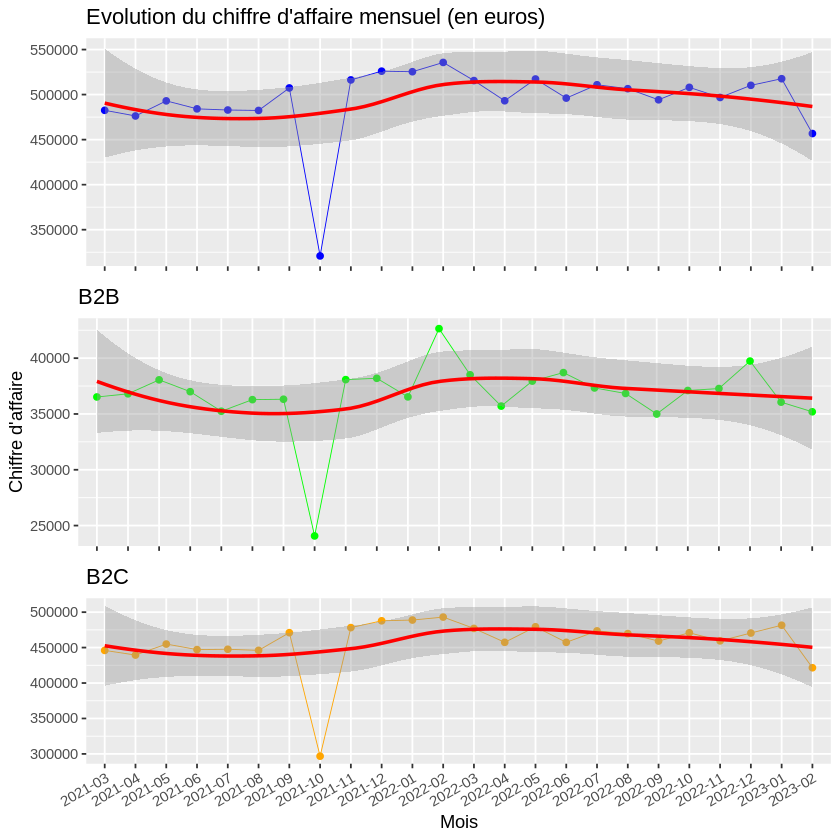

In [14]:
# Transactions_Produits_Clients_mois <- Transactions_Produits_Clients %>%
#   group_by(date = cut(date, breaks = "month")) %>%
#   summarise(CA_mois = sum(price))
# # Transactions_Produits_Clients_mois

# Transactions_Produits_Clients_mois_B2B <- Transactions_Produits_Clients_B2B %>%
#   group_by(date = cut(date, breaks = "month")) %>%
#   summarise(CA_mois_B2B = sum(price)/1000)

# # Transactions_Produits_Clients_mois_B2B

# Transactions_Produits_Clients_mois_B2C <- Transactions_Produits_Clients_B2C %>%
#   group_by(date = cut(date, breaks = "month")) %>%
#   summarise(CA_mois_B2C = sum(price)/1000) 
# Transactions_Produits_Clients_mois_B2C

#Totale
Transactions_Produits_Clients_mois <- Transactions_Produits_Clients %>%
  group_by(mois) %>%
  summarise(CA_mois = sum(price))
Transactions_Produits_Clients_mois <- Transactions_Produits_Clients_mois[order(Transactions_Produits_Clients_mois$CA_mois, 
                                                                  decreasing = TRUE),]
# dim(Transactions_Produits_Clients_mois) #24   2

#B2B
Transactions_Produits_Clients_mois_B2B <- Transactions_Produits_Clients_B2B %>%
  group_by(mois) %>%
  summarise(CA_mois_B2B = sum(price))
Transactions_Produits_Clients_mois_B2B <- Transactions_Produits_Clients_mois_B2B[order(Transactions_Produits_Clients_mois_B2B$CA_mois_B2B, 
                                                                  decreasing = TRUE),]
# dim(Transactions_Produits_Clients_mois_B2B) #24   2

# B2C
Transactions_Produits_Clients_mois_B2C <- Transactions_Produits_Clients_B2C %>%
  group_by(mois) %>%
  summarise(CA_mois_B2C = sum(price))
Transactions_Produits_Clients_mois_B2C <- Transactions_Produits_Clients_mois_B2C[order(Transactions_Produits_Clients_mois_B2C$CA_mois_B2C, 
                                                                  decreasing = TRUE),]
# dim(Transactions_Produits_Clients_mois_B2C) #24   2

# Create the table Transactions_Produits_Clients_semaine
table1 <- head(Transactions_Produits_Clients_mois, 10)

# Create the table Transactions_Produits_Clients_semaine_B2B
table2 <- head(Transactions_Produits_Clients_mois_B2B, 10)

# Create the table Transactions_Produits_Clients_semaine_B2C
table3 <- head(Transactions_Produits_Clients_mois_B2C, 10)

# Combine the tables
cbind(table1, table2, table3)
# ggplot(data=Transactions_Produits_Clients_mois, aes(x=mois, y=CA_mois, group=1)) +
#   geom_line(color="red")+
#   geom_point(color="red") +
#   theme(axis.text.x = element_text(angle=30, hjust=1))+
#   labs(x = "Mois", y = "CA_mois", 
#        title = "CA par mois")

# ggplot(data=Transactions_Produits_Clients_mois_B2B, aes(x=mois, y=CA_mois_B2B, group=1)) +
#   geom_line(color="green")+
#   geom_point(color="green") +
#   theme(axis.text.x = element_text(angle=30, hjust=1))+
#   labs(x = "Mois", y = "CA_mois_B2B", 
#        title = "CA par mois pour B2B")

# ggplot(data=Transactions_Produits_Clients_mois_B2C, aes(x=mois, y=CA_mois_B2C, group=1)) +
#   geom_line(color="blue")+
#   geom_point(color="blue") +
#   theme(axis.text.x = element_text(angle=30, hjust=1))+
#   labs(x = "Mois", y = "CA_mois_B2C", 
#        title = "CA par mois pour B2C")

# Set the figure size
# options(repr.plot.width=16, repr.plot.height=9)
# Create the plot TOTALE
plot_totale <- ggplot(data = Transactions_Produits_Clients_mois, aes(x = mois, y = CA_mois, group = 1)) +
  geom_line(size = 0.25, color = "blue") +
  geom_point(color="blue") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "Evolution du chiffre d'affaire mensuel (en euros)", x = NULL, y = "") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2B
plot_b2b <- ggplot(data = Transactions_Produits_Clients_mois_B2B, aes(x = mois, y = CA_mois_B2B, group = 1)) +
  geom_line(size = 0.25, color = "green") +
  geom_point(color="green") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2B", x = NULL, y = "Chiffre d'affaire") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2C
plot_b2c <- ggplot(data = Transactions_Produits_Clients_mois_B2C, aes(x = mois, y = CA_mois_B2C, group = 1)) +
    geom_line( size = 0.25, color = "orange") +
    geom_point(color="orange") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2C", x = "Mois", y = "") +
  theme(axis.text.x = element_text(angle = 30, hjust = 1)) +
  theme(legend.position = "bottom")

# Combine the plots
grid.arrange(plot_totale, plot_b2b, plot_b2c, ncol = 1)
# Display the plot
# plot

## Analyse de l'évolution du chiffre d'affaires par semaine :

date,CA_semaine,date,CA_semaine_B2B,date,CA_semaine_B2C
<chr>,<dbl>,<fct>,<dbl>,<fct>,<dbl>
2022-02-14,136457.8,2022-02-14,12629.100,2022-02-21,124109.8
2022-02-07,135187.9,2022-02-07,11196.700,2022-02-07,123991.2
2022-02-21,133157.7,2022-06-06,10495.660,2022-02-14,123828.7
2022-01-31,128661.9,2022-12-05,10031.558,2022-01-31,119368.2
2021-11-22,124184.1,2022-12-12,9998.760,2021-11-22,115287.2
2021-09-20,122401.7,2021-07-12,9957.470,2021-12-27,113492.0
2022-12-12,122115.0,2021-04-19,9913.038,2021-09-20,113476.6
2021-11-29,121455.9,2021-05-17,9821.390,2021-11-29,112988.8
2021-12-27,121370.7,2022-09-12,9770.580,2022-12-12,112116.2


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


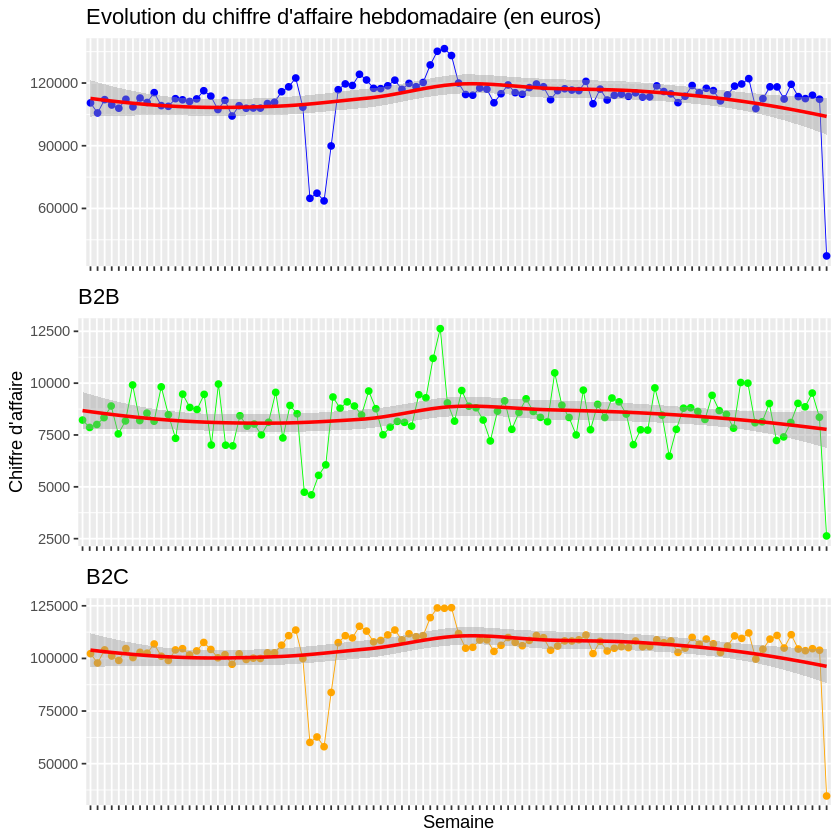

In [15]:
Transactions_Produits_Clients_semaine <- Transactions_Produits_Clients %>%
  group_by(date = cut(date, breaks = "week")) %>%
  summarise(CA_semaine = sum(price))
Transactions_Produits_Clients_semaine <- setDT(Transactions_Produits_Clients_semaine)
Transactions_Produits_Clients_semaine <- Transactions_Produits_Clients_semaine[, date := as.character(date)]
Transactions_Produits_Clients_semaine <- Transactions_Produits_Clients_semaine[order(Transactions_Produits_Clients_semaine$CA_semaine, 
                                                                  decreasing = TRUE),]

Transactions_Produits_Clients_semaine_B2B <- Transactions_Produits_Clients_B2B %>%
  group_by(date = cut(date, breaks = "week")) %>%
  summarise(CA_semaine_B2B = sum(price))

Transactions_Produits_Clients_semaine_B2B <- Transactions_Produits_Clients_semaine_B2B[order(Transactions_Produits_Clients_semaine_B2B$CA_semaine_B2B, 
                                                                   decreasing = TRUE),]

Transactions_Produits_Clients_semaine_B2C <- Transactions_Produits_Clients_B2C %>%
  group_by(date = cut(date, breaks = "week")) %>%
  summarise(CA_semaine_B2C = sum(price))

Transactions_Produits_Clients_semaine_B2C <- Transactions_Produits_Clients_semaine_B2C[order(Transactions_Produits_Clients_semaine_B2C$CA_semaine_B2C, 
                                                                   decreasing = TRUE),]

# Create the table Transactions_Produits_Clients_semaine
table1 <- head(Transactions_Produits_Clients_semaine, 10)

# Create the table Transactions_Produits_Clients_semaine_B2B
table2 <- head(Transactions_Produits_Clients_semaine_B2B, 10)

# Create the table Transactions_Produits_Clients_semaine_B2C
table3 <- head(Transactions_Produits_Clients_semaine_B2C, 10)

# Combine the tables
cbind(table1, table2, table3)
# # Create the table Transactions_Produits_Clients_semaine
# table1 <- head(Transactions_Produits_Clients_semaine, 10)
# # Create the table Transactions_Produits_Clients_semaine_B2B
# table2 <- head(Transactions_Produits_Clients_semaine_B2B, 10)
# # Create the table Transactions_Produits_Clients_semaine_B2C
# table3 <- head(Transactions_Produits_Clients_semaine_B2C, 10)
# # Combine the tables
# grid.arrange(table1, table2, table3, ncol = 3)

# ggplot(data=Transactions_Produits_Clients_semaine, aes(x=date, y=CA_semaine, group=1)) +
#   geom_line(color="blue")+
#   geom_point(color="blue") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "semaine", y = "CA_semaine", 
#        title = "CA par semaine")

# ggplot(data=Transactions_Produits_Clients_semaine_B2B, aes(x=date, y=CA_semaine_B2B, group=1)) +
#   geom_line(color="green")+
#   geom_point(color="green") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "semaine", y = "CA_semaine_B2B", 
#        title = "CA par semaine pour B2B")

# ggplot(data=Transactions_Produits_Clients_semaine_B2C, aes(x=date, y=CA_semaine_B2C, group=1)) +
#   geom_line(color="orange")+
#   geom_point(color="orange") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "semaine", y = "CA_semaine_B2C", 
#        title = "CA par semaine pour B2C")

# Create the plot TOTALE
plot_totale <- ggplot(data = Transactions_Produits_Clients_semaine, aes(x = date, y = CA_semaine, group = 1)) +
  geom_line(size = 0.25, color = "blue") +
  geom_point(color="blue") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "Evolution du chiffre d'affaire hebdomadaire (en euros)", x = NULL, y = "") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2B
plot_b2b <- ggplot(data = Transactions_Produits_Clients_semaine_B2B, aes(x = date, y = CA_semaine_B2B, group = 1)) +
  geom_line(size = 0.25, color = "green") +
  geom_point(color="green") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2B", x = NULL, y = "Chiffre d'affaire") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2C
plot_b2c <- ggplot(data = Transactions_Produits_Clients_semaine_B2C, aes(x = date, y = CA_semaine_B2C, group = 1)) +
  geom_line( size = 0.25, color = "orange") +
  geom_point(color="orange") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2C", x = "Semaine", y = "") +
theme(axis.text.x = element_blank()) +
  # theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  theme(legend.position = "bottom")

# Combine the plots
grid.arrange(plot_totale, plot_b2b, plot_b2c, ncol = 1)


## Analyse de l'évolution du chiffre d'affaires par jour :

date,CA_jour,date,CA_jour_B2B,date,CA_jour_B2C
<chr>,<dbl>,<fct>,<dbl>,<fct>,<dbl>
2022-07-24,20498.32,2022-02-10,2745.50,2022-07-24,19166.54
2022-05-15,20462.51,2021-12-07,2157.74,2022-02-24,19017.56
2022-02-24,20349.34,2022-06-07,2157.74,2022-02-11,18890.98
2022-02-15,20313.53,2022-08-07,2157.74,2022-02-26,18836.10
2022-09-15,20313.53,2022-12-07,2157.74,2021-11-30,18573.62
2022-06-14,20146.21,2022-02-15,2125.37,2022-05-15,18337.14
2022-12-14,20146.21,2022-05-15,2125.37,2022-02-15,18188.16
2022-02-14,19997.23,2022-09-15,2125.37,2022-09-15,18188.16
2022-02-11,19924.33,2021-06-08,2068.64,2022-02-20,18134.23


`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


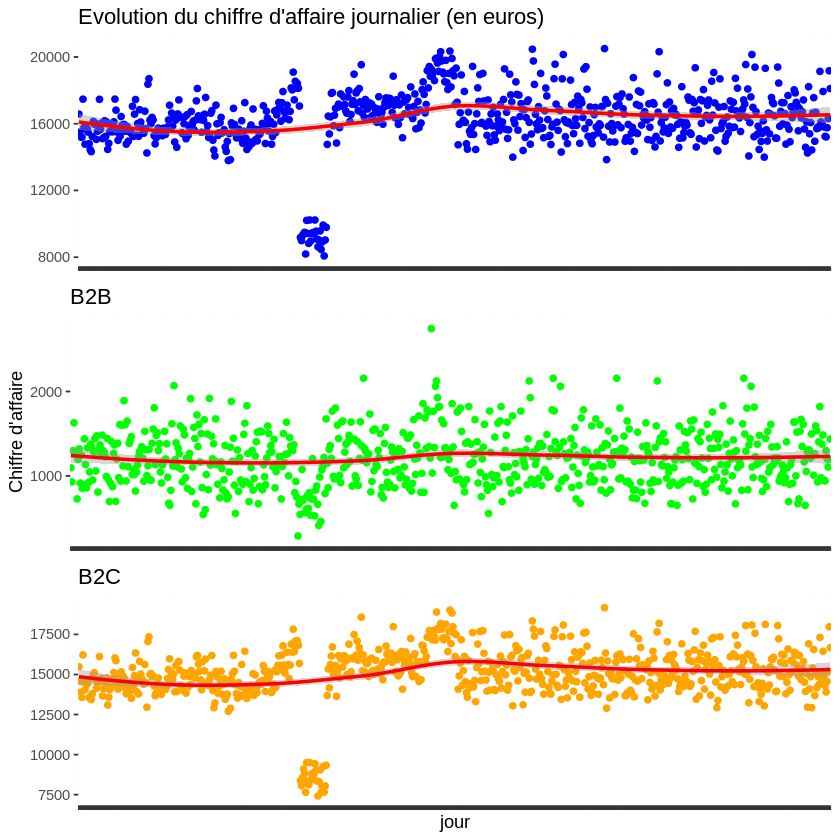

In [16]:
Transactions_Produits_Clients_jour <- Transactions_Produits_Clients %>%
  group_by(date = cut(date, breaks = "day")) %>%
  summarise(CA_jour = sum(price))
Transactions_Produits_Clients_jour <- setDT(Transactions_Produits_Clients_jour)
Transactions_Produits_Clients_jour <- Transactions_Produits_Clients_jour[, date := as.character(date)]
Transactions_Produits_Clients_jour <- Transactions_Produits_Clients_jour[order(Transactions_Produits_Clients_jour$CA_jour, 
                                                                                     decreasing = TRUE),]

Transactions_Produits_Clients_jour_B2B <- Transactions_Produits_Clients_B2B %>%
  group_by(date = cut(date, breaks = "day")) %>%
  summarise(CA_jour_B2B = sum(price))

Transactions_Produits_Clients_jour_B2B <- Transactions_Produits_Clients_jour_B2B[order(Transactions_Produits_Clients_jour_B2B$CA_jour_B2B, 
                                                                                             decreasing = TRUE),]

Transactions_Produits_Clients_jour_B2C <- Transactions_Produits_Clients_B2C %>%
  group_by(date = cut(date, breaks = "day")) %>%
  summarise(CA_jour_B2C = sum(price))

Transactions_Produits_Clients_jour_B2C <- Transactions_Produits_Clients_jour_B2C[order(Transactions_Produits_Clients_jour_B2C$CA_jour_B2C, 
                                                                                             decreasing = TRUE),]

# Create the table Transactions_Produits_Clients_jour
table1 <- head(Transactions_Produits_Clients_jour, 10)

# Create the table Transactions_Produits_Clients_jour_B2B
table2 <- head(Transactions_Produits_Clients_jour_B2B, 10)

# Create the table Transactions_Produits_Clients_jour_B2C
table3 <- head(Transactions_Produits_Clients_jour_B2C, 10)

# Combine the tables
cbind(table1, table2, table3)

# ggplot(data=Transactions_Produits_Clients_jour, aes(x=date, y=CA_jour, group=1)) +
#   geom_line(color="red")+
#   geom_point(color="red") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "jour", y = "CA_jour", 
#        title = "CA par jour")

# ggplot(data=Transactions_Produits_Clients_jour_B2B, aes(x=date, y=CA_jour_B2B, group=1)) +
#   geom_line(color="green")+
#   geom_point(color="green") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "jour", y = "CA_jour_B2B", 
#        title = "CA par jour pour B2B")

# ggplot(data=Transactions_Produits_Clients_jour_B2C, aes(x=date, y=CA_jour_B2C, group=1)) +
#   geom_line(color="blue")+
#   geom_point(color="blue") +
#   theme(axis.text.x = element_text(angle=90, hjust=1))+
#   labs(x = "jour", y = "CA_jour_B2C", 
#        title = "CA par jour pour B2C")

# Create the plot TOTALE
plot_totale <- ggplot(data = Transactions_Produits_Clients_jour, aes(x = date, y = CA_jour, group = 1)) +
  # geom_line(size = 0.25, color = "blue") +
  geom_point(color="blue") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "Evolution du chiffre d'affaire journalier (en euros)", x = NULL, y = "") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2B
plot_b2b <- ggplot(data = Transactions_Produits_Clients_jour_B2B, aes(x = date, y = CA_jour_B2B, group = 1)) +
  # geom_line(size = 0.25, color = "green") +
  geom_point(color="green") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2B", x = NULL, y = "Chiffre d'affaire") +
  theme(axis.text.x = element_blank()) +
  theme(legend.position = "bottom")

# Create the plot B2C
plot_b2c <- ggplot(data = Transactions_Produits_Clients_jour_B2C, aes(x = date, y = CA_jour_B2C, group = 1)) +
  # geom_line( size = 0.25, color = "orange") +
  geom_point(color="orange") +
  geom_smooth(method = "loess", size = 1, color = "red") +
  labs(title = "B2C", x = "jour", y = "") +
  theme(axis.text.x = element_blank()) +
  # theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  theme(legend.position = "bottom")

# Combine the plots
grid.arrange(plot_totale, plot_b2b, plot_b2c, ncol = 1)


## Analyse de l'évolution du chiffre d'affaires par jour :

nom_jour,CA_jour,nom_jour,CA_jour_B2B,nom_jour,CA_jour_B2C
<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>
Monday,1714470,Monday,129390.0,Monday,1585080
Tuesday,1711878,Tuesday,128216.1,Tuesday,1583661
Thursday,1692742,Wednesday,128063.6,Sunday,1567453
Sunday,1689445,Thursday,126268.7,Thursday,1566473
Wednesday,1687002,Friday,124558.5,Friday,1560165
Friday,1684724,Saturday,122637.3,Wednesday,1558938
Saturday,1675820,Sunday,121992.1,Saturday,1553183


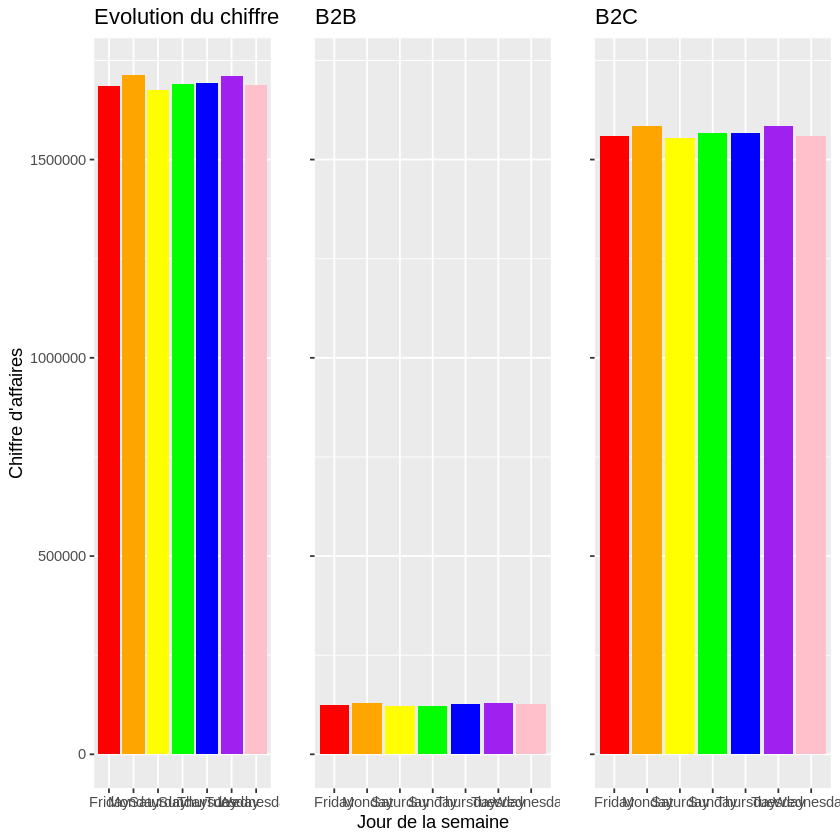

In [17]:
Transactions_Produits_Clients$date <- as.Date(Transactions_Produits_Clients$date)

# Grouper les données par jour de la semaine
Transactions_Produits_Clients_jour <- Transactions_Produits_Clients %>%
  mutate(nom_jour = weekdays(date)) %>%
  group_by(nom_jour) %>%
  summarise(CA_jour = sum(price)) %>%
  arrange(desc(CA_jour))
Transactions_Produits_Clients_jour <- Transactions_Produits_Clients_jour[order(Transactions_Produits_Clients_jour$CA_jour, 
decreasing = TRUE),]
Transactions_Produits_Clients_jour <- setDT(Transactions_Produits_Clients_jour)


# Grouper les données par jour de la semaine pour B2B
Transactions_Produits_Clients_jour_B2B <- Transactions_Produits_Clients_B2B %>%
  mutate(nom_jour = weekdays(date)) %>%
  group_by(nom_jour) %>%
  summarise(CA_jour_B2B = sum(price)) %>%
  arrange(desc(CA_jour_B2B))
Transactions_Produits_Clients_jour_B2B <- Transactions_Produits_Clients_jour_B2B[order(Transactions_Produits_Clients_jour_B2B$CA_jour_B2B, 
decreasing = TRUE),]
Transactions_Produits_Clients_jour_B2B <- setDT(Transactions_Produits_Clients_jour_B2B)

# Grouper les données par jour de la semaine pour B2C
Transactions_Produits_Clients_jour_B2C <- Transactions_Produits_Clients_B2C %>%
  mutate(nom_jour = weekdays(date)) %>%
  group_by(nom_jour) %>%
  summarise(CA_jour_B2C = sum(price)) %>%
  arrange(desc(CA_jour_B2C))
Transactions_Produits_Clients_jour_B2C <- Transactions_Produits_Clients_jour_B2C[order(Transactions_Produits_Clients_jour_B2C$CA_jour_B2C, 
decreasing = TRUE),]
Transactions_Produits_Clients_jour_B2C <- setDT(Transactions_Produits_Clients_jour_B2C)

# Create the table Transactions_Produits_Clients_jour
table1 <- head(Transactions_Produits_Clients_jour, 10)

# Create the table Transactions_Produits_Clients_jour_B2B
table2 <- head(Transactions_Produits_Clients_jour_B2B, 10)

# Create the table Transactions_Produits_Clients_jour_B2C
table3 <- head(Transactions_Produits_Clients_jour_B2C, 10)

# Combine the tables
cbind(table1, table2, table3)


# Créer le premier graphique
# plot1 <- ggplot(data = Transactions_Produits_Clients_jour, aes(x = nom_jour, y = CA_jour, fill = nom_jour)) +
#   geom_bar(stat = "identity") +
#   labs(x = "", y = "", 
#        title = "Chiffre d'affaires par jour de la semaine") +
#   theme(axis.text.x = element_blank()) +
#   theme(legend.position = "none") +
#   ylim(0,1800000)

# # Créer le deuxième graphique
# plot2 <- ggplot(data = Transactions_Produits_Clients_jour_B2B, aes(x = nom_jour, y = CA_jour_B2B, fill = nom_jour)) +
#   geom_bar(stat = "identity") +
#   labs(x = "", y = "Chiffre d'affaires", 
#        title = "Chiffre d'affaires par jour de la semaine pour B2B") +
#   theme(axis.text.x = element_blank()) +
#   theme(legend.position = "none") +
#   ylim(0,1800000)

# # Créer le troisième graphique
# plot3 <- ggplot(data = Transactions_Produits_Clients_jour_B2C, aes(x = nom_jour, y = CA_jour_B2C, fill = nom_jour)) +
#   geom_bar(stat = "identity") +
#   labs(x = "Jour de la semaine", y = "", 
#        title = "Chiffre d'affaires par jour de la semaine pour B2C") +
#   theme(legend.position = "none") +
#   ylim(0,1800000)

# # Combinez les trois graphiques en un seul
# grid.arrange(plot1, plot2, plot3, ncol = 1)


# Create the plot Transactions_Produits_Clients_jour
plot1 <- ggplot(data = Transactions_Produits_Clients_jour, aes(x = nom_jour, y = CA_jour, fill = nom_jour)) +
  geom_bar(stat = "identity") +
  labs(x = "", y = "Chiffre d'affaires", 
       title = "Evolution du chiffre d'affaire par jour de la semaine") +
  scale_fill_manual(values = c("red", "orange", "yellow", "green", "blue", "purple", "pink")) +
  theme(legend.position = "none")+
  ylim(0,1720000)

# Create the plot Transactions_Produits_Clients_jour_B2B
plot2 <- ggplot(data = Transactions_Produits_Clients_jour_B2B, aes(x = nom_jour, y = CA_jour_B2B, fill = nom_jour)) +
  geom_bar(stat = "identity") +
  labs(x = "Jour de la semaine", y = "", 
       title = "B2B") +
  scale_fill_manual(values = c("red", "orange", "yellow", "green", "blue", "purple", "pink")) +
  theme(legend.position = "none")+  
theme(axis.text.y = element_blank()) +
  ylim(0,1720000) 

# Create the plot Transactions_Produits_Clients_jour_B2C
plot3 <- ggplot(data = Transactions_Produits_Clients_jour_B2C, aes(x = nom_jour, y = CA_jour_B2C, fill = nom_jour)) +
  geom_bar(stat = "identity") +
  labs(x = "", y = "", 
       title = "B2C") +
  scale_fill_manual(values = c("red", "orange", "yellow", "green", "blue", "purple", "pink")) +
  theme(legend.position = "none")+
  ylim(0,1720000) + theme(axis.text.y = element_blank())

# Combine the plots
grid.arrange(plot1, plot2, plot3, ncol = 3)


### Courbe de Lorenz de CA_client

[1] "Indice de Gini en totale est égal à 0.446"

[1] "Indice de Gini pour B2B est égal à 0.218"

[1] "Indice de Gini pour B2C est égal à 0.403"

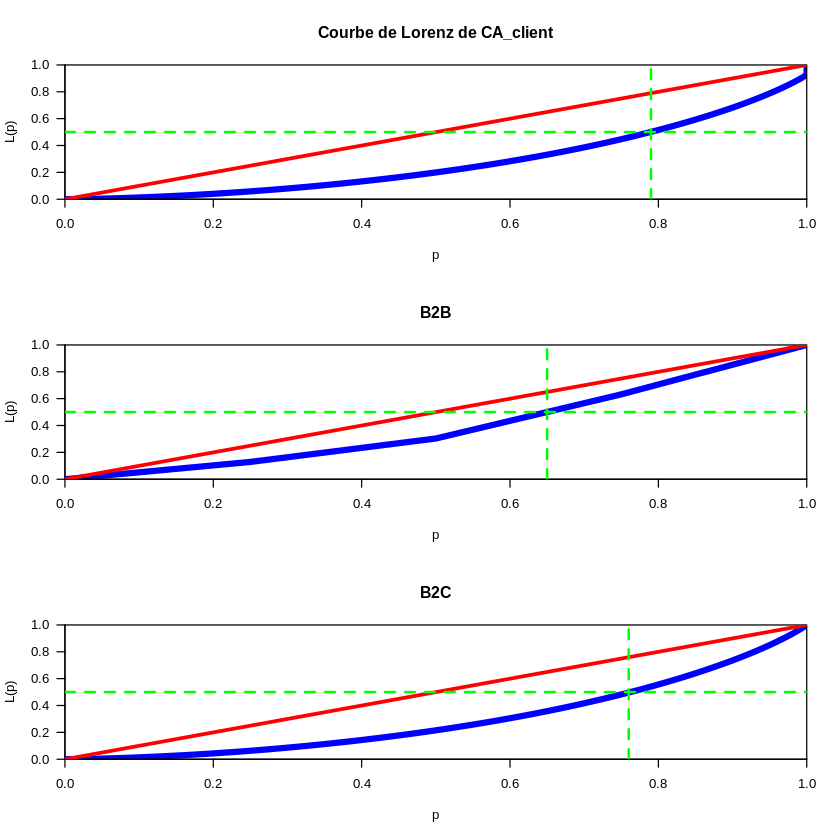

In [18]:
# Extraire la variable CA_client de la base de données
CA_client <- frequence_achat_Taile_panier$CA_client
CA_client_B2B <- frequence_achat_Taile_panier_B2B$CA_client
CA_client_B2C <- frequence_achat_Taile_panier_B2C$CA_client

# Calculer la courbe de Lorenz
lorenz_CA_client <- Lc(CA_client)
lorenz_CA_client_B2B <- Lc(CA_client_B2B)
lorenz_CA_client_B2C <- Lc(CA_client_B2C)

# Tracer les courbes de Lorenz
par(mfrow = c(3, 1))
plot(lorenz_CA_client, col = "blue", lwd = 5, main = "Courbe de Lorenz de CA_client")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.79, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

plot(lorenz_CA_client_B2B, col = "blue", lwd = 5, main = "B2B")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.65, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

plot(lorenz_CA_client_B2C, col = "blue", lwd = 5, main = "B2C")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.76, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

# Calculer l'indice de Gini
gini_CA <- Gini(CA_client)
paste("Indice de Gini en totale est égal à", round(gini_CA, 3))

# Calculer l'indice de Gini pour B2B
gini_CA_B2B <- Gini(CA_client_B2B)
paste("Indice de Gini pour B2B est égal à", round(gini_CA_B2B, 3))

# Calculer l'indice de Gini pour B2C
gini_CA_B2C <- Gini(CA_client_B2C)
paste("Indice de Gini pour B2C est égal à", round(gini_CA_B2C, 3))

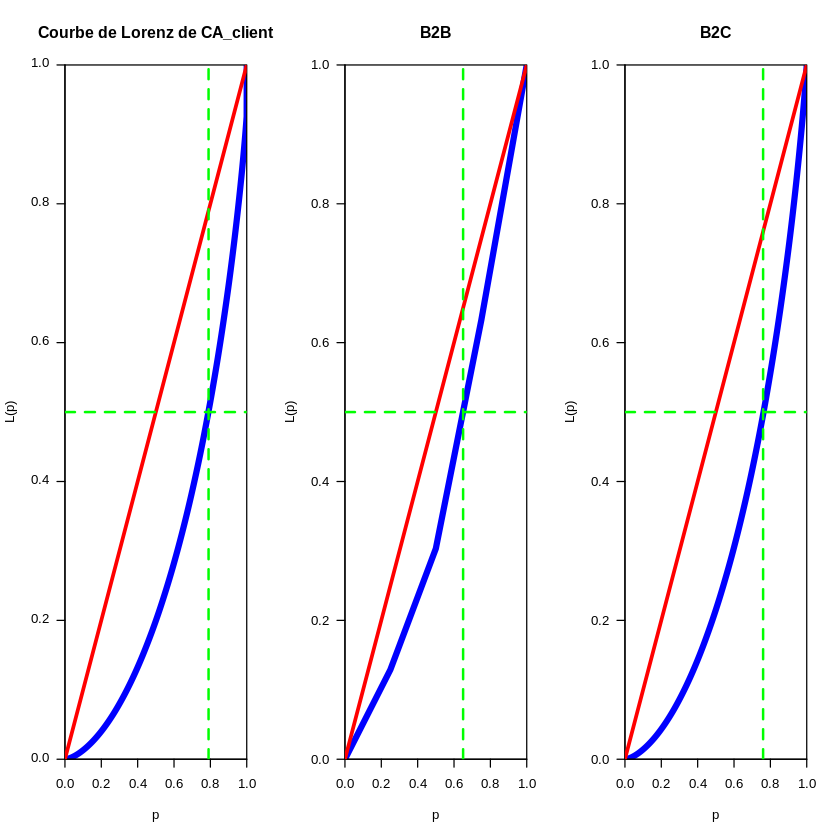

In [19]:
# Extraire la variable CA_client de la base de données
CA_client <- frequence_achat_Taile_panier$CA_client
CA_client_B2B <- frequence_achat_Taile_panier_B2B$CA_client
CA_client_B2C <- frequence_achat_Taile_panier_B2C$CA_client

# Calculer la courbe de Lorenz
lorenz_CA_client <- Lc(CA_client)
lorenz_CA_client_B2B <- Lc(CA_client_B2B)
lorenz_CA_client_B2C <- Lc(CA_client_B2C)

# Tracer les courbes de Lorenz
par(mfrow = c(1, 3))
plot(lorenz_CA_client, col = "blue", lwd = 5, main = "Courbe de Lorenz de CA_client")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.79, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

plot(lorenz_CA_client_B2B, col = "blue", lwd = 5, main = "B2B")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.65, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

plot(lorenz_CA_client_B2C, col = "blue", lwd = 5, main = "B2C")
abline(0, 1, col = "red", lwd = 3, lty = 1)
abline(v = 0.76, col = "green", lwd = 2, lty = 2)
abline(h = 0.5, col = "green", lwd = 2, lty = 2)

# # Calculer l'indice de Gini
# gini_CA <- Gini(CA_client)
# cat(paste("L'indice de Gini en totale est égal à", round(gini_CA, 3)))

# # Calculer l'indice de Gini pour B2B
# gini_CA_B2B <- Gini(CA_client_B2B)
# cat(paste("L'indice de Gini pour B2B est égal à", round(gini_CA_B2B, 3)))

# # Calculer l'indice de Gini pour B2C
# gini_CA_B2C <- Gini(CA_client_B2C)
# cat(paste("L'indice de Gini pour B2C est égal à", round(gini_CA_B2C, 3)))

*On constate que 79% des ventes représentent 50% du montant total des prix de vente. Ce n'est pas une égalité totale, mais acceptable dans notre contexte business.*

*Confirmation avec l'indice de Gini plus proche de 0 que de 1, les prix pratiqués ont tendance à être équitables.*

### **Total_chiffre_affaire_B2B & B2C**

In [20]:
fun_ca_prop <- function(str_client_type, table_transactions, float_total_ca){
  total_ca_client_type <- sum(table_transactions$price)
  print(paste("Le chiffre d'affaire totale pour",
              str_client_type, "est :",
              format(total_ca_client_type)))
  print(paste("La proportion de chiffre d'affaires pour les clients",
              str_client_type,
              "par rapport de chiffre d'affaires totales est :",
              format(total_ca_client_type * 100.0 / float_total_ca, digits=4), "%."))
}
fun_ca_prop1 <- function(table_transactions){
  total_ca_client_type <- sum(table_transactions$price)
}

[1] "Le chiffre d'affaire totale pour B2B est : 881126.3"
[1] "La proportion de chiffre d'affaires pour les clients B2B par rapport de chiffre d'affaires totales est : 7.432 %."
[1] "Le chiffre d'affaire totale pour B2C est : 10974953"
[1] "La proportion de chiffre d'affaires pour les clients B2C par rapport de chiffre d'affaires totales est : 92.57 %."


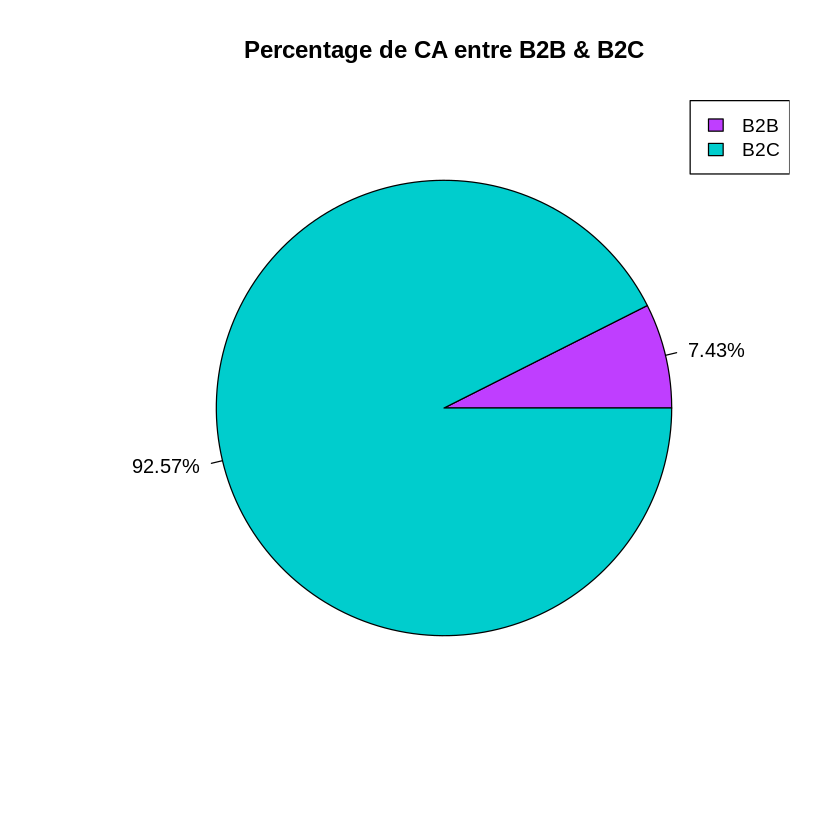

In [21]:
fun_ca_prop("B2B", Transactions_Produits_Clients_B2B, Total_chiffre_affaire)
fun_ca_prop("B2C", Transactions_Produits_Clients_B2C, Total_chiffre_affaire)
Total_chiffre_affaire_B2B <-fun_ca_prop1(Transactions_Produits_Clients_B2B)
Total_chiffre_affaire_B2C <-fun_ca_prop1(Transactions_Produits_Clients_B2C)

x <- c(Total_chiffre_affaire_B2B*100/Total_chiffre_affaire, 
     Total_chiffre_affaire_B2C*100/Total_chiffre_affaire)
labels <- c("B2B","B2C")
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de CA entre B2B & B2C", col = colors_for_B2B_B2C)
legend("topright", c("B2B","B2C"), cex = 0.96,
   fill = colors_for_B2B_B2C)

### Calcul de CA, frequence_achat & Taile_panier par Mois

In [22]:
#CA_Client, frequence_achat & Taile_panier
#CA_Client
tot_achats <- Transactions_Produits_Clients %>%
  group_by(client_id,sex,sex_numeric,age,categ,mois) %>%
  summarise(CA_client = sum(price))
dim(tot_achats) # 221329    7
# head(tot_achats)

#Calcul du frequence_achat
nombre_sessions_par_client <- Transactions_Produits_Clients %>%
  group_by(client_id,categ_character,mois) %>%
  summarise(frequence_achat = n_distinct(session_id))
dim(nombre_sessions_par_client) #221329    4
# head(nombre_sessions_par_client,3)

# Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
frequence_achat_Taile_panier_mois <- merge(tot_achats, nombre_sessions_par_client, by = c("client_id", "mois"))
frequence_achat_Taile_panier_mois <- frequence_achat_Taile_panier_mois %>% mutate(Taile_panier_moyenne =CA_client/frequence_achat)
frequence_achat_Taile_panier_mois <- frequence_achat_Taile_panier_mois %>% mutate(Per_CA_client = as.numeric(CA_client) * 100/ as.numeric(Total_chiffre_affaire))
frequence_achat_Taile_panier_mois <- frequence_achat_Taile_panier_mois[order(frequence_achat_Taile_panier_mois$frequence_achat, 
                                                                               decreasing = TRUE),]

frequence_achat_Taile_panier_mois <- setDT(frequence_achat_Taile_panier_mois)
dim(frequence_achat_Taile_panier_mois) #221329      11
head(frequence_achat_Taile_panier_mois,3)

frequence_achat_Taile_panier_B2B_mois <- frequence_achat_Taile_panier_mois [client_id == "c_1609"| 
                                                                                client_id == "c_4958"|
                                                                                client_id == "c_6714"|
                                                                                client_id == "c_3454",]
frequence_achat_Taile_panier_B2B_mois <- frequence_achat_Taile_panier_B2B_mois[,-c("sex","age","sex_numeric")]
frequence_achat_Taile_panier_B2B_mois <- setDT(frequence_achat_Taile_panier_B2B_mois)
dim(frequence_achat_Taile_panier_B2B_mois)
head(frequence_achat_Taile_panier_B2B_mois) #242   8

frequence_achat_Taile_panier_B2C_mois <- frequence_achat_Taile_panier_mois [client_id != "c_1609"& 
                                                                                client_id !="c_4958"&
                                                                                client_id !="c_6714"&
                                                                                client_id !="c_3454",]
frequence_achat_Taile_panier_B2C_mois <- setDT(frequence_achat_Taile_panier_B2C_mois)


frequence_achat_Taile_panier_B2C_mois[age<"32",age_tranche:="<32"]
frequence_achat_Taile_panier_B2C_mois[age>="32" & age<="51",age_tranche:="32-51"]
frequence_achat_Taile_panier_B2C_mois[age>"51",age_tranche:=">51"]
dim(frequence_achat_Taile_panier_B2C_mois) #8596       9
frequence_achat_Taile_panier_B2C_mois[,.N,age_tranche]
head(frequence_achat_Taile_panier_B2C_mois,3) #221087     12

`summarise()` has grouped output by 'client_id', 'sex', 'sex_numeric', 'age',
'categ'. You can override using the `.groups` argument.


[1] 221329      7

`summarise()` has grouped output by 'client_id', 'categ_character'. You can
override using the `.groups` argument.


[1] 221329      4

[1] 398743     11

client_id,mois,sex,sex_numeric,age,categ,CA_client,categ_character,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<dbl>,<chr>,<int>,<dbl>,<dbl>
c_1609,2021-09,m,1,43,0,12549.99,0,477,26.3102516,0.105852780
c_1609,2021-09,m,1,43,1,4696.15,0,477,9.8451782,0.039609636
c_1609,2021-09,m,1,43,2,145.99,0,477,0.3060587,0.001231351


[1] 634   8

client_id,mois,categ,CA_client,categ_character,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<int>,<dbl>,<chr>,<int>,<dbl>,<dbl>
c_1609,2021-09,0,12549.99,0,477,26.3102516,0.105852780
c_1609,2021-09,1,4696.15,0,477,9.8451782,0.039609636
c_1609,2021-09,2,145.99,0,477,0.3060587,0.001231351
c_1609,2021-12,0,10643.55,0,466,22.8402361,0.089772929
c_1609,2021-12,1,6343.24,0,466,13.6121030,0.053502002
c_1609,2021-10,0,10641.08,0,450,23.6468444,0.089752095


[1] 398109     12

age_tranche,N
<chr>,<int>
32-51,189589
>51,132930
<32,75590


client_id,mois,sex,sex_numeric,age,categ,CA_client,categ_character,frequence_achat,Taile_panier_moyenne,Per_CA_client,age_tranche
<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<dbl>,<chr>,<int>,<dbl>,<dbl>,<chr>
c_8556,2021-10,m,1,47,1,61.85,0,15,4.123333,0.0005216733,32-51
c_8556,2021-10,m,1,47,0,351.06,0,15,23.404000,0.0029610125,32-51
c_5921,2022-07,m,1,45,1,185.10,0,14,13.221429,0.0015612243,32-51


### Calcul de CA, frequence_achat & Taile_panier par categ

In [23]:
# #CA_Client, frequence_achat & Taile_panier
# #CA_Client
# tot_achats <- Transactions_Produits_Clients %>%
#   group_by(age,categ_character) %>%
#   summarise(CA_client = sum(price))
# dim(tot_achats) #19946   7
# head(tot_achats)

# #Calcul du frequence_achat
# nombre_sessions_par_client <- Transactions_Produits_Clients %>%
#   group_by(age,categ_character) %>%
#   summarise(frequence_achat = n_distinct(session_id))
# dim(nombre_sessions_par_client) #8600  2
# head(nombre_sessions_par_client,3)

# # Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
# frequence_achat_Taile_panier_B2C_categ <- merge(tot_achats, nombre_sessions_par_client, by = c("age", "categ_character"))
# frequence_achat_Taile_panier_B2C_categ <- frequence_achat_Taile_panier_B2C_categ %>% mutate(Taile_panier_moyenne =CA_client/frequence_achat)
# frequence_achat_Taile_panier_B2C_categ <- frequence_achat_Taile_panier_B2C_categ %>% mutate(Per_CA_client = as.numeric(CA_client) * 100/ as.numeric(Total_chiffre_affaire_B2C))
# # frequence_achat_Taile_panier_categ <- frequence_achat_Taile_panier_categ[order(frequence_achat_Taile_panier_categ$frequence_achat, 
# #                                                                    decreasing = TRUE),]
# frequence_achat_Taile_panier_B2C_categ <- setDT(frequence_achat_Taile_panier_B2C_categ)
# dim(frequence_achat_Taile_panier_B2C_categ) #19946   10
# head(frequence_achat_Taile_panier_B2C_categ,10)


# # dim(frequence_achat_Taile_panier_B2C_categ)
# # head(frequence_achat_Taile_panier_B2C_categ)
# #frequence_achat_Taile_panier_B2C_categ
# frequence_achat_Taile_panier_B2C_categ[age<"32",age_tranche:="<32"]
# frequence_achat_Taile_panier_B2C_categ[age>="32" & age<="51",age_tranche:="32-51"]
# frequence_achat_Taile_panier_B2C_categ[age>"51",age_tranche:=">51"]
# frequence_achat_Taile_panier_B2C_categ$age_tranche <- factor(frequence_achat_Taile_panier_B2C_categ$age_tranche, levels = c("<32", "32-51", ">51"))
# dim(frequence_achat_Taile_panier_B2C_categ)
# frequence_achat_Taile_panier_B2C_categ[,.N,age_tranche]
# head(frequence_achat_Taile_panier_B2C_categ)

In [24]:
#CA_Client, frequence_achat & Taile_panier
#CA_Client
tot_achats <- Transactions_Produits_Clients %>%
  group_by(client_id,sex,sex_numeric,age,categ_character) %>%
  summarise(CA_client = sum(price))
dim(tot_achats) #19946   7
head(tot_achats)

#Calcul du frequence_achat
nombre_sessions_par_client <- Transactions_Produits_Clients %>%
  group_by(client_id,categ,categ_character) %>%
  summarise(frequence_achat = n_distinct(session_id))
dim(nombre_sessions_par_client) #8600  2
head(nombre_sessions_par_client,3)

# Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
frequence_achat_Taile_panier_categ <- merge(tot_achats, nombre_sessions_par_client, by = c("client_id", "categ_character"))
frequence_achat_Taile_panier_categ <- frequence_achat_Taile_panier_categ %>% mutate(Taile_panier_moyenne =CA_client/frequence_achat)
frequence_achat_Taile_panier_categ <- frequence_achat_Taile_panier_categ %>% mutate(Per_CA_client = as.numeric(CA_client) * 100/ as.numeric(Total_chiffre_affaire))
# frequence_achat_Taile_panier_categ <- frequence_achat_Taile_panier_categ[order(frequence_achat_Taile_panier_categ$frequence_achat, 
#                                                                    decreasing = TRUE),]
frequence_achat_Taile_panier_categ <- setDT(frequence_achat_Taile_panier_categ)
dim(frequence_achat_Taile_panier_categ) #19946   10
head(frequence_achat_Taile_panier_categ,10)

frequence_achat_Taile_panier_B2B_categ <- frequence_achat_Taile_panier_categ [client_id == "c_1609"| 
                                                                 client_id == "c_4958"|
                                                                 client_id == "c_6714"|
                                                                 client_id == "c_3454",]
frequence_achat_Taile_panier_B2B_categ <- frequence_achat_Taile_panier_B2B_categ[,-c("sex","age","sex_numeric")]
frequence_achat_Taile_panier_B2B_categ <- setDT(frequence_achat_Taile_panier_B2B_categ)
dim(frequence_achat_Taile_panier_B2B_categ) #12   7
head(frequence_achat_Taile_panier_B2B_categ,12)

frequence_achat_Taile_panier_B2C_categ <- frequence_achat_Taile_panier_categ [client_id != "c_1609"& 
                                                                   client_id !="c_4958"&
                                                                   client_id !="c_6714"&
                                                                   client_id !="c_3454",]
frequence_achat_Taile_panier_B2C_categ <- setDT(frequence_achat_Taile_panier_B2C_categ)
# dim(frequence_achat_Taile_panier_B2C_categ)
# head(frequence_achat_Taile_panier_B2C_categ)
#frequence_achat_Taile_panier_B2C_categ
frequence_achat_Taile_panier_B2C_categ[age<"32",age_tranche:="<32"]
frequence_achat_Taile_panier_B2C_categ[age>="32" & age<="51",age_tranche:="32-51"]
frequence_achat_Taile_panier_B2C_categ[age>"51",age_tranche:=">51"]
frequence_achat_Taile_panier_B2C_categ$age_tranche <- factor(frequence_achat_Taile_panier_B2C_categ$age_tranche, levels = c("<32", "32-51", ">51"))

dim(frequence_achat_Taile_panier_B2C_categ)
frequence_achat_Taile_panier_B2C_categ[,.N,age_tranche]
head(frequence_achat_Taile_panier_B2C_categ)

`summarise()` has grouped output by 'client_id', 'sex', 'sex_numeric', 'age'.
You can override using the `.groups` argument.


[1] 19946     6

client_id,sex,sex_numeric,age,categ_character,CA_client
<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>
c_1,m,1,68,0,360.15
c_1,m,1,68,1,143.16
c_1,m,1,68,2,54.87
c_10,m,1,67,0,263.87
c_10,m,1,67,1,809.77
c_10,m,1,67,2,279.96


`summarise()` has grouped output by 'client_id', 'categ'. You can override
using the `.groups` argument.


[1] 19946     4

client_id,categ,categ_character,frequence_achat
<chr>,<int>,<chr>,<int>
c_1,0,0,27
c_1,1,1,6
c_1,2,2,1


[1] 19946    10

client_id,categ_character,sex,sex_numeric,age,CA_client,categ,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<int>,<dbl>,<dbl>
c_1,0,m,1,68,360.15,0,27,13.33889,0.0030376820
c_1,1,m,1,68,143.16,1,6,23.86000,0.0012074818
c_1,2,m,1,68,54.87,2,1,54.87000,0.0004628005
c_10,0,m,1,67,263.87,0,17,15.52176,0.0022256092
c_10,1,m,1,67,809.77,1,24,33.74042,0.0068299979
c_10,2,m,1,67,279.96,2,4,69.99000,0.0023613201
c_100,0,m,1,31,31.38,0,1,31.38000,0.0002646743
c_100,1,m,1,31,84.94,1,5,16.98800,0.0007164257
c_100,2,m,1,31,138.53,2,1,138.53000,0.0011684301


[1] 12  7

client_id,categ_character,CA_client,categ,frequence_achat,Taile_panier_moyenne,Per_CA_client
<chr>,<chr>,<dbl>,<int>,<int>,<dbl>,<dbl>
c_1609,0,214447.24,0,9756,21.98106,1.8087533528
c_1609,1,108084.90,1,4629,23.34951,0.9116411349
c_1609,2,1501.21,2,11,136.47364,0.0126619425
c_3454,0,28811.60,0,2696,10.68680,0.2430112279
c_3454,1,83583.02,1,3411,24.50396,0.7049802444
c_3454,2,1275.22,2,18,70.84556,0.0107558318
c_4958,0,48.76,0,2,24.38000,0.0004112658
c_4958,1,39375.24,1,1685,23.36809,0.3321101142
c_4958,2,250336.34,2,2669,93.79406,2.1114596499


[1] 19934    11

age_tranche,N
<fct>,<int>
>51,6549
<32,5953
32-51,7432


client_id,categ_character,sex,sex_numeric,age,CA_client,categ,frequence_achat,Taile_panier_moyenne,Per_CA_client,age_tranche
<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<int>,<dbl>,<dbl>,<fct>
c_1,0,m,1,68,360.15,0,27,13.33889,0.0030376820,>51
c_1,1,m,1,68,143.16,1,6,23.86000,0.0012074818,>51
c_1,2,m,1,68,54.87,2,1,54.87000,0.0004628005,>51
c_10,0,m,1,67,263.87,0,17,15.52176,0.0022256092,>51
c_10,1,m,1,67,809.77,1,24,33.74042,0.0068299979,>51
c_10,2,m,1,67,279.96,2,4,69.99000,0.0023613201,>51


### Calcul de CA, frequence_achat & Taile_panier par AGE

In [25]:
#CA_age, frequence_achat & Taile_panier
#CA_age
tot_achats <- Transactions_Produits_Clients_B2C %>%
  group_by(age) %>%
  summarise(CA_age = sum(price))
dim(tot_achats) #19946   7
head(tot_achats)

#Calcul du frequence_achat
nombre_sessions_par_client <- Transactions_Produits_Clients_B2C %>%
  group_by(age) %>%
  summarise(frequence_achat = n_distinct(session_id))
dim(nombre_sessions_par_client) #8600  2
head(nombre_sessions_par_client,3)

# Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
frequence_achat_Taile_panier_B2C_age <- merge(tot_achats,nombre_sessions_par_client,by="age",all = T)
frequence_achat_Taile_panier_B2C_age <- frequence_achat_Taile_panier_B2C_age %>% mutate(Taile_panier_moyenne =CA_age/frequence_achat)
frequence_achat_Taile_panier_B2C_age <- frequence_achat_Taile_panier_B2C_age %>% mutate(Per_CA_age = as.numeric(CA_age) * 100/ as.numeric(Total_chiffre_affaire_B2C))
# frequence_achat_Taile_panier_B2C_age <- frequence_achat_Taile_panier_B2C_age[order(frequence_achat_Taile_panier_B2C_age$frequence_achat, 
#                                                                    decreasing = TRUE),]
frequence_achat_Taile_panier_B2C_age <- setDT(frequence_achat_Taile_panier_B2C_age)
dim(frequence_achat_Taile_panier_B2C_age) #19946   10
head(frequence_achat_Taile_panier_B2C_age,10)


# dim(frequence_achat_Taile_panier_B2C_age)
# head(frequence_achat_Taile_panier_B2C_age)
#frequence_achat_Taile_panier_B2C_age
frequence_achat_Taile_panier_B2C_age[age<"32",age_tranche:="<32"]
frequence_achat_Taile_panier_B2C_age[age>="32" & age<="51",age_tranche:="32-51"]
frequence_achat_Taile_panier_B2C_age[age>"51",age_tranche:=">51"]
frequence_achat_Taile_panier_B2C_age$age_tranche <- factor(frequence_achat_Taile_panier_B2C_age$age_tranche, levels = c("<32", "32-51", ">51"))

dim(frequence_achat_Taile_panier_B2C_age)
frequence_achat_Taile_panier_B2C_age[,.N,age_tranche]
head(frequence_achat_Taile_panier_B2C_age)

B2C_age_tranche <- frequence_achat_Taile_panier_B2C_age %>% group_by(age_tranche) %>% summarise(CA=sum(CA_age))
B2C_age_tranche <- B2C_age_tranche %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
# B2C_age_tranche$age_tranche <- factor(B2C_age_tranche$age_tranche,levels = c("<32", "32-51", ">51"))
B2C_age_tranche

[1] 76  2

age,CA_age
<int>,<dbl>
19,609013.7
20,178195.8
21,184209.3
22,178497.7
23,165029.3
24,199737.2


[1] 76  2

age,frequence_achat
<int>,<int>
19,8594
20,2567
21,2604


[1] 76  5

age,CA_age,frequence_achat,Taile_panier_moyenne,Per_CA_age
<int>,<dbl>,<int>,<dbl>,<dbl>
19,609013.7,8594,70.86499,5.549123
20,178195.8,2567,69.41791,1.623659
21,184209.3,2604,70.74089,1.678451
22,178497.7,2431,73.42563,1.626410
23,165029.3,2421,68.16574,1.503690
24,199737.2,2826,70.67841,1.819937
25,203545.8,2808,72.48782,1.854639
26,182916.8,2544,71.90124,1.666675
27,259425.1,3554,72.99525,2.363792


[1] 76  6

age_tranche,N
<fct>,<int>
<32,13
32-51,20
>51,43


age,CA_age,frequence_achat,Taile_panier_moyenne,Per_CA_age,age_tranche
<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>
19,609013.7,8594,70.86499,5.549123,<32
20,178195.8,2567,69.41791,1.623659,<32
21,184209.3,2604,70.74089,1.678451,<32
22,178497.7,2431,73.42563,1.626410,<32
23,165029.3,2421,68.16574,1.503690,<32
24,199737.2,2826,70.67841,1.819937,<32


age_tranche,CA,Per_CA
<fct>,<dbl>,<dbl>
<32,3005142,27.38182
32-51,5214603,47.51366
>51,2755209,25.10452


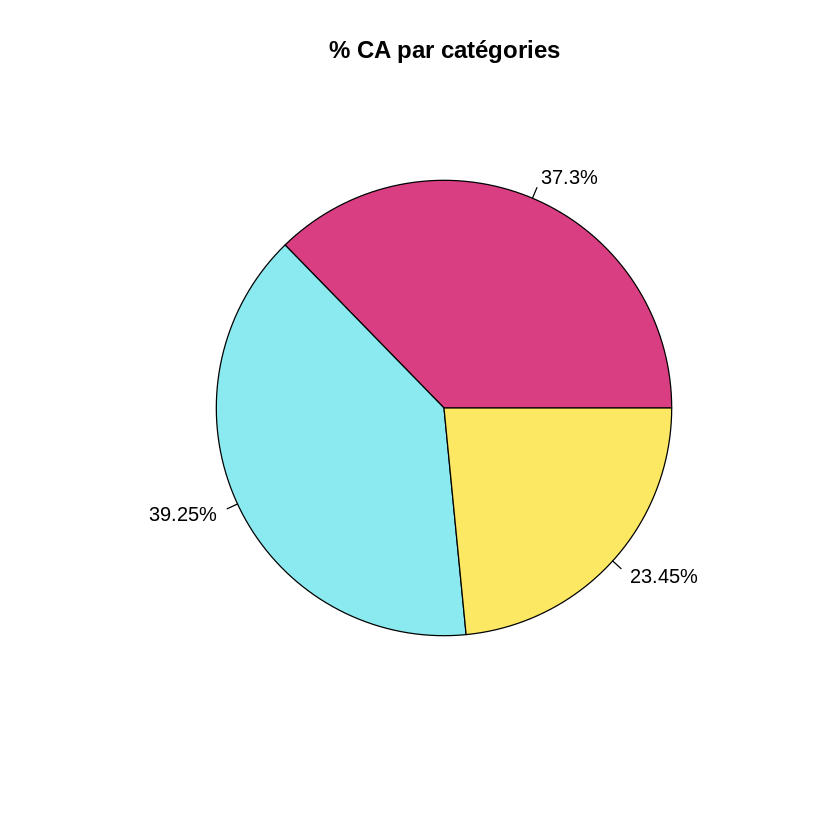

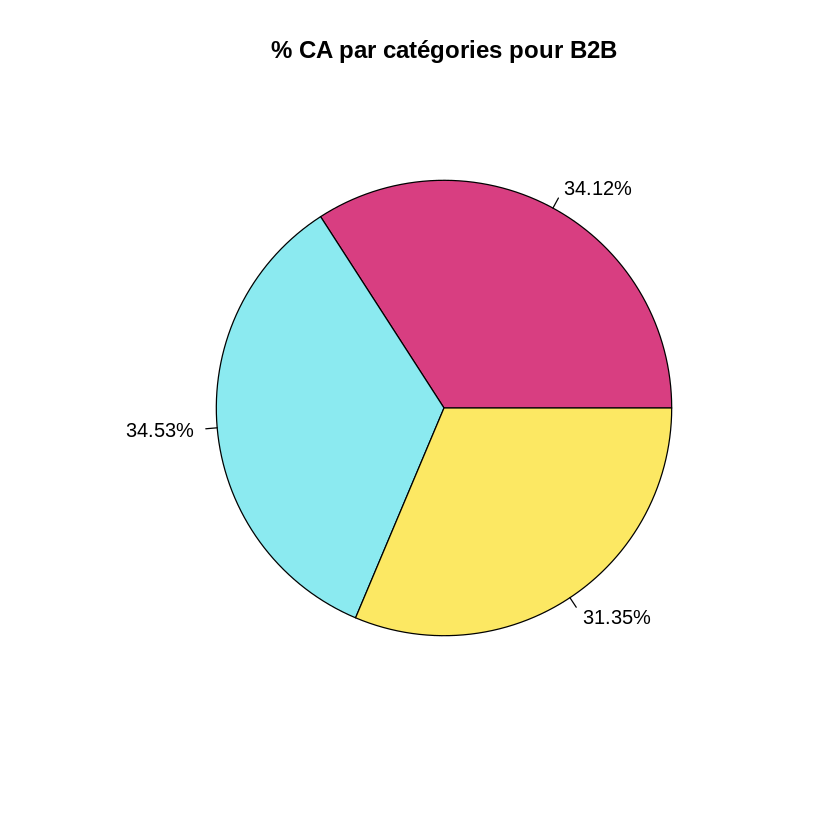

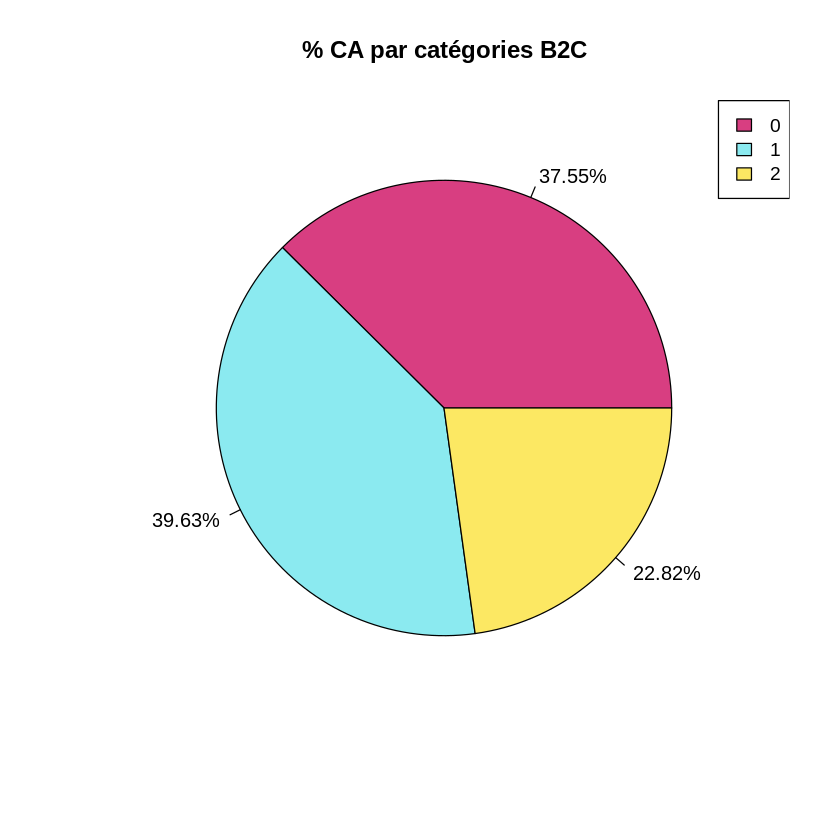

In [26]:
Tot_categ <- Transactions_Produits_Clients %>% group_by(categ) %>% summarise(CA=sum(price))
Tot_categ <- Tot_categ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire))

x <- Tot_categ$Per_CA
labels <- Tot_categ$categ
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA par catégories", col = colors_for_categ)
# legend( "topright",c("0","1","2"), cex = 0.96,
#    fill = colors_for_categ)

B2B_categ <- Transactions_Produits_Clients_B2B %>% group_by(categ) %>% summarise(CA=sum(price))
B2B_categ <- B2B_categ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2B))

x <- B2B_categ$Per_CA
labels <- B2B_categ$categ
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA par catégories pour B2B", col = colors_for_categ)
# legend( "topright",c("0","1","2"), cex = 0.96,
#    fill = colors_for_categ)

B2C_categ <- Transactions_Produits_Clients_B2C %>% group_by(categ) %>% summarise(CA=sum(price))
B2C_categ <- B2C_categ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))

x <- B2C_categ$Per_CA
labels <- B2C_categ$categ
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA par catégories B2C", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
   fill = colors_for_categ)

#### Représente le chiffre d'affaire, frequence_achat & Taile_panier pour B2B
---

In [27]:
fun_ca_prop <- function(str_client_type, table_transactions, float_total_ca){
  total_ca_client_type <- sum(table_transactions$price)
  print(paste("Le chiffre d'affaire totale pour",
              str_client_type, "est :",
              format(total_ca_client_type)))
  print(paste("La proportion de chiffre d'affaires pour les clients",
              str_client_type,
              "par rapport de chiffre d'affaires est :",
              format(total_ca_client_type * 100.0 / float_total_ca, digits=4), "%."))
}

In [28]:
#c_1609
Transactions_Produits_Clients_B2B_c_1609 <- Transactions_Produits_Clients_B2B[client_id == "c_1609",]
fun_ca_prop("c_1609", Transactions_Produits_Clients_B2B_c_1609, Total_chiffre_affaire_B2B)

#c_4958
Transactions_Produits_Clients_B2B_c_4958 <- Transactions_Produits_Clients_B2B[ client_id =="c_4958",]
fun_ca_prop("c_4958", Transactions_Produits_Clients_B2B_c_4958, Total_chiffre_affaire_B2B)

#c_6714
Transactions_Produits_Clients_B2B_c_6714 <- Transactions_Produits_Clients_B2B[client_id =="c_6714",]
fun_ca_prop("c_6714", Transactions_Produits_Clients_B2B_c_6714, Total_chiffre_affaire_B2B)

#c_3454
Transactions_Produits_Clients_B2B_c_3454 <- Transactions_Produits_Clients_B2B[client_id =="c_3454",]
fun_ca_prop("c_3454", Transactions_Produits_Clients_B2B_c_3454, Total_chiffre_affaire_B2B)

[1] "Le chiffre d'affaire totale pour c_1609 est : 324033.3"
[1] "La proportion de chiffre d'affaires pour les clients c_1609 par rapport de chiffre d'affaires est : 36.77 %."
[1] "Le chiffre d'affaire totale pour c_4958 est : 289760.3"
[1] "La proportion de chiffre d'affaires pour les clients c_4958 par rapport de chiffre d'affaires est : 32.89 %."
[1] "Le chiffre d'affaire totale pour c_6714 est : 153662.7"
[1] "La proportion de chiffre d'affaires pour les clients c_6714 par rapport de chiffre d'affaires est : 17.44 %."
[1] "Le chiffre d'affaire totale pour c_3454 est : 113669.8"
[1] "La proportion de chiffre d'affaires pour les clients c_3454 par rapport de chiffre d'affaires est : 12.9 %."


In [29]:
fun_graph <- function(i_table, i_aes, i_str_x, i_str_y, i_str_title, i_colors){
plot<-ggplot(i_table, i_aes) +     
    geom_bar(stat='identity',width = 0.5)+

labs(x = i_str_x, y = i_str_y,title = i_str_title)+
scale_fill_manual(values = i_colors)+
theme(plot.title = element_text(size=50),
      axis.title = element_text(size=40),
      axis.text = element_text(size = 35) ,
      legend.text = element_text(size = 35),
      legend.title = element_text(size = 40))

options(repr.plot.width=30, repr.plot.height=15)
plot}

fun_graph1 <- function(i_table, i_aes, i_str_x, i_str_y, i_str_title, i_colors){
plot1<-ggplot(i_table, i_aes) +     
    geom_bar(stat='identity',width = 0.5)+
labs(x = i_str_x, y = i_str_y,title = i_str_title)+
scale_fill_manual(values = i_colors)+
theme(axis.text.x = element_text(angle=90, hjust=1),
    plot.title = element_text(size=50),
      axis.title = element_text(size=40),
      axis.text = element_text(size = 35) ,
      legend.text = element_text(size = 35),
      legend.title = element_text(size = 40))

options(repr.plot1.width=30, repr.plot1.height=15)
plot1}

fun_graph2 <- function(i_table, i_aes, i_str_x, i_str_y, i_str_title, i_colors){
plot2<-ggplot(i_table, i_aes) +     
    geom_bar(stat='identity',position=position_dodge(), width = 0.5)+
labs(x = i_str_x, y = i_str_y,title = i_str_title)+
scale_fill_manual(values = i_colors)+
theme(plot.title = element_text(size=50),
      axis.title = element_text(size=40),
      axis.text = element_text(size = 35) ,
      legend.text = element_text(size = 35),
      legend.title = element_text(size = 40))

options(repr.plot2.width=30, repr.plot2.height=15)
plot2}

fun_graph3 <- function(i_table, i_aes, i_str_x, i_str_y, i_str_title, i_colors){
plot3<-ggplot(i_table, i_aes) +     
    geom_bar(stat='identity',position=position_dodge(), width = 0.5)+
labs(x = i_str_x, y = i_str_y,title = i_str_title)+
scale_fill_manual(values = i_colors)+
theme(axis.text.x = element_text(angle=90, hjust=1),
    plot.title = element_text(size=50),
      axis.title = element_text(size=40),
      axis.text = element_text(size = 35) ,
      legend.text = element_text(size = 35),
      legend.title = element_text(size = 40))

options(repr.plot3.width=30, repr.plot3.height=15)
plot3}

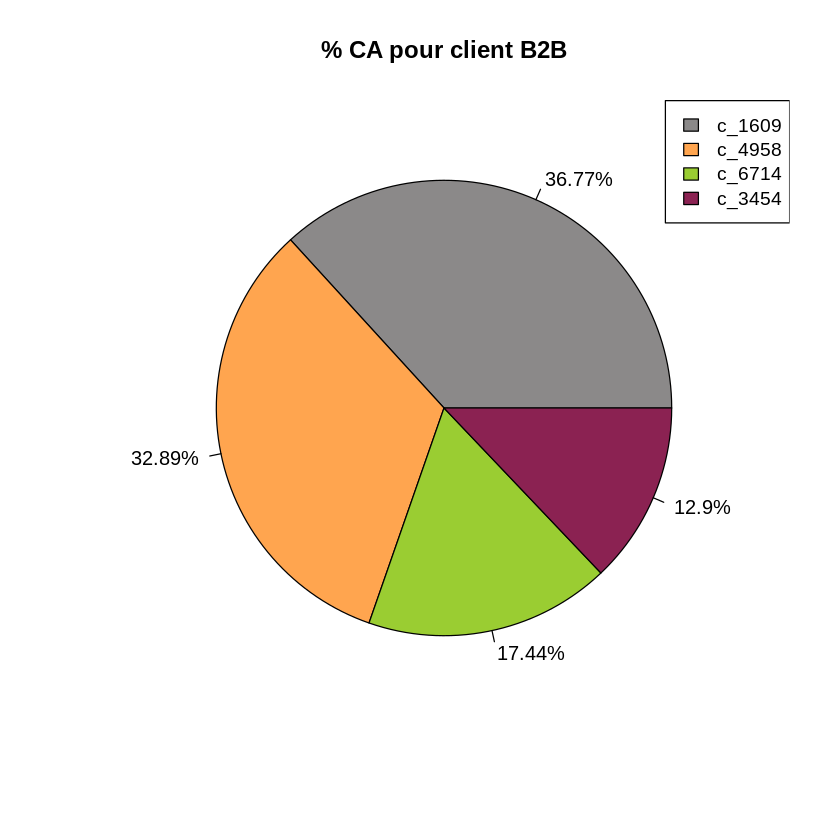

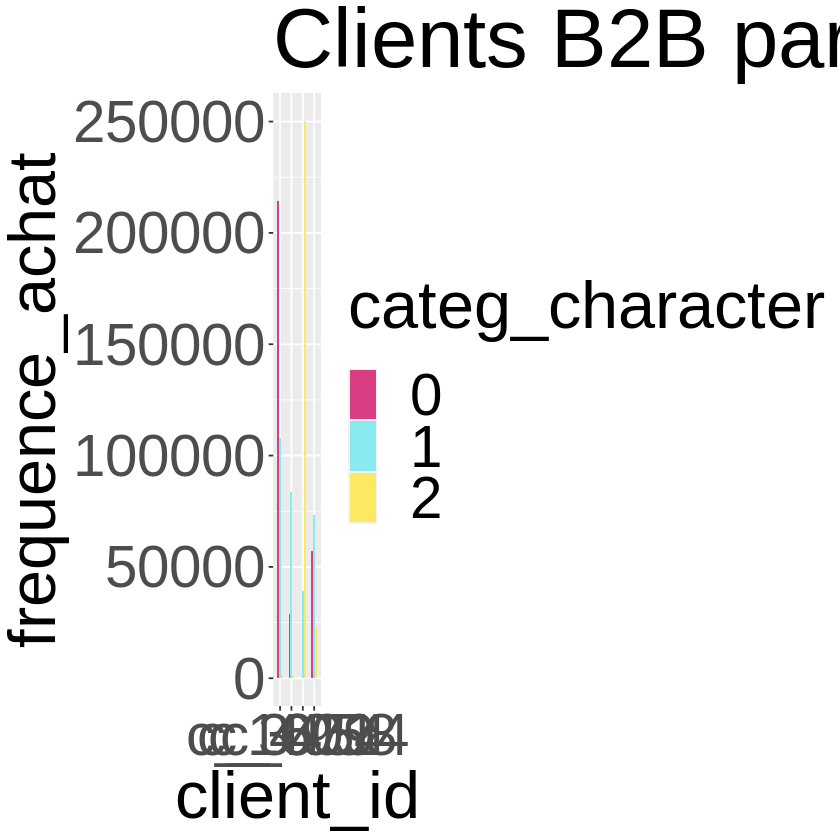

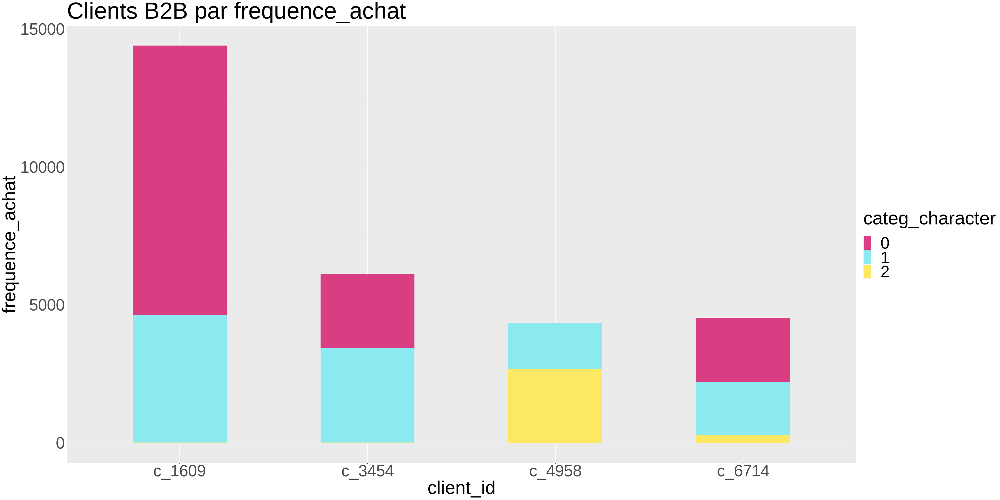

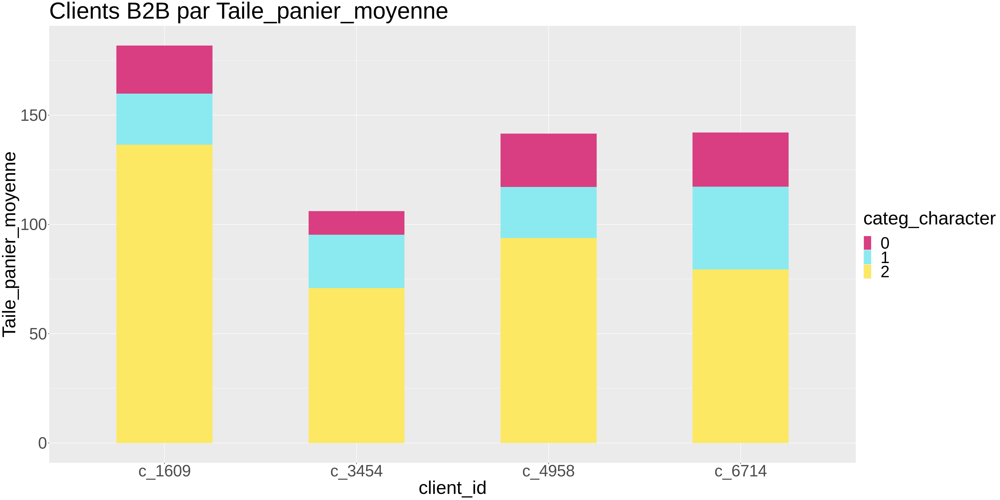

In [30]:
frequence_achat_Taile_panier_B2B$client_id <- factor(frequence_achat_Taile_panier_B2B$client_id, 
                                                     levels = c("c_1609", "c_4958", "c_6714","c_3454"))



frequence_achat_Taile_panier_B2B <- frequence_achat_Taile_panier_B2B %>%
mutate(Per_CA_client_B2B = CA_client * 100/Total_chiffre_affaire_B2B)

# Percentage CA pour client B2B
x <- frequence_achat_Taile_panier_B2B$Per_CA_client_B2B
labels <- frequence_achat_Taile_panier_B2B$client_id
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA pour client B2B", col = colors_for_clients)
legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
   fill = colors_for_clients)

# Frequence d'achat pour client B2B
# x <- frequence_achat_Taile_panier_B2B$frequence_achat
# labels <- frequence_achat_Taile_panier_B2B$client_id
# piepercent<- paste0(round(x, 2), "")
# pie(x, labels = piepercent, main = "Frequence d'achat pour client B2B", col = colors_for_clients)
# legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
#    fill = colors_for_clients)
# fun_graph(frequence_achat_Taile_panier_B2B,
#          aes( x=client_id, y=frequence_achat, fill=client_id),
#          "client_id", "frequence_achat","Clients B2B par frequence_achat",
#          colors_for_clients)

# Taile panier moyenne pour client B2B
# x <- frequence_achat_Taile_panier_B2B$Taile_panier_moyenne
# labels <- frequence_achat_Taile_panier_B2B$client_id
# piepercent<- paste0(round(x, 2), "€")
# pie(x, labels = piepercent, main = "Taile panier moyenne pour client B2B", col = colors_for_clients)
# legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
#    fill = colors_for_clients)
# fun_graph(frequence_achat_Taile_panier_B2B,
#          aes( x=client_id, y=Taile_panier_moyenne, fill=client_id),
#          "client_id", "Taile_panier_moyenne","Clients B2B par Taile_panier_moyenne",
#          colors_for_clients)

fun_graph2(frequence_achat_Taile_panier_B2B_categ,
         aes( x=client_id, y=CA_client, fill=categ_character),
         "client_id", "frequence_achat","Clients B2B par CA",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes( x=client_id, y=frequence_achat, fill=categ_character),
         "client_id", "frequence_achat","Clients B2B par frequence_achat",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes( x=client_id, y=Taile_panier_moyenne, fill=categ_character),
         "client_id", "Taile_panier_moyenne","Clients B2B par Taile_panier_moyenne",
         colors_for_categ)

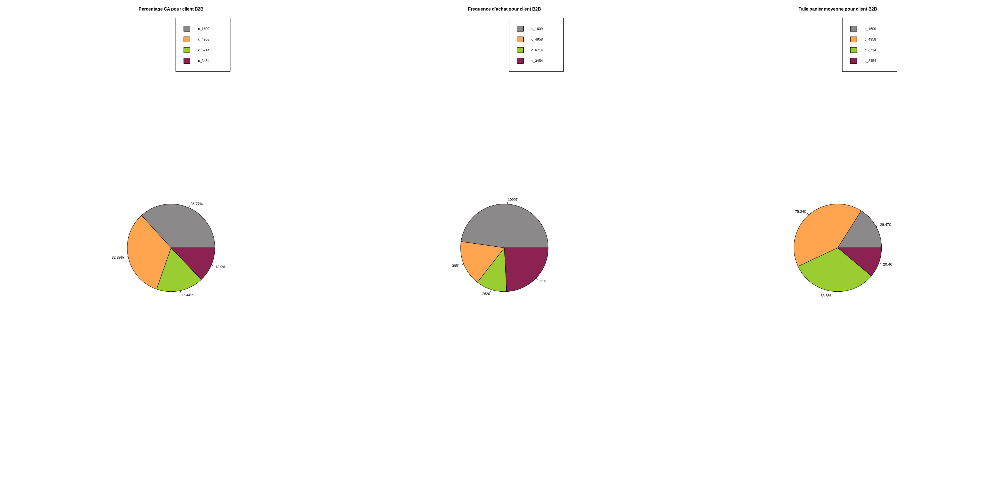

In [31]:
par(mfrow=c(1,3))
x <- frequence_achat_Taile_panier_B2B$Per_CA_client_B2B
labels <- frequence_achat_Taile_panier_B2B$client_id
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage CA pour client B2B", col = colors_for_clients)
legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
   fill = colors_for_clients)

x <- frequence_achat_Taile_panier_B2B$frequence_achat
labels <- frequence_achat_Taile_panier_B2B$client_id
piepercent<- paste0(round(x, 2), "")
pie(x, labels = piepercent, main = "Frequence d'achat pour client B2B", col = colors_for_clients)
legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
   fill = colors_for_clients)

x <- frequence_achat_Taile_panier_B2B$Taile_panier_moyenne
labels <- frequence_achat_Taile_panier_B2B$client_id
piepercent<- paste0(round(x, 2), "€")
pie(x, labels = piepercent, main = "Taile panier moyenne pour client B2B", col = colors_for_clients)
legend("topright", c("c_1609","c_4958","c_6714","c_3454"), cex = 0.96,
   fill = colors_for_clients)


#### Catégorie par client B2B & Client B2B par catégorie

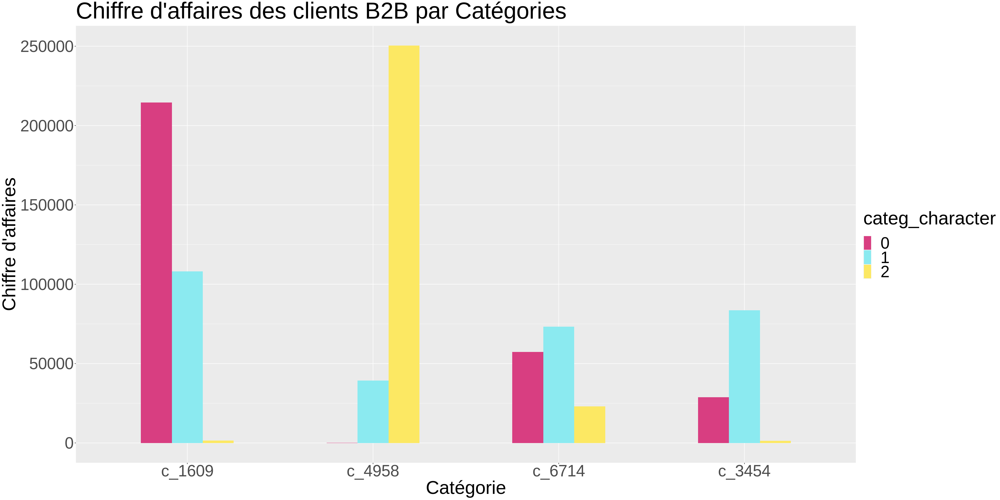

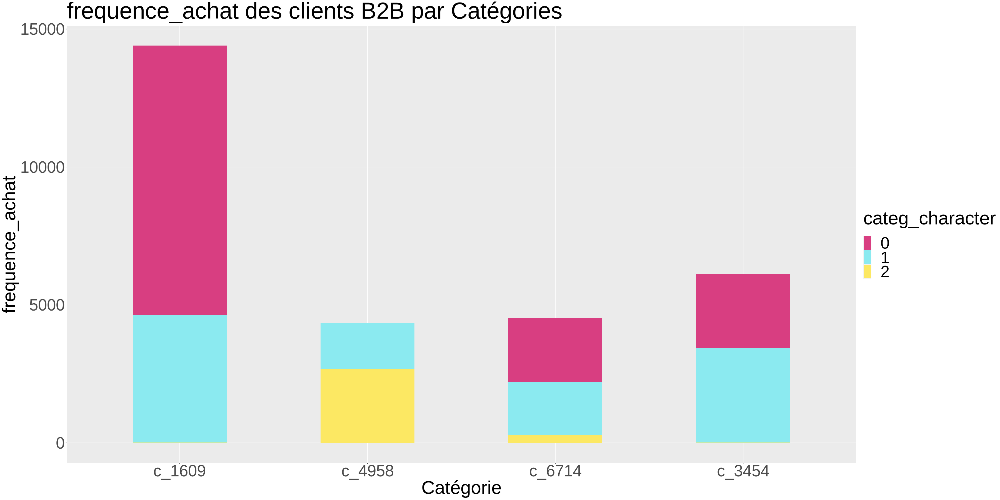

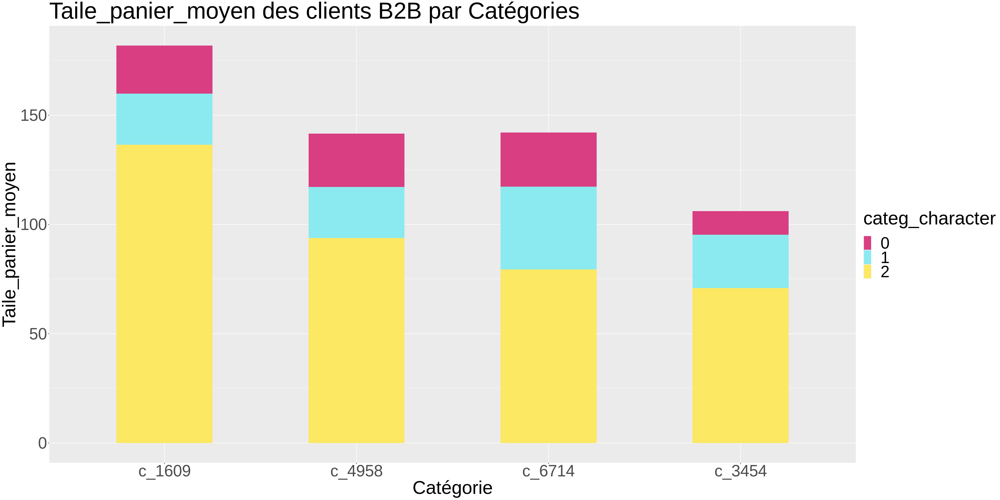

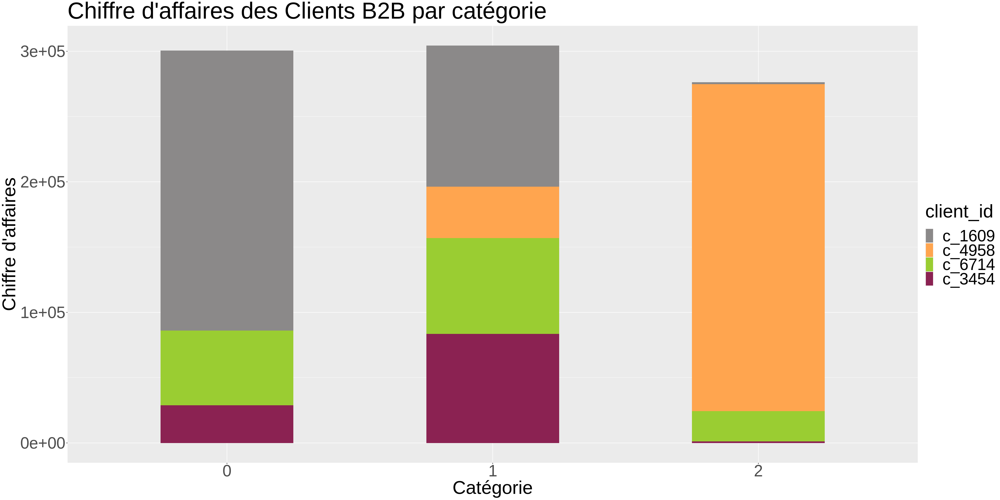

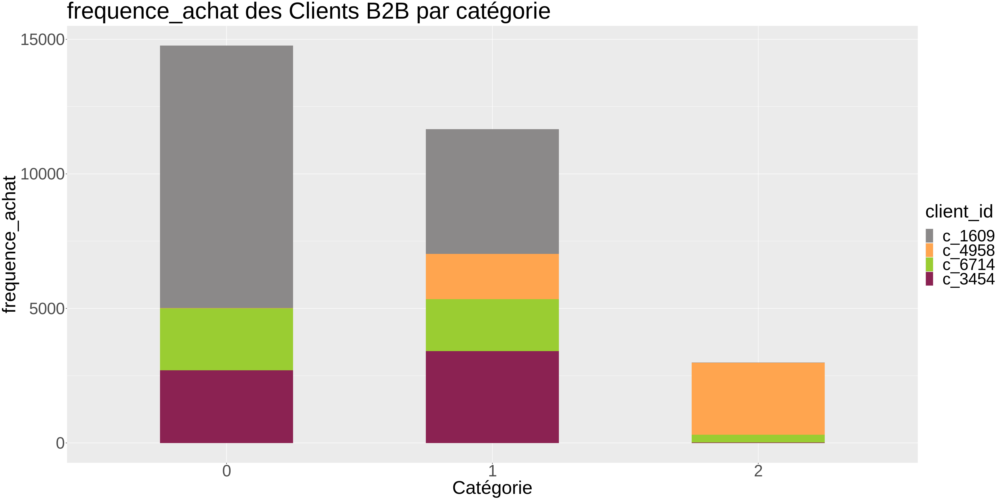

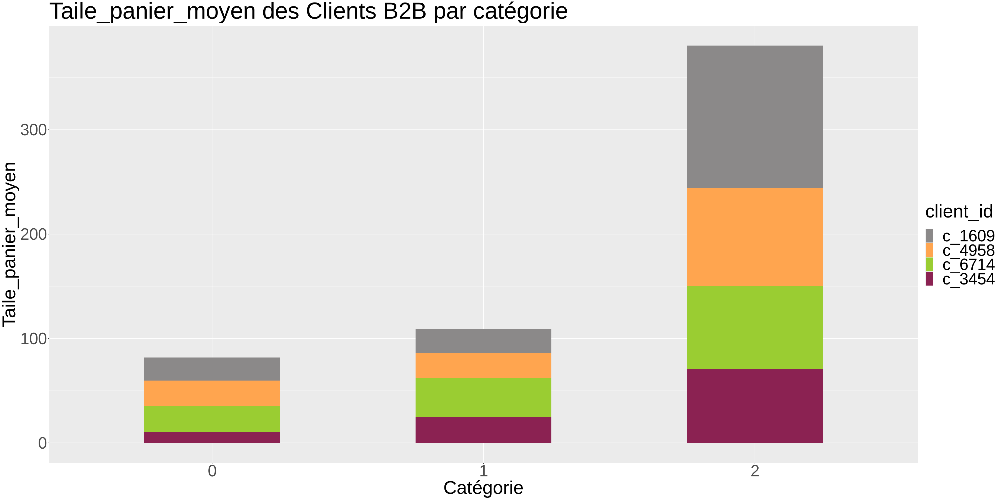

In [32]:

frequence_achat_Taile_panier_B2B_categ$client_id <- factor(frequence_achat_Taile_panier_B2B_categ$client_id, 
                                                     levels = c("c_1609", "c_4958", "c_6714","c_3454"))

# Chiffre d'affaires des Catégories par clients B2B
fun_graph2(frequence_achat_Taile_panier_B2B_categ,
         aes(x=client_id, y=CA_client, fill=categ_character),
         "Catégorie", "Chiffre d'affaires","Chiffre d'affaires des clients B2B par Catégories",
         colors_for_categ)
# frequence_achat des Catégories par clients B2B
fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes(x=client_id, y=frequence_achat, fill=categ_character),
         "Catégorie", "frequence_achat","frequence_achat des clients B2B par Catégories",
         colors_for_categ)
# Taile_panier_moyenne des Catégories par clients B2B
fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes(x=client_id, y=Taile_panier_moyenne, fill=categ_character),
         "Catégorie", "Taile_panier_moyen","Taile_panier_moyen des clients B2B par Catégories",
         colors_for_categ)

#Chiffre d'affaires des Clients B2B par catégorie
fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes( x=categ_character, y=CA_client, fill=client_id),
         "Catégorie", "Chiffre d'affaires","Chiffre d'affaires des Clients B2B par catégorie",
         colors_for_clients)
#frequence_achat des Clients B2B par catégorie
fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes( x=categ_character, y=frequence_achat, fill=client_id),
         "Catégorie", "frequence_achat","frequence_achat des Clients B2B par catégorie",
         colors_for_clients)
#Taile_panier_moyenne des Clients B2B par catégorie
fun_graph(frequence_achat_Taile_panier_B2B_categ,
         aes( x=categ_character, y=Taile_panier_moyenne, fill=client_id),
         "Catégorie", "Taile_panier_moyen","Taile_panier_moyen des Clients B2B par catégorie",
         colors_for_clients)

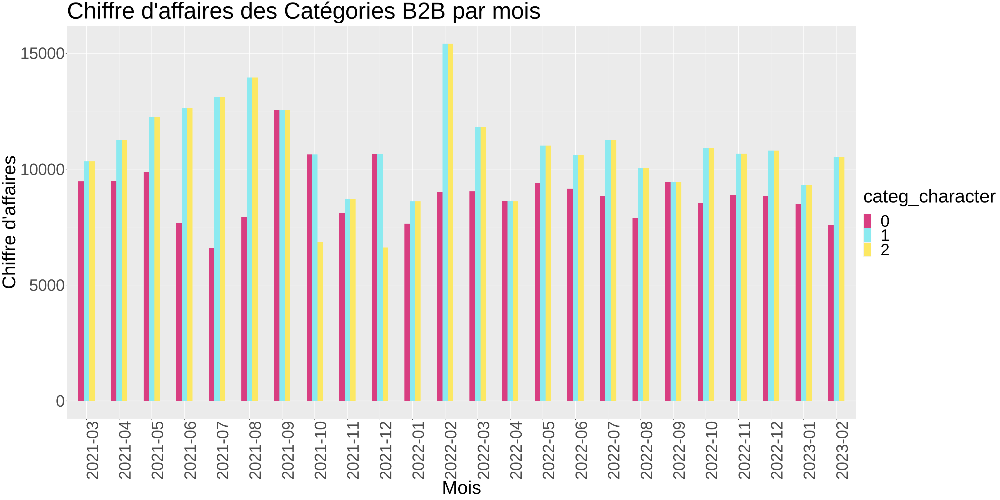

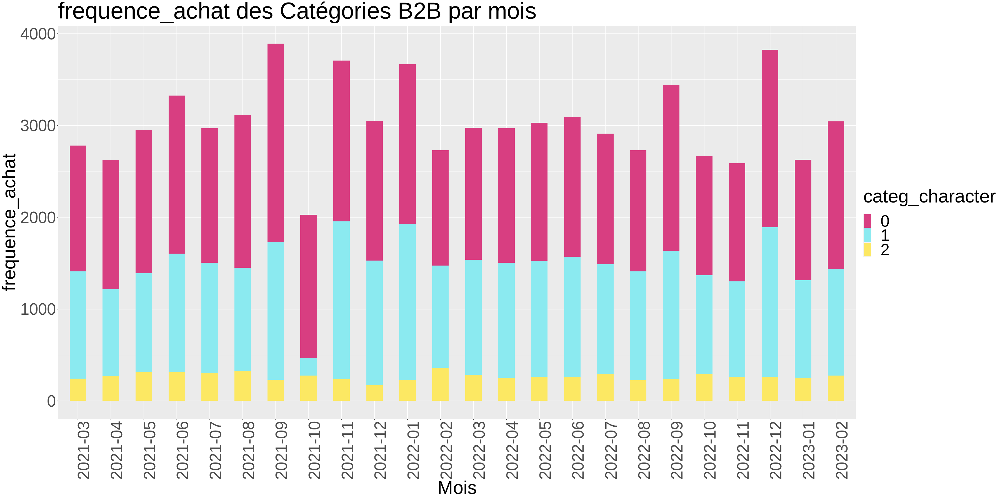

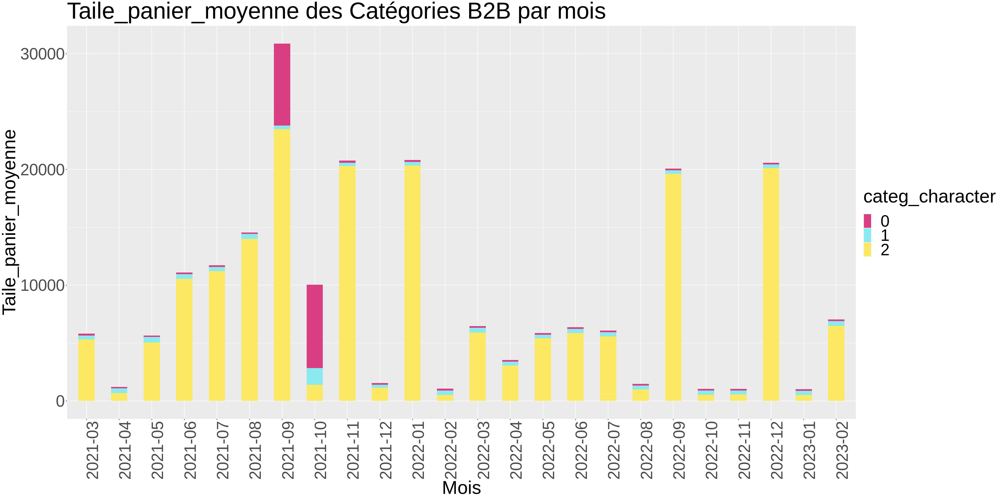

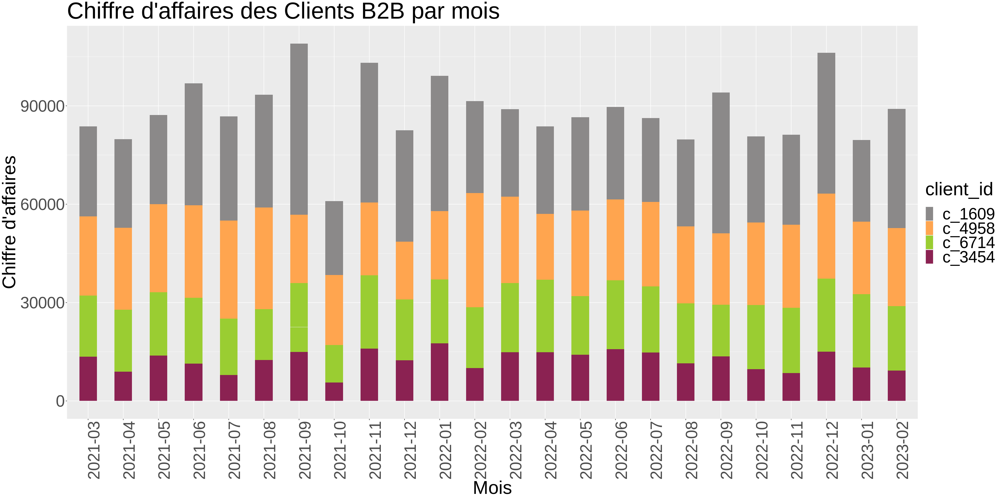

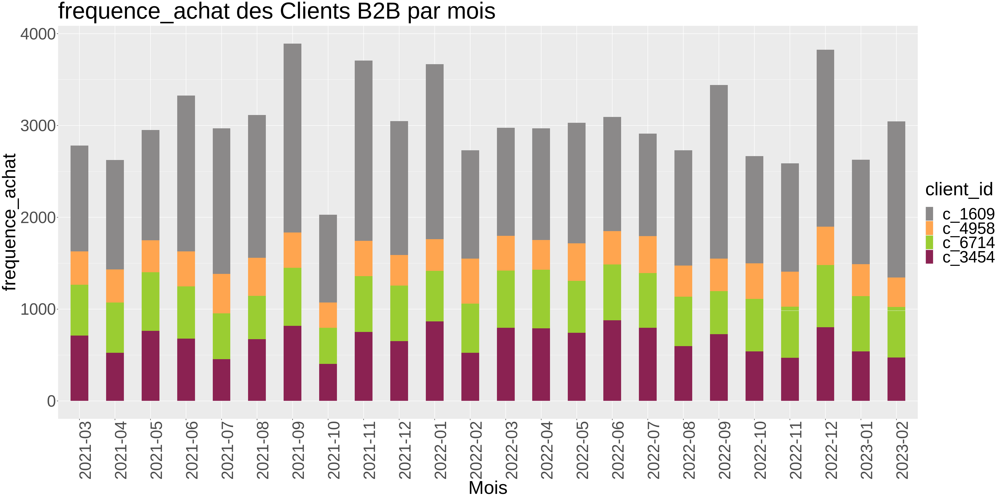

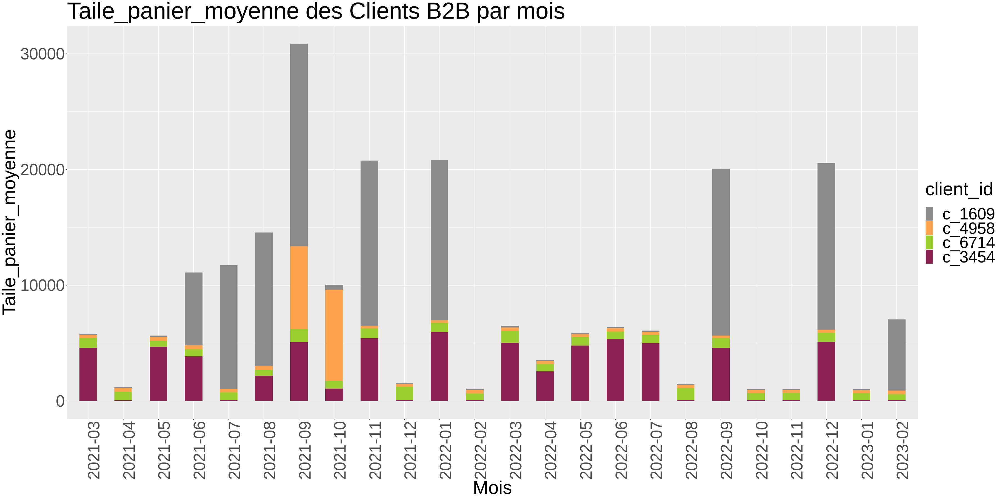

In [33]:

frequence_achat_Taile_panier_B2B_mois$client_id <- factor(frequence_achat_Taile_panier_B2B_mois$client_id, 
                                                     levels = c("c_1609", "c_4958", "c_6714","c_3454"))

#Chiffre d'affaires des Catégories B2B par mois
fun_graph3(frequence_achat_Taile_panier_B2B_mois,
         aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories B2B par mois",
         colors_for_categ)
#frequence_achat des Catégories B2B par mois
fun_graph1(frequence_achat_Taile_panier_B2B_mois,
         aes(x=mois, y=frequence_achat, fill=categ_character),
         "Mois", "frequence_achat","frequence_achat des Catégories B2B par mois",
         colors_for_categ)
#Taile_panier_moyenne des Catégories B2B par mois
fun_graph1(frequence_achat_Taile_panier_B2B_mois,
         aes(x=mois, y=Taile_panier_moyenne, fill=categ_character),
         "Mois", "Taile_panier_moyenne","Taile_panier_moyenne des Catégories B2B par mois",
         colors_for_categ)

#Chiffre d'affaires des Clients B2B par mois
fun_graph1(frequence_achat_Taile_panier_B2B_mois,
         aes( x=mois, y=CA_client, fill=client_id),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Clients B2B par mois",
         colors_for_clients)
#frequence_achat des Clients B2B par mois
fun_graph1(frequence_achat_Taile_panier_B2B_mois,
         aes( x=mois, y=frequence_achat, fill=client_id),
         "Mois", "frequence_achat","frequence_achat des Clients B2B par mois",
         colors_for_clients)
#Taile_panier_moyenne des Clients B2B par mois
fun_graph1(frequence_achat_Taile_panier_B2B_mois,
         aes( x=mois, y=Taile_panier_moyenne, fill=client_id),
         "Mois", "Taile_panier_moyenne","Taile_panier_moyenne des Clients B2B par mois",
         colors_for_clients)

##### Catégories de clients B2B

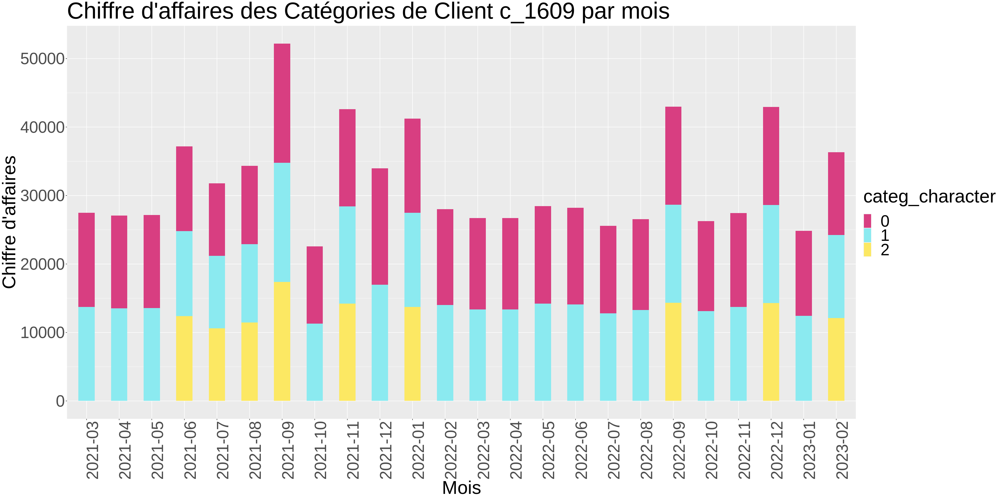

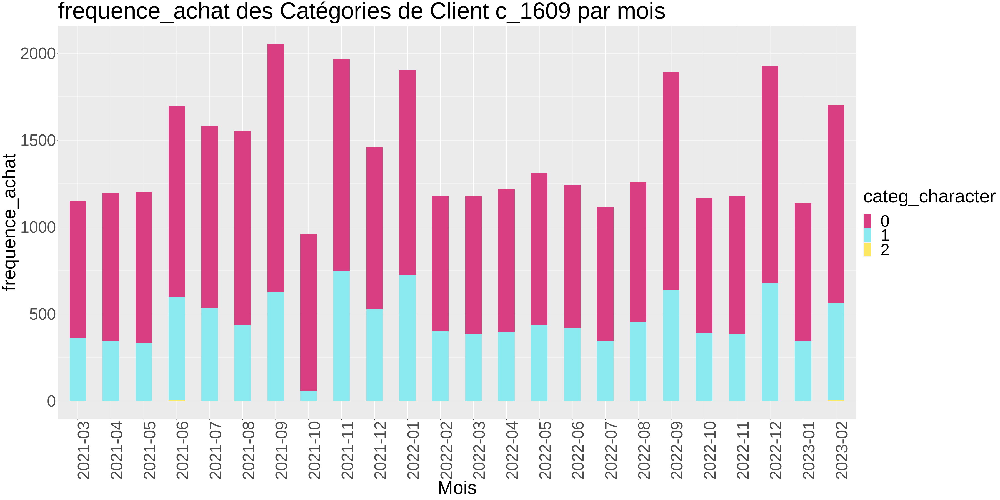

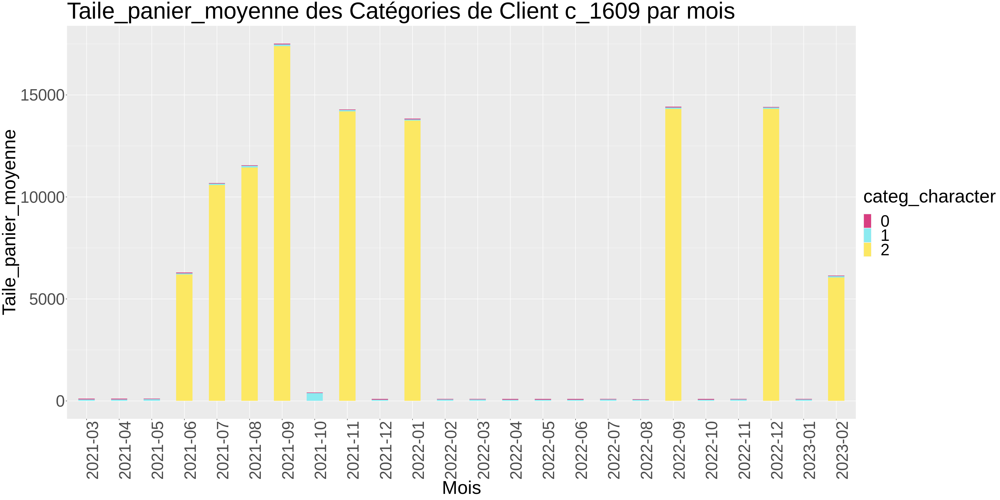

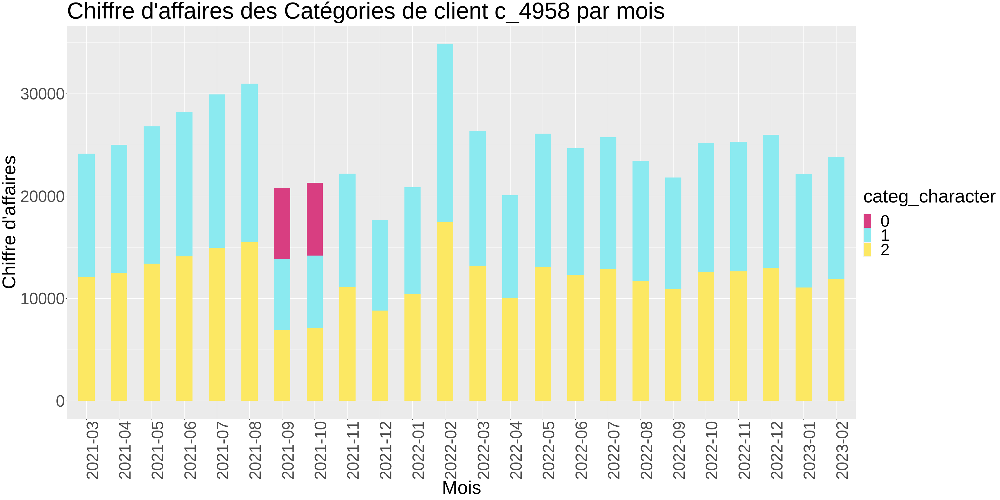

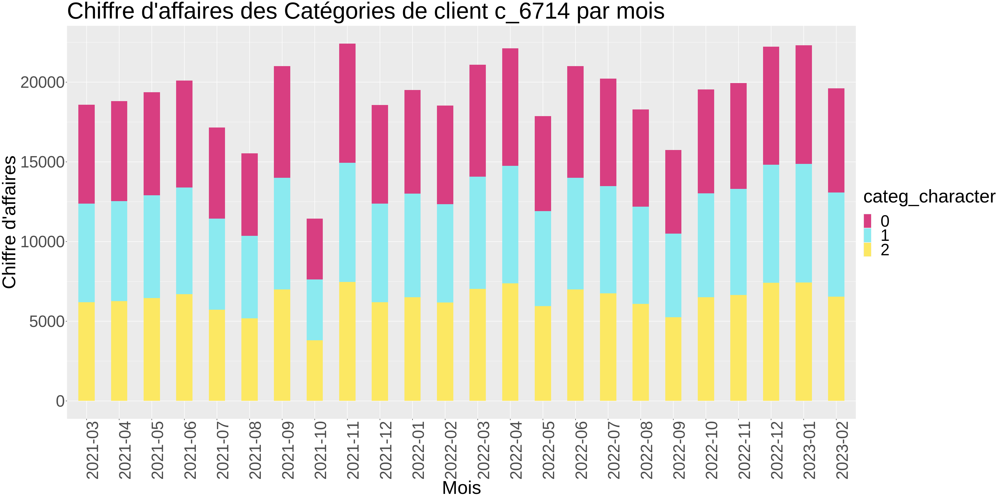

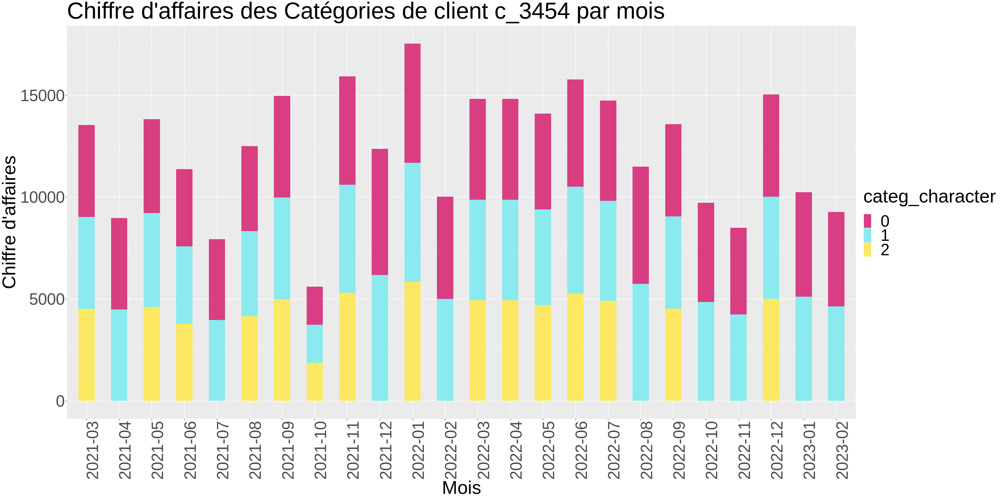

In [34]:
c_1609 <- frequence_achat_Taile_panier_mois[client_id == "c_1609",]
fun_graph1(c_1609,
           aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories de Client c_1609 par mois",
           colors_for_categ)
fun_graph1(c_1609,
           aes(x=mois, y=frequence_achat, fill=categ_character),
         "Mois", "frequence_achat","frequence_achat des Catégories de Client c_1609 par mois",
           colors_for_categ)
fun_graph1(c_1609,
           aes(x=mois, y=Taile_panier_moyenne, fill=categ_character),
         "Mois", "Taile_panier_moyenne","Taile_panier_moyenne des Catégories de Client c_1609 par mois",
           colors_for_categ)

c_4958 <- frequence_achat_Taile_panier_mois [client_id == "c_4958",]
fun_graph1(c_4958,
         aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories de client c_4958 par mois",
         colors_for_categ)

c_6714 <- frequence_achat_Taile_panier_mois [client_id == "c_6714",]
fun_graph1(c_6714,
         aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories de client c_6714 par mois",
         colors_for_categ)

c_3454 <- frequence_achat_Taile_panier_mois [client_id == "c_3454",]
fun_graph1(c_3454,
         aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories de client c_3454 par mois",
         colors_for_categ)

# B2C

#### Sex par catégorie

[1] 8596

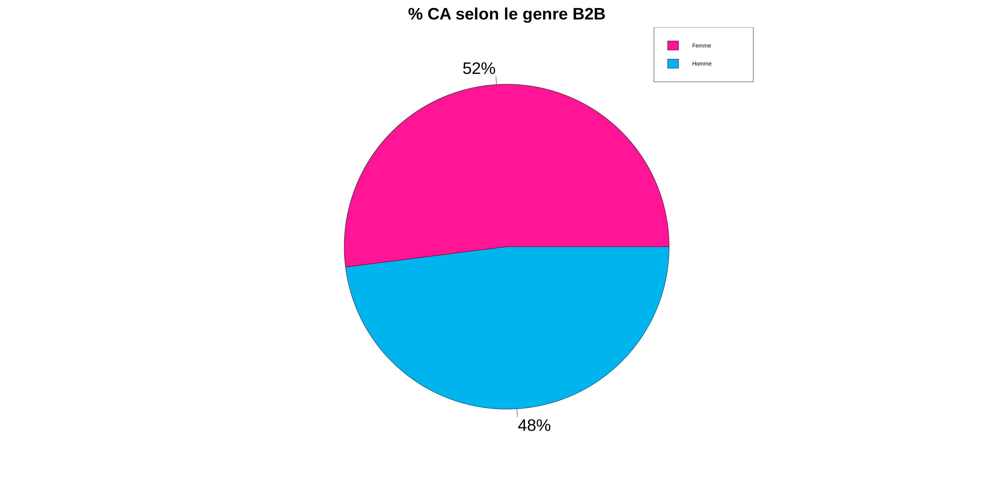

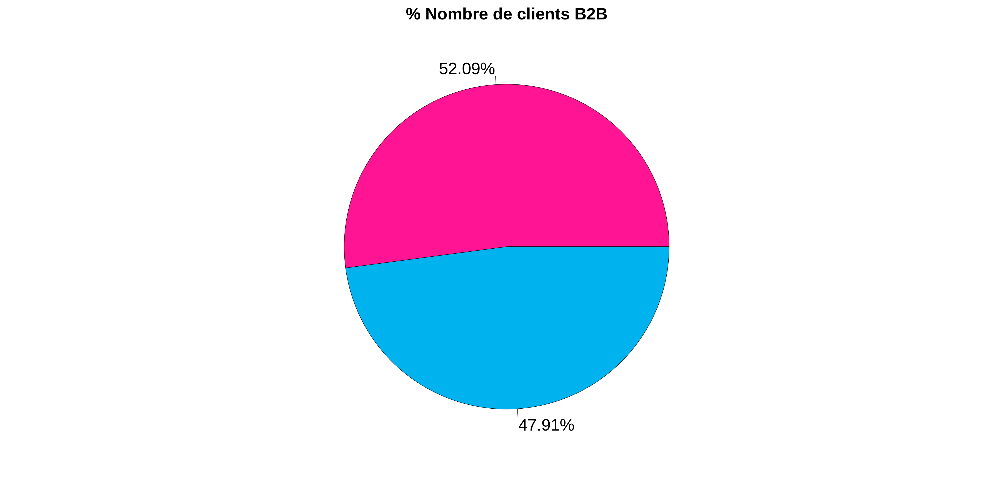

In [35]:
Tot_sex <- Transactions_Produits_Clients_B2C %>% group_by(sex) %>% summarise(CA=sum(price))
Tot_sex <- Tot_sex %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))


x <- Tot_sex$Per_CA
labels <- Tot_sex$sex
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA selon le genre B2B", col = colors_for_sex, cex = 3,cex.main = 3)
legend( "topright",c("Femme","Homme"), fill = colors_for_sex, cex = 1)

total_client <- n_distinct(Transactions_Produits_Clients_B2C$client_id)
total_client
nombre_sex <- Transactions_Produits_Clients_B2C %>%
  group_by(sex) %>%
  summarise(N_sex = n_distinct(client_id))
nombre_sex <- nombre_sex %>% mutate(Per_sex = as.numeric(N_sex) * 100/ as.numeric(total_client))

x <- nombre_sex$Per_sex
labels <- nombre_sex$sex
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% Nombre de clients B2B", col = colors_for_sex, cex = 3,cex.main = 3)
# legend( "topright",c("Femme","Homme"), fill = colors_for_sex, cex = 1.5)

#### Sex par mois

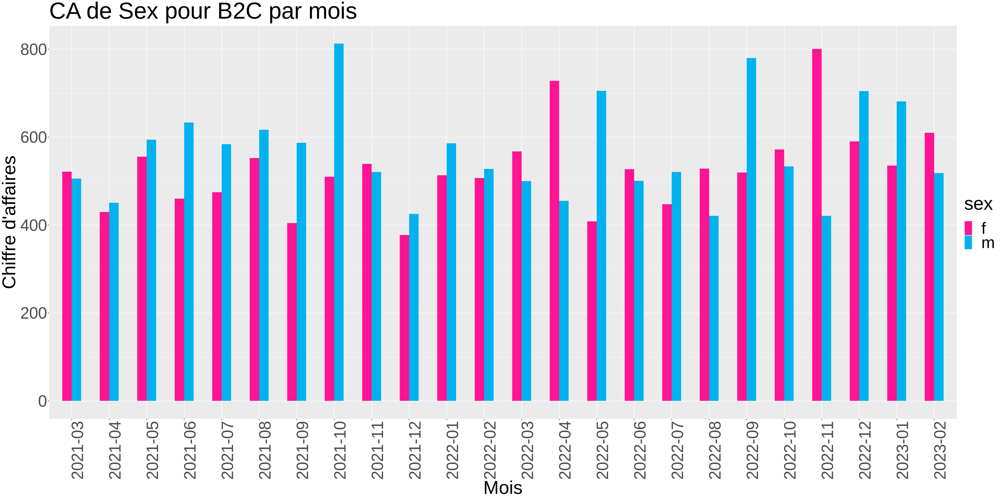

In [71]:
# lprop(table(Transactions_Produits_Clients_B2C$mois, Transactions_Produits_Clients_B2C$sex))

# fun_graph3(B2C,
#          aes(x=mois, y=CA, fill=sex),
#          "Mois", "Chiffre d'affaires","Sex par mois",
#          colors_for_sex)

fun_graph3(frequence_achat_Taile_panier_B2C_mois,
         aes(x=mois, y=CA_client, fill=sex),
         "Mois", "Chiffre d'affaires","CA de Sex pour B2C par mois",
         colors_for_sex)

#### Catégories B2C par mois

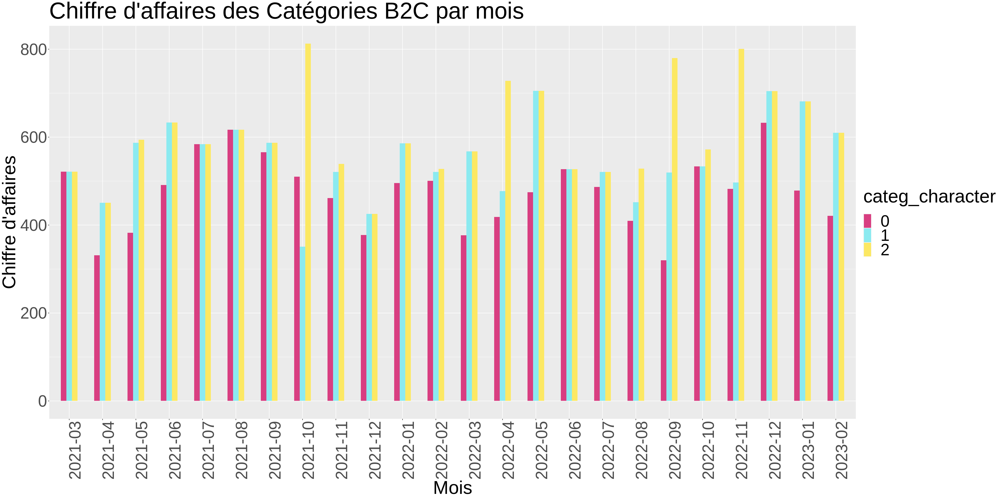

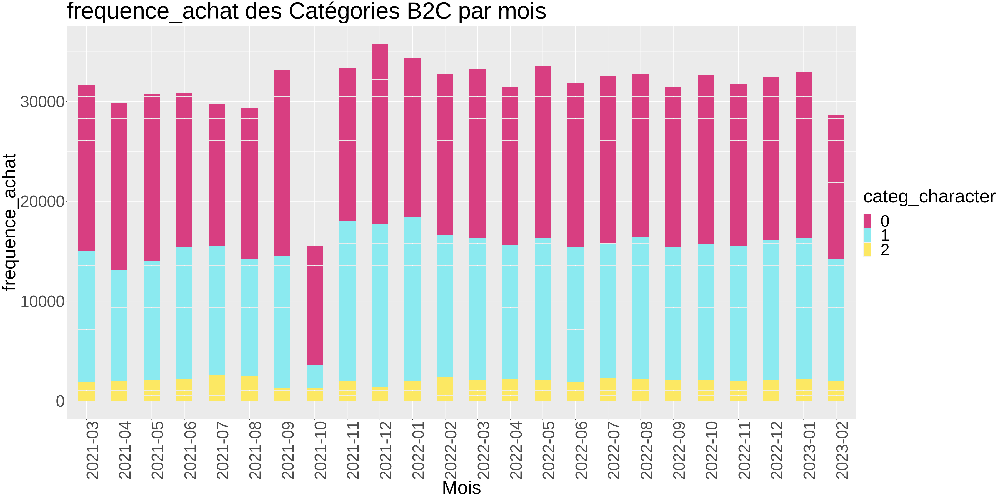

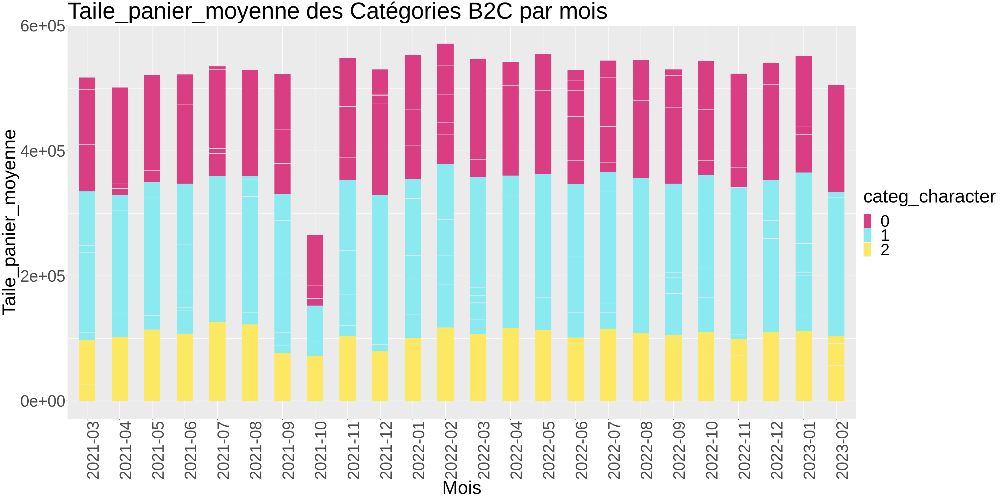

In [72]:
# lprop(table(Transactions_Produits_Clients_B2C$mois, Transactions_Produits_Clients_B2C$categ))
fun_graph3(frequence_achat_Taile_panier_B2C_mois,
         aes(x=mois, y=CA_client, fill=categ_character),
         "Mois", "Chiffre d'affaires","Chiffre d'affaires des Catégories B2C par mois",
         colors_for_categ)

fun_graph1(frequence_achat_Taile_panier_B2C_mois,
         aes(x=mois, y=frequence_achat, fill=categ_character),
         "Mois", "frequence_achat","frequence_achat des Catégories B2C par mois",
         colors_for_categ)

fun_graph1(frequence_achat_Taile_panier_B2C_mois,
         aes(x=mois, y=Taile_panier_moyenne, fill=categ_character),
         "Mois", "Taile_panier_moyenne","Taile_panier_moyenne des Catégories B2C par mois",
         colors_for_categ)

`summarise()` has grouped output by 'categ_character', 'mois', 'sex', 'age'.
You can override using the `.groups` argument.


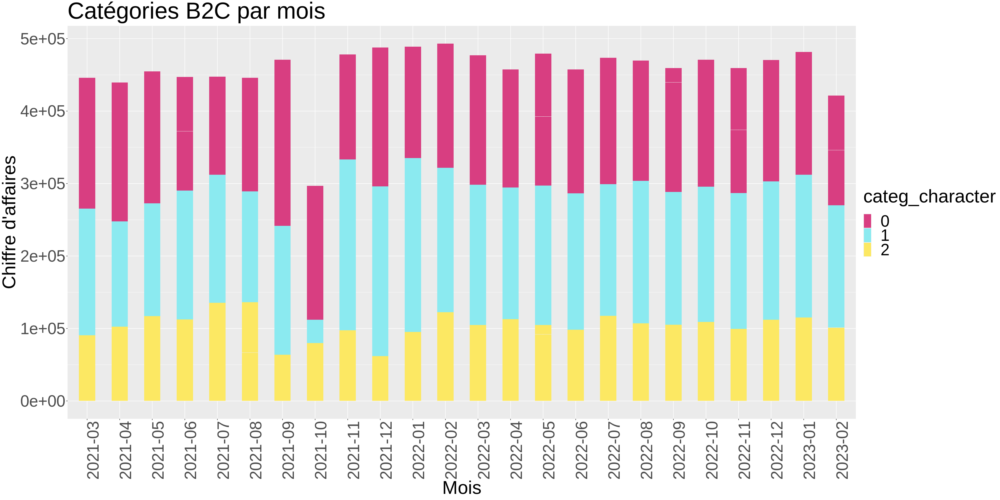

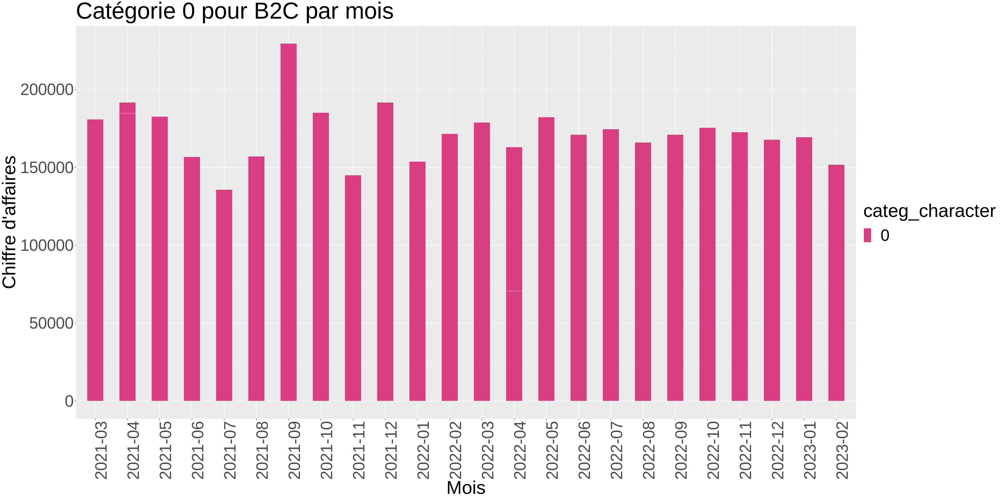

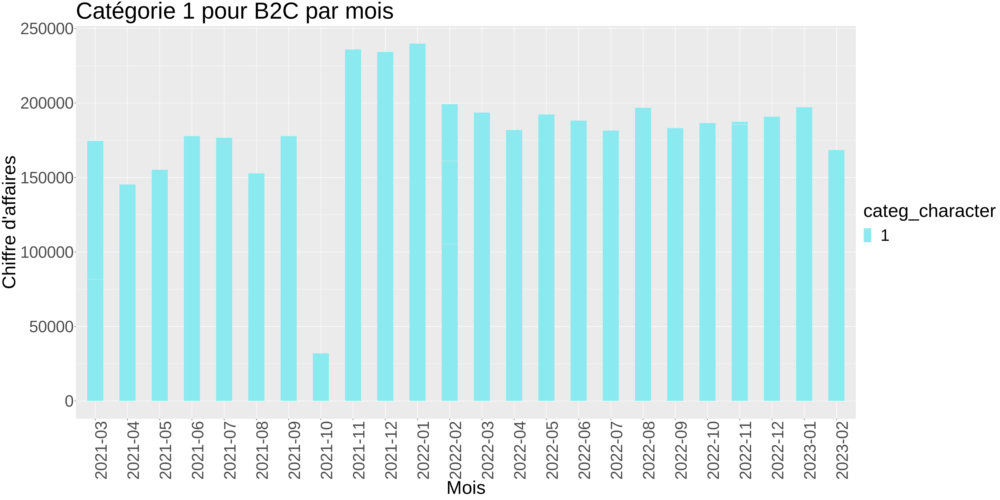

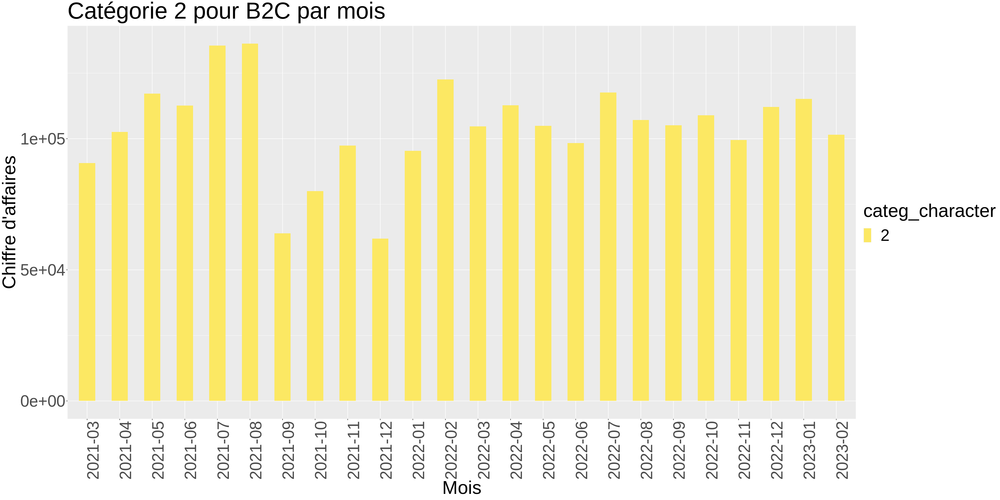

In [74]:
B2C <- Transactions_Produits_Clients_B2C %>% group_by(categ_character,mois,sex,age,age_tranche) %>% summarise(CA=sum(price))
B2C <- B2C %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
# dim(B2C)
# head(B2C)
B2C_0<-B2C[B2C$categ_character == '0',]
B2C_1<-B2C[B2C$categ_character == '1',]
B2C_2<-B2C[B2C$categ_character == '2',]

fun_graph1(B2C,
         aes(x=mois, y=CA, fill=categ_character),
         "Mois", "Chiffre d'affaires","Catégories B2C par mois",
         colors_for_categ)
fun_graph1(B2C_0,
         aes(x=mois, y=CA, fill=categ_character),
         "Mois", "Chiffre d'affaires","Catégorie 0 pour B2C par mois",
         colors_for_categ)
fun_graph1(B2C_1,
         aes(x=mois, y=CA, fill=categ_character),
         "Mois", "Chiffre d'affaires","Catégorie 1 pour B2C par mois",
         colors_for_categ)
fun_graph1(B2C_2,
         aes(x=mois, y=CA, fill=categ_character),
         "Mois", "Chiffre d'affaires","Catégorie 2 pour B2C par mois",
         colors_for_categ)


`summarise()` has grouped output by 'categ_character'. You can override using
the `.groups` argument.


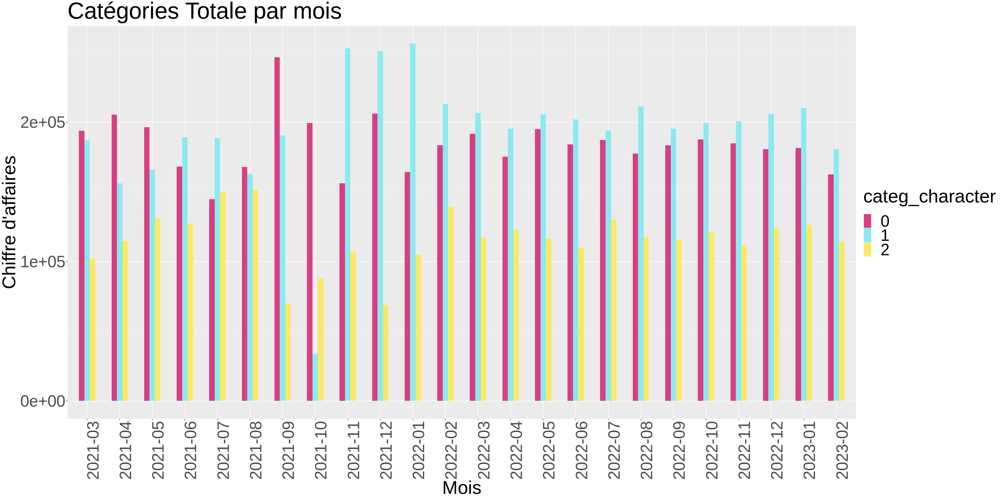

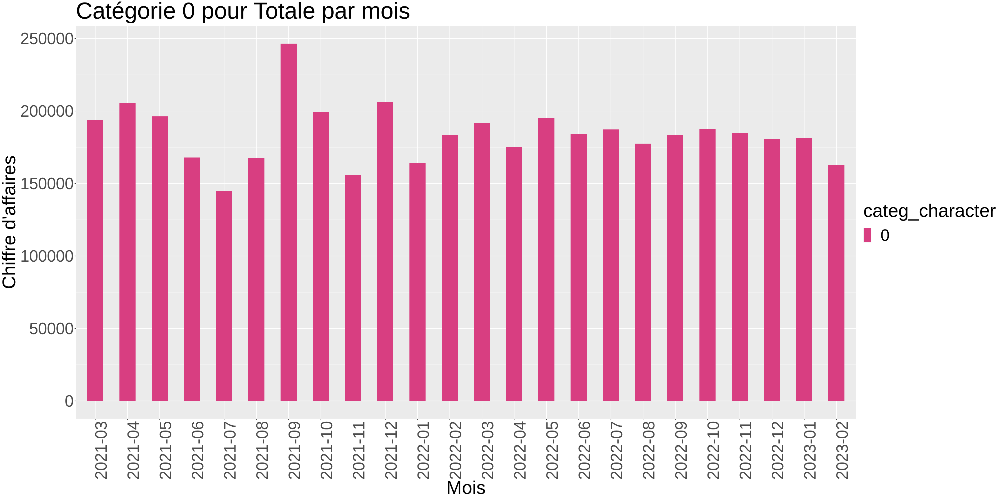

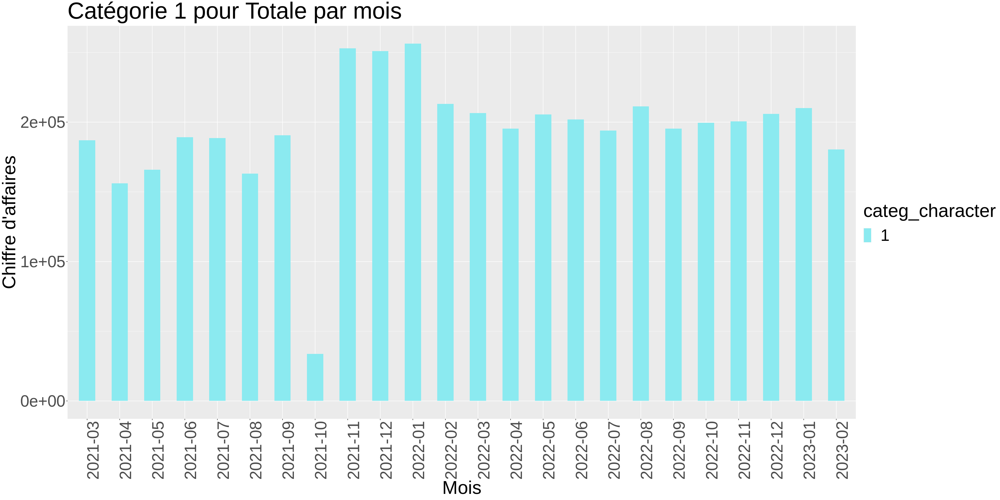

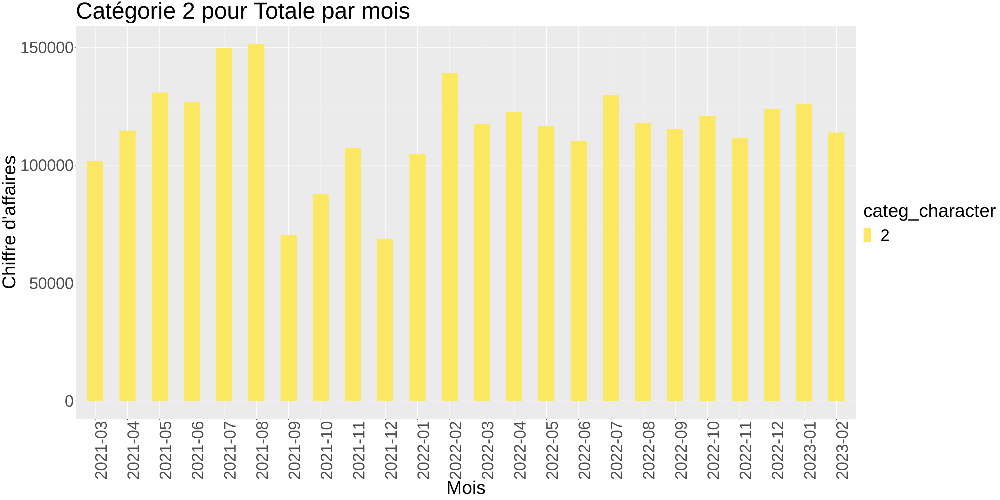

In [75]:
Totale <- Transactions_Produits_Clients %>% group_by(categ_character,mois) %>% summarise(CA=sum(price))
Totale <- Totale %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire))
Totale_0<-Totale[Totale$categ_character == '0',]
Totale_1<-Totale[Totale$categ_character == '1',]
Totale_2<-Totale[Totale$categ_character == '2',]

fun_graph3(Totale,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégories Totale par mois",
           colors_for_categ)
fun_graph1(Totale_0,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégorie 0 pour Totale par mois",
           colors_for_categ)
fun_graph1(Totale_1,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégorie 1 pour Totale par mois",
           colors_for_categ)
fun_graph1(Totale_2,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégorie 2 pour Totale par mois",
           colors_for_categ)

#### Catégories B2C par age

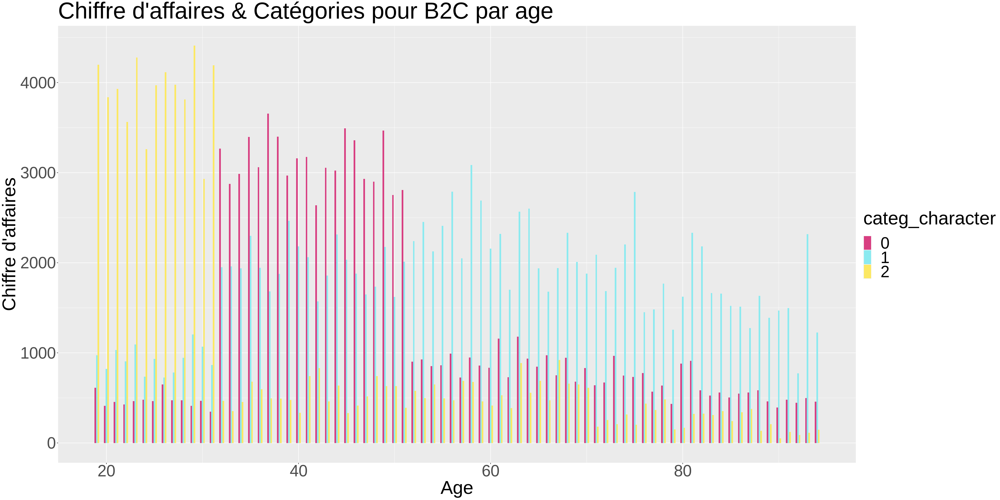

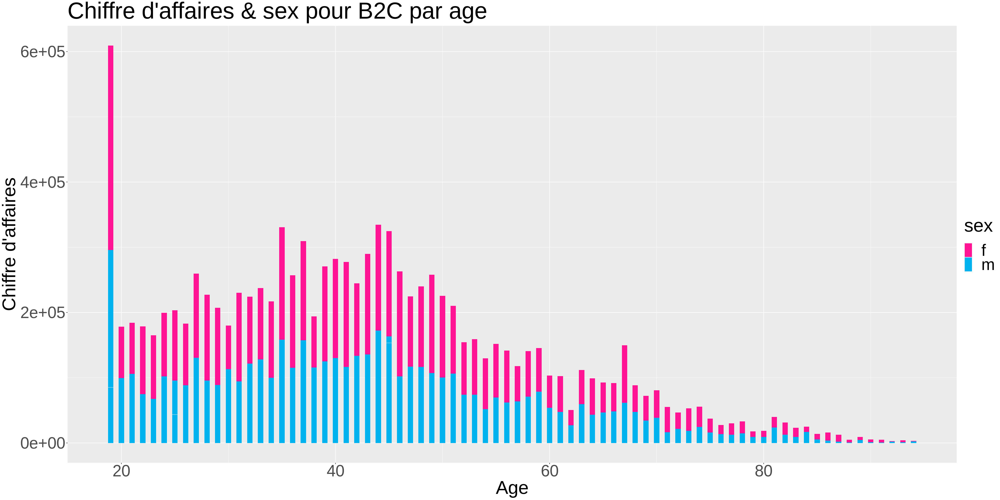

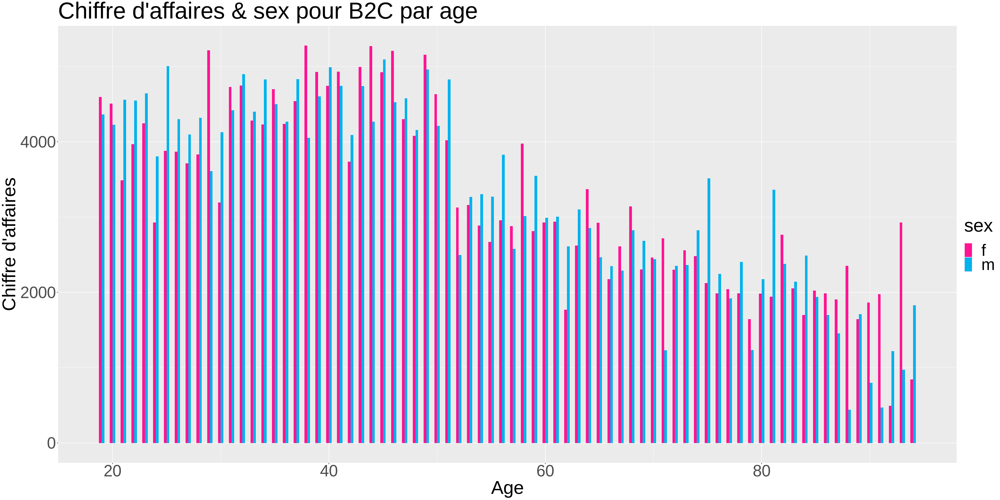

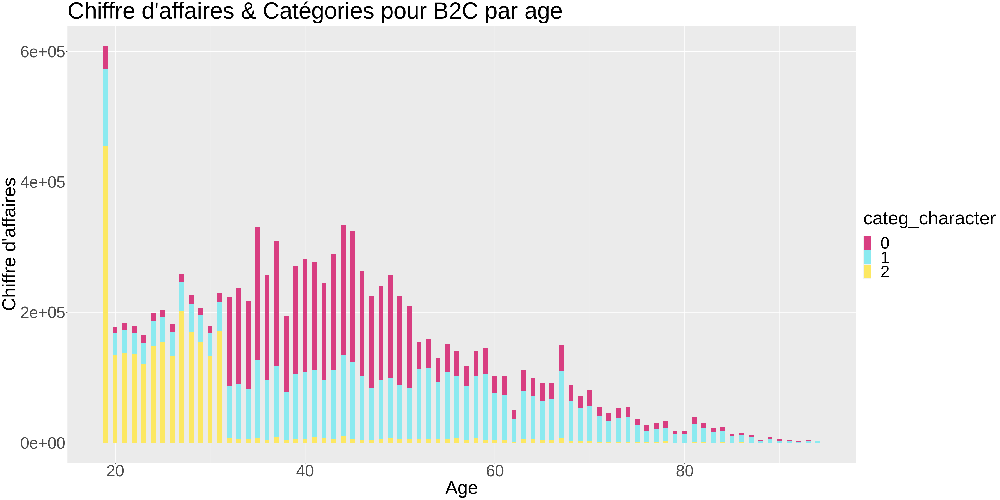

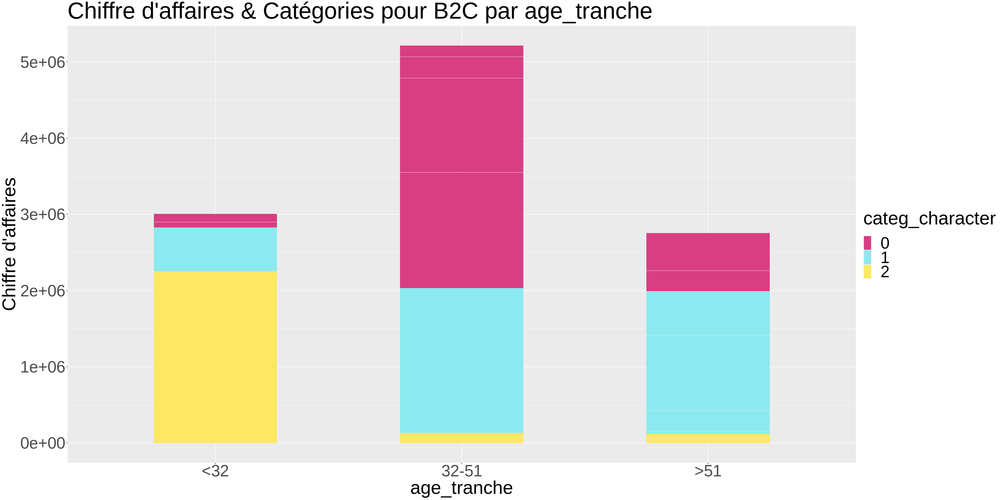

...

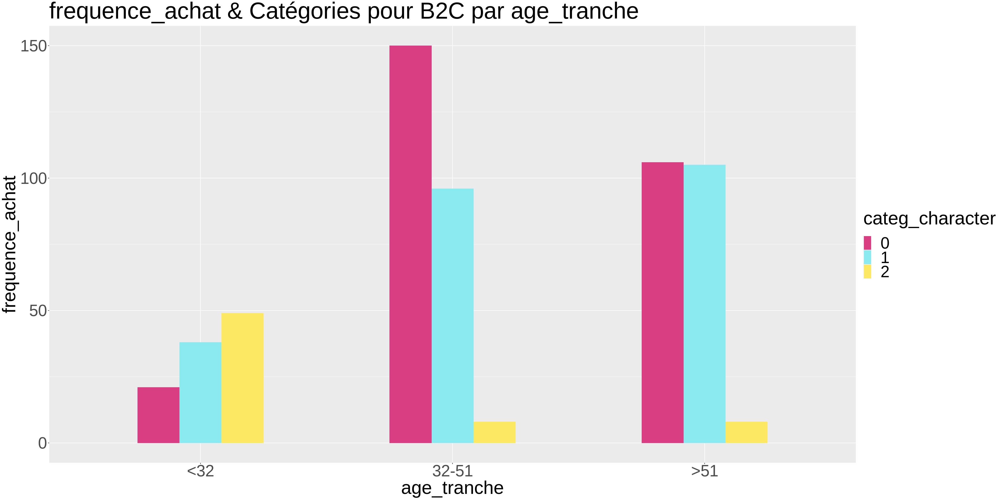

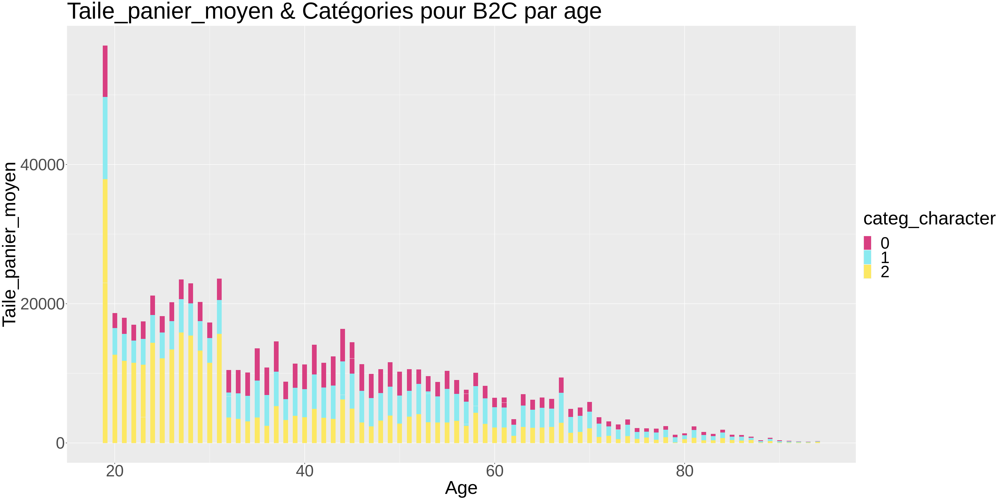

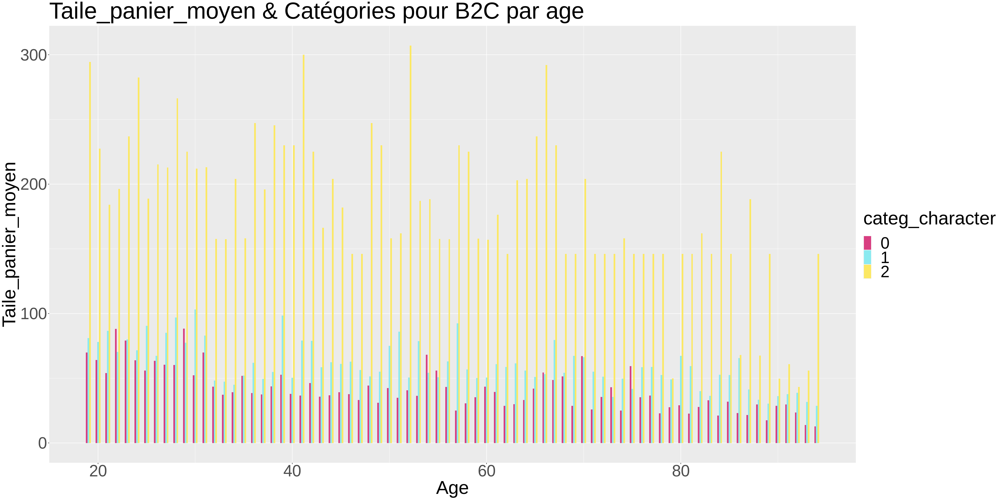

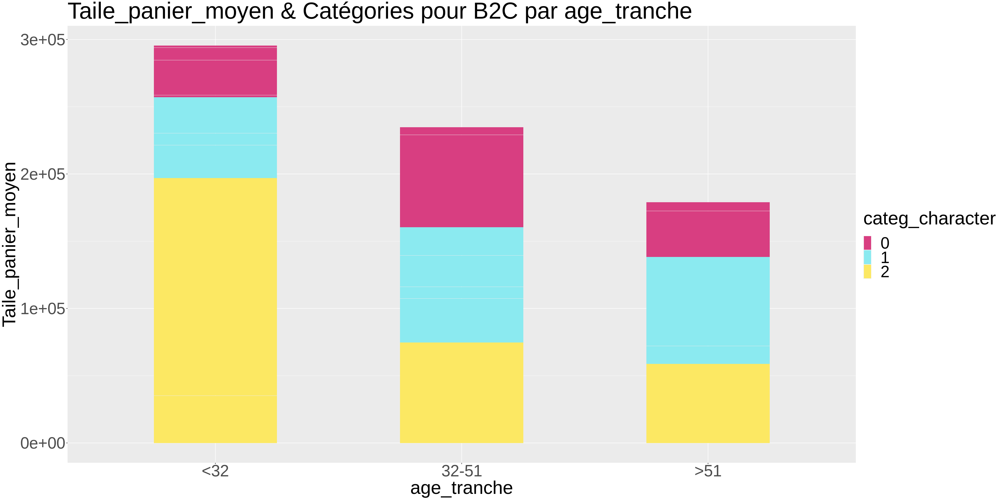

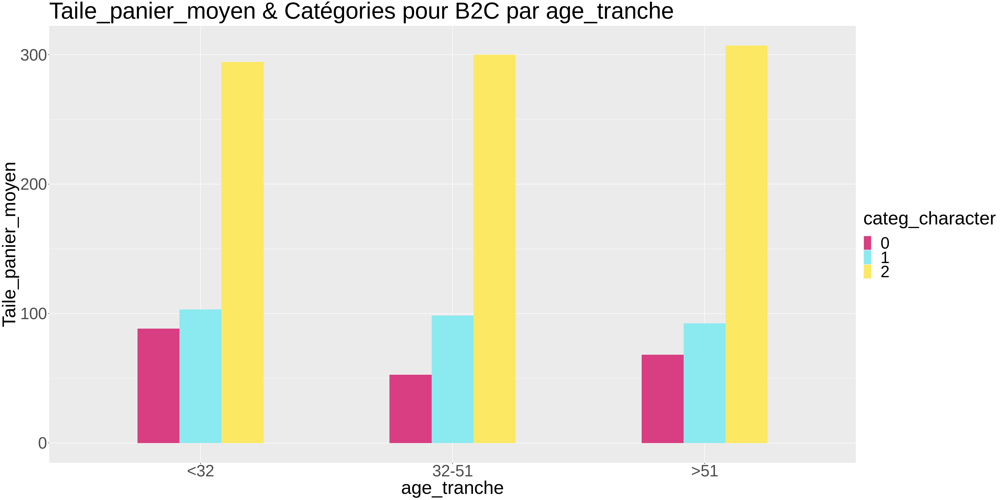

In [57]:
frequence_achat_Taile_panier_B2C_categ$age_tranche <- factor(frequence_achat_Taile_panier_B2C_categ$age_tranche, levels = c("<32", "32-51", ">51"))
frequence_achat_Taile_panier_B2C$age_tranche <- factor(frequence_achat_Taile_panier_B2C$age_tranche, levels = c("<32", "32-51", ">51"))


# fun_graph2(B2C,
#          aes(x=age, y=CA, fill=categ_character),
#          "Age", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age",
#          colors_for_categ)

# Chiffre d'affaires
# Age
fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=CA_client,fill=categ_character),
         "Age", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C,
         aes(x=age, y=CA_client,fill=sex),
         "Age", "Chiffre d'affaires","Chiffre d'affaires & sex pour B2C par age",
         colors_for_sex)

fun_graph2(frequence_achat_Taile_panier_B2C,
         aes(x=age, y=CA_client,fill=sex),
         "Age", "Chiffre d'affaires","Chiffre d'affaires & sex pour B2C par age",
         colors_for_sex)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=CA_client,fill=categ_character),
         "Age", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age",
         colors_for_categ)
# age_tranche
fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=CA_client,fill=categ_character),
         "age_tranche", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_mois,
         aes(x=age_tranche, y=CA_client,fill=sex),
         "age_tranche", "Chiffre d'affaires","Chiffre d'affaires & sex pour B2C par age_tranche",
         colors_for_sex)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=CA_client,fill=categ_character),
         "age_tranche", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=frequence_achat,fill=categ_character),
         "Age", "frequence_achat","frequence_achat & Catégories pour B2C par age",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=frequence_achat,fill=categ_character),
         "Age", "frequence_achat","frequence_achat & Catégories pour B2C par age",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=frequence_achat,fill=categ_character),
         "age_tranche", "frequence_achat","frequence_achat & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=frequence_achat,fill=categ_character),
         "age_tranche", "frequence_achat","frequence_achat & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=Taile_panier_moyenne,fill=categ_character),
         "Age", "Taile_panier_moyen","Taile_panier_moyen & Catégories pour B2C par age",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age, y=Taile_panier_moyenne,fill=categ_character),
         "Age", "Taile_panier_moyen","Taile_panier_moyen & Catégories pour B2C par age",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=Taile_panier_moyenne,fill=categ_character),
         "age_tranche", "Taile_panier_moyen","Taile_panier_moyen & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=Taile_panier_moyenne,fill=categ_character),
         "age_tranche", "Taile_panier_moyen","Taile_panier_moyen & Catégories pour B2C par age_tranche",
         colors_for_categ)

In [48]:
frequence_achat_Taile_panier_B2C[client_id == "c_1",]
frequence_achat_Taile_panier_B2C_categ[client_id == "c_1",]

client_id,sex,sex_numeric,age,CA_client,frequence_achat,Taile_panier_moyenne,Per_CA_client,age_tranche
<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<chr>
c_1,m,1,68,558.18,33,16.91455,0.004707964,>51


client_id,categ_character,sex,sex_numeric,age,CA_client,categ,frequence_achat,Taile_panier_moyenne,Per_CA_client,age_tranche
<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<int>,<int>,<dbl>,<dbl>,<fct>
c_1,0,m,1,68,360.15,0,27,13.33889,0.0030376820,>51
c_1,1,m,1,68,143.16,1,6,23.86000,0.0012074818,>51
c_1,2,m,1,68,54.87,2,1,54.87000,0.0004628005,>51


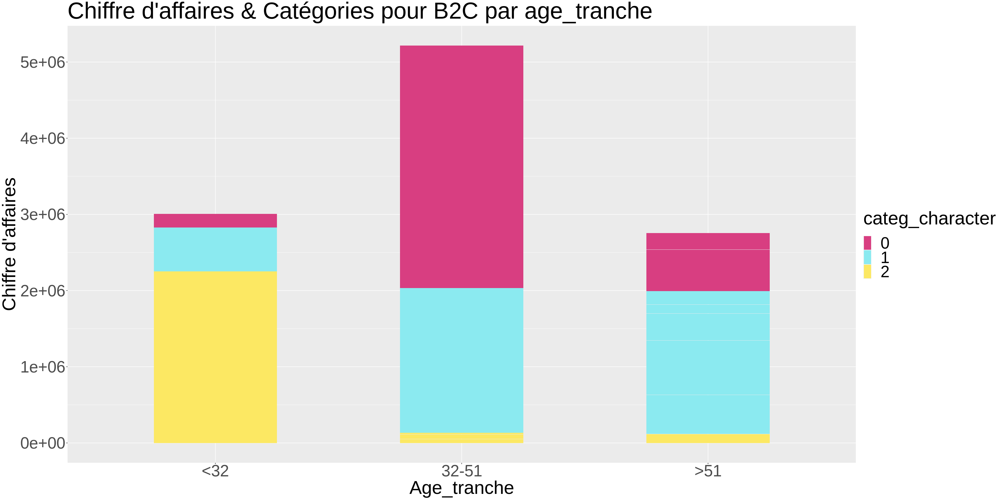

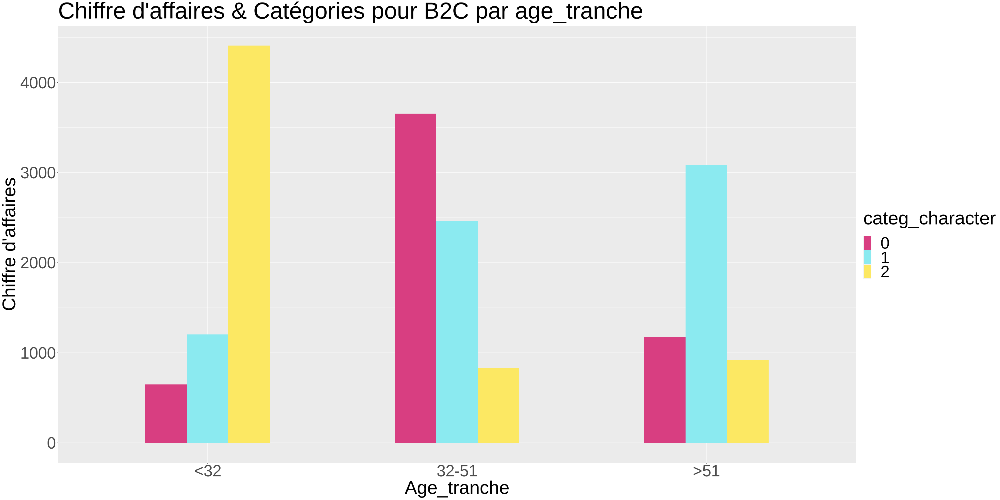

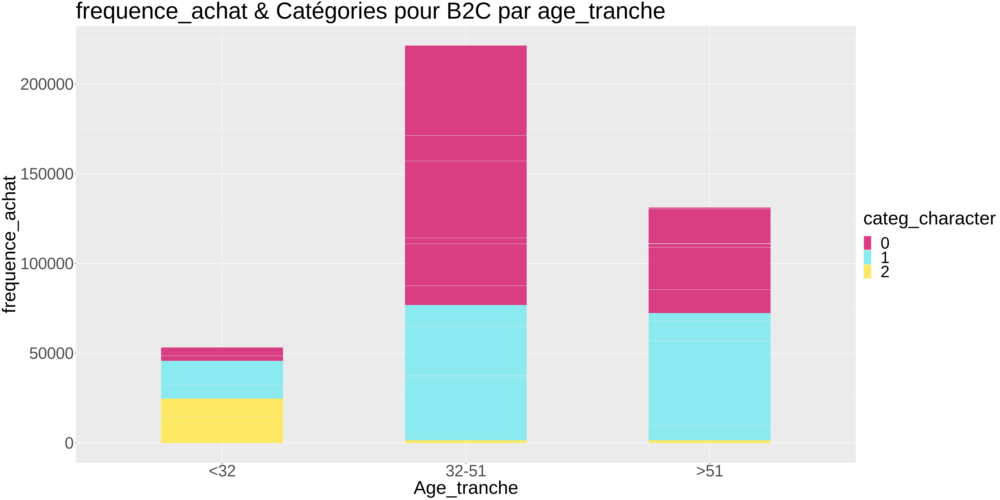

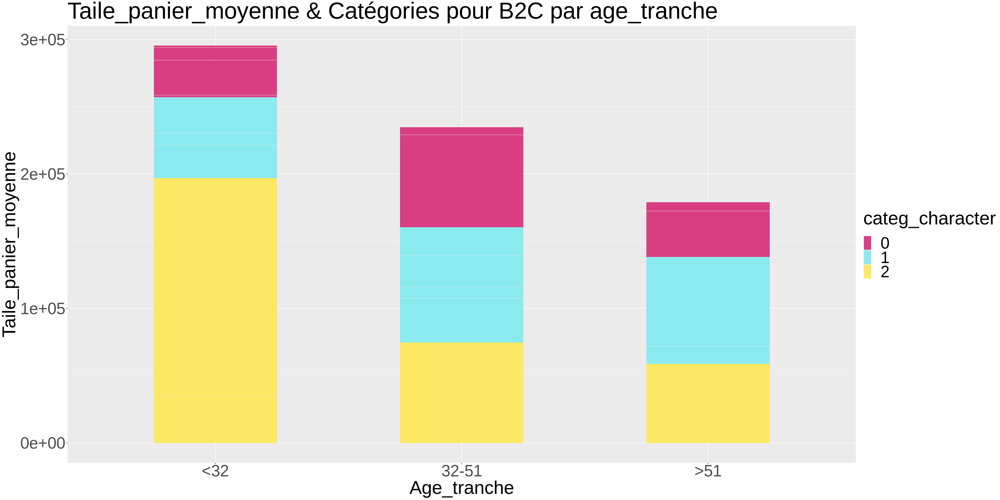

In [77]:
# lprop(table(Transactions_Produits_Clients_B2C$age, Transactions_Produits_Clients_B2C$categ))
B2C$age_tranche <- factor(B2C$age_tranche, levels = c("<32", "32-51", ">51"))



fun_graph(B2C,
         aes(x=age_tranche, y=CA, fill=categ_character),
         "Age_tranche", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=CA_client,fill=categ_character),
         "Age_tranche", "Chiffre d'affaires","Chiffre d'affaires & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=frequence_achat,fill=categ_character),
         "Age_tranche", "frequence_achat","frequence_achat & Catégories pour B2C par age_tranche",
         colors_for_categ)

fun_graph(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=Taile_panier_moyenne,fill=categ_character),
         "Age_tranche", "Taile_panier_moyenne","Taile_panier_moyenne & Catégories pour B2C par age_tranche",
         colors_for_categ)

#### Sex B2C par age

`summarise()` has grouped output by 'sex', 'age'. You can override using the
`.groups` argument.


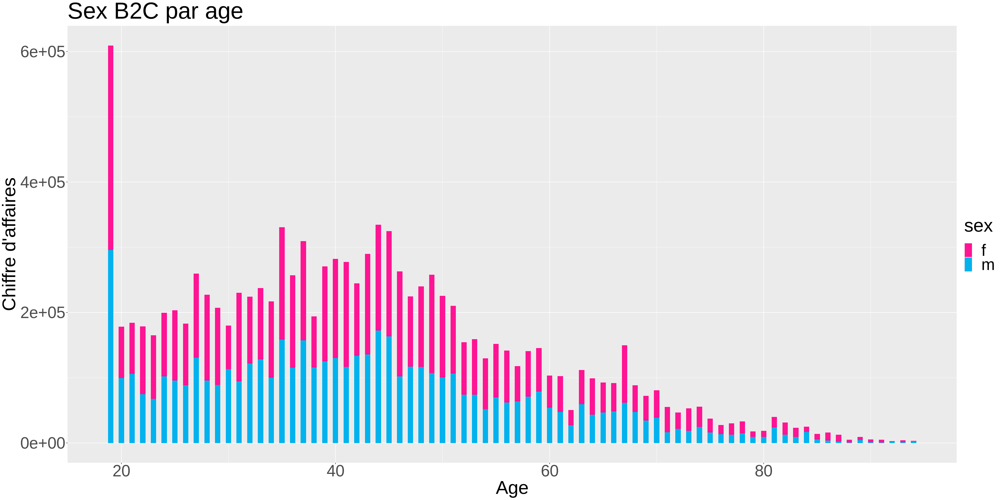

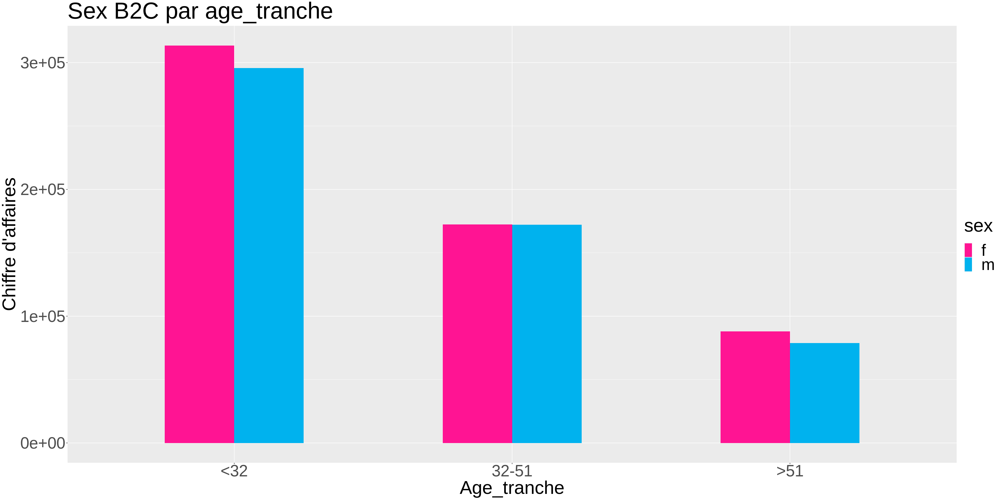

In [62]:
B2C_sex <- Transactions_Produits_Clients_B2C %>% group_by(sex,age,age_tranche) %>% summarise(CA=sum(price))
B2C_sex <- B2C_sex %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
# dim(B2C_sex)
# head(B2C_sex)
B2C_sex$age_tranche <- factor(B2C_sex$age_tranche, levels = c("<32", "32-51", ">51"))

# lprop(table(Transactions_Produits_Clients_B2C$age, Transactions_Produits_Clients_B2C$sex))
# B2C_f<-B2C[B2C$sex == 'f',]
# B2C_m<-B2C[B2C$sex == 'm',]

fun_graph(B2C_sex,
         aes(x=age, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Sex B2C par age",
         colors_for_sex)

fun_graph2(B2C_sex,
         aes(x=age_tranche, y=CA, fill=sex),
         "Age_tranche", "Chiffre d'affaires","Sex B2C par age_tranche",
         colors_for_sex)


# fun_graph3(B2C,
#          aes(x=age, y=CA, fill=sex),
#          "Age", "Chiffre d'affaires","Sex B2C par age",
#          colors_for_sex)

# fun_graph3(B2C_f,
#          aes(x=age, y=CA, fill=sex),
#          "Age", "Chiffre d'affaires","Femmes B2C par age",
#          colors_for_sex)

# fun_graph3(B2C_m,
#          aes(x=age, y=CA, fill=sex),
#          "Age", "Chiffre d'affaires","Hommes B2C par age",
#          colors_for_sex)

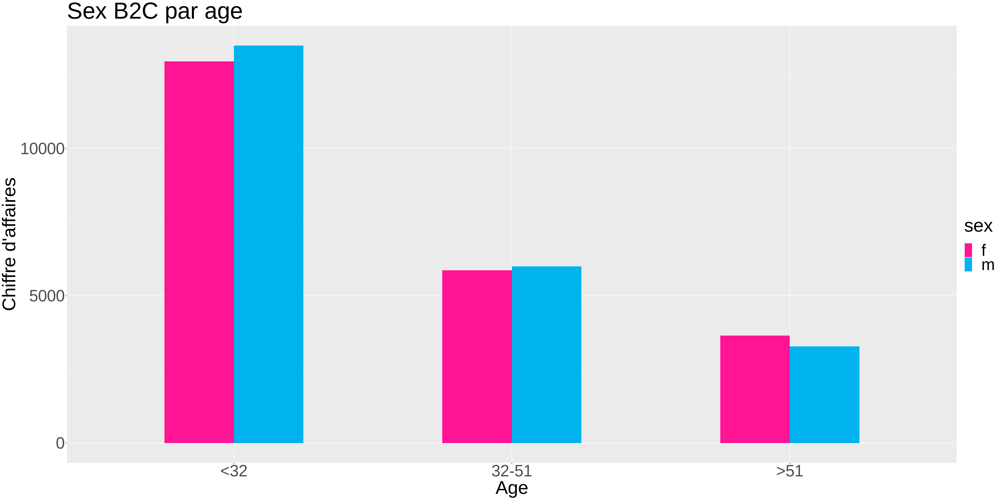

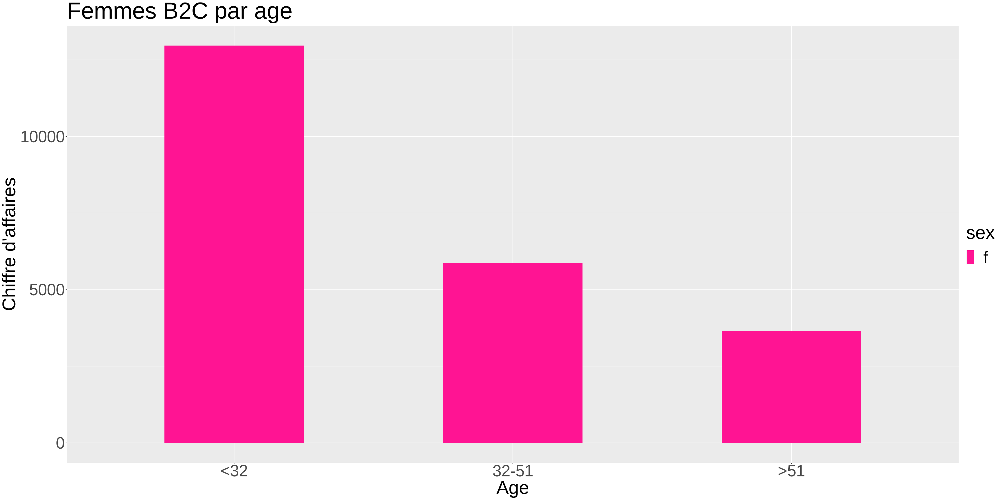

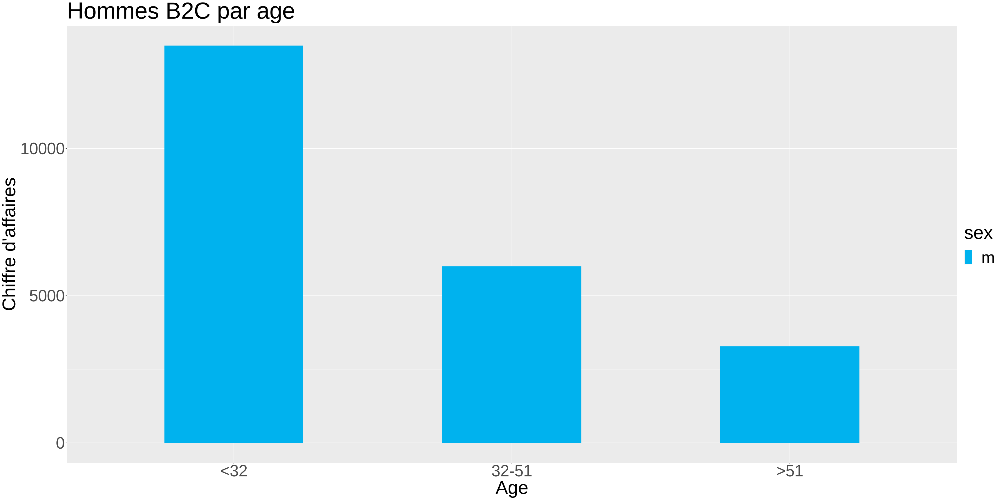

In [80]:
# lprop(table(Transactions_Produits_Clients_B2C$age, Transactions_Produits_Clients_B2C$sex))
B2C_f<-B2C[B2C$sex == 'f',]
B2C_m<-B2C[B2C$sex == 'm',]

fun_graph2(B2C,
         aes(x=age_tranche, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Sex B2C par age",
         colors_for_sex)

fun_graph2(B2C_f,
         aes(x=age_tranche, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Femmes B2C par age",
         colors_for_sex)

fun_graph2(B2C_m,
         aes(x=age_tranche, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Hommes B2C par age",
         colors_for_sex)

`geom_smooth()` using formula = 'y ~ x'


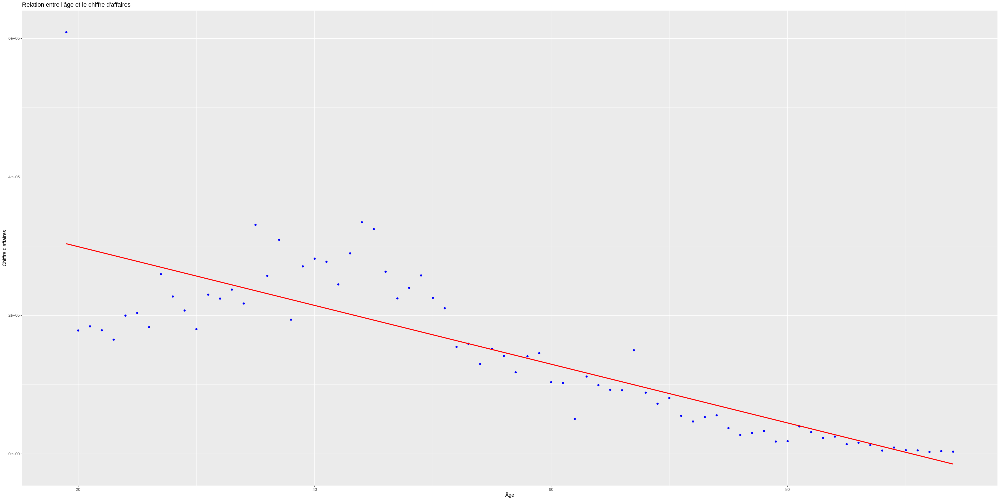

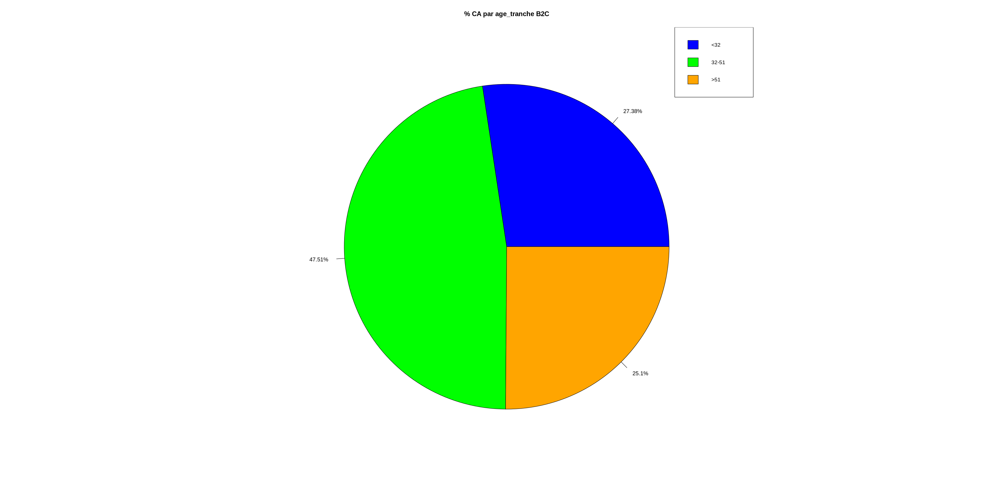

In [81]:
# CA_age
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age, y = CA_age)) +
  geom_point(color = "blue") +
  geom_smooth(method = "lm", se = FALSE,color = "red") +
  labs(title = "Relation entre l'âge et le chiffre d'affaires",
       x = "Âge",
       y = "Chiffre d'affaires")
# colors_for_age_tranche
B2C_age_tranche <- frequence_achat_Taile_panier_B2C_age %>% group_by(age_tranche) %>% summarise(CA=sum(CA_age))
B2C_age_tranche <- B2C_age_tranche %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
B2C_age_tranche$age_tranche <- factor(B2C_age_tranche$age_tranche,levels = c("<32", "32-51", ">51"))
# B2C_age_tranche
x <- B2C_age_tranche$Per_CA
labels <- B2C_age_tranche$age_tranche
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% CA par age_tranche B2C", col = colors_for_age_tranche)
legend( "topright",c("<32", "32-51", ">51"), cex = 0.96,
   fill = colors_for_age_tranche)

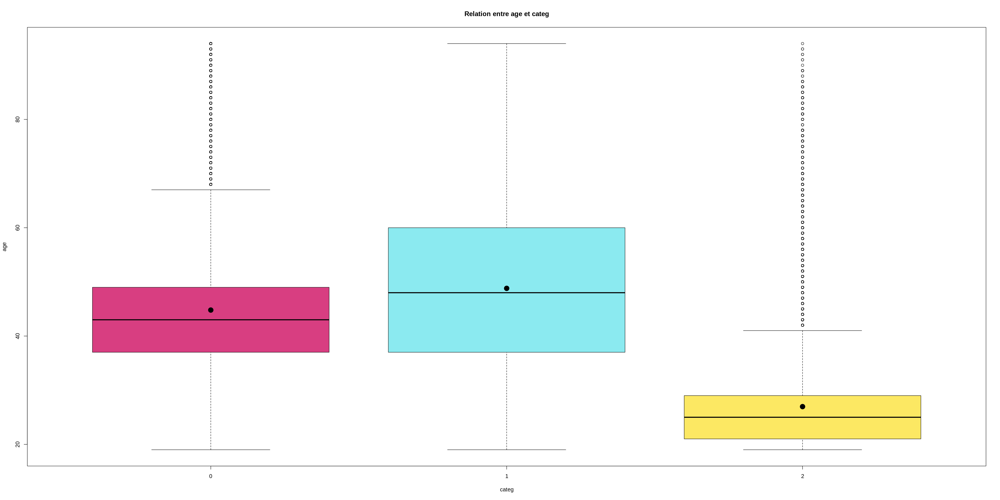

In [82]:
# age & categ

boxplot(Transactions_Produits_Clients_B2C$age ~ Transactions_Produits_Clients_B2C$categ,
        col = colors_for_categ,
        main = paste("Relation entre age et categ"),
        ylab = "age",
        xlab = "categ")
#calculate mean value by group
means_age <- tapply(Transactions_Produits_Clients_B2C$age, Transactions_Produits_Clients_B2C$categ, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

`geom_smooth()` using formula = 'y ~ x'


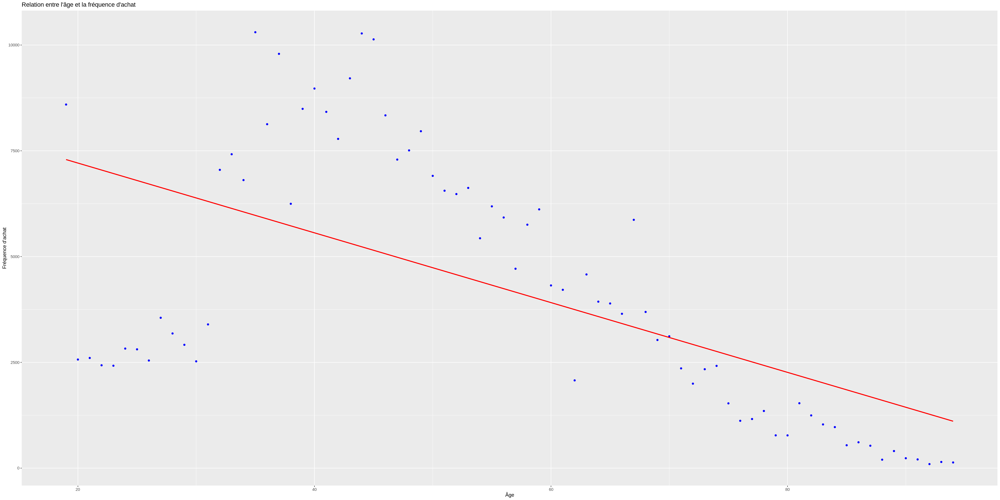

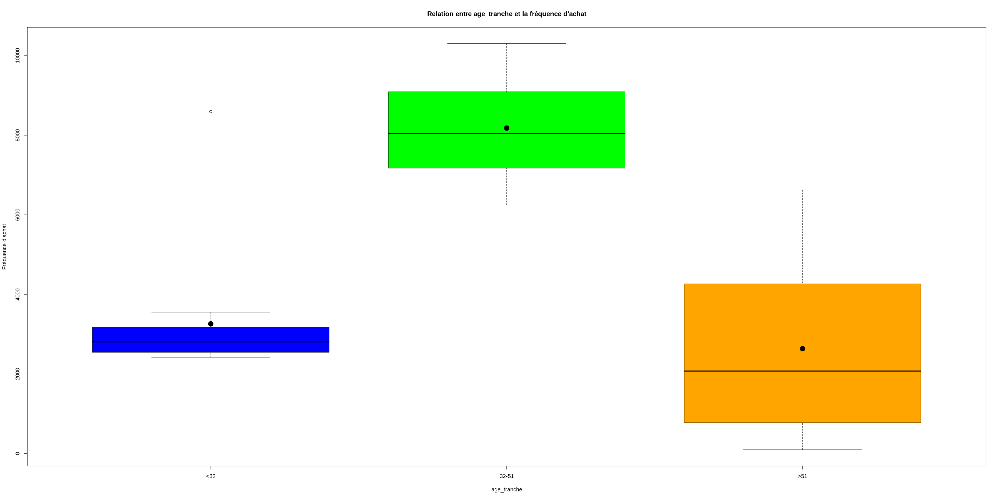

In [83]:
# frequence_achat & a
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age, y = frequence_achat)) +
  geom_point(color = "blue") +
  geom_smooth(method = "lm", se = FALSE,color = "red") +
  labs(title = "Relation entre l'âge et la fréquence d'achat",
       x = "Âge",
       y = "Fréquence d'achat")

boxplot(frequence_achat_Taile_panier_B2C_age$frequence_achat ~ frequence_achat_Taile_panier_B2C_age$age_tranche,
        col = colors_for_age_tranche,
        main = paste("Relation entre age_tranche et la fréquence d'achat"),
        ylab = "Fréquence d'achat",
        xlab = "age_tranche")
#calculate mean value by group
means_age <- tapply(frequence_achat_Taile_panier_B2C_age$frequence_achat, frequence_achat_Taile_panier_B2C_age$age_tranche, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

`geom_smooth()` using formula = 'y ~ x'


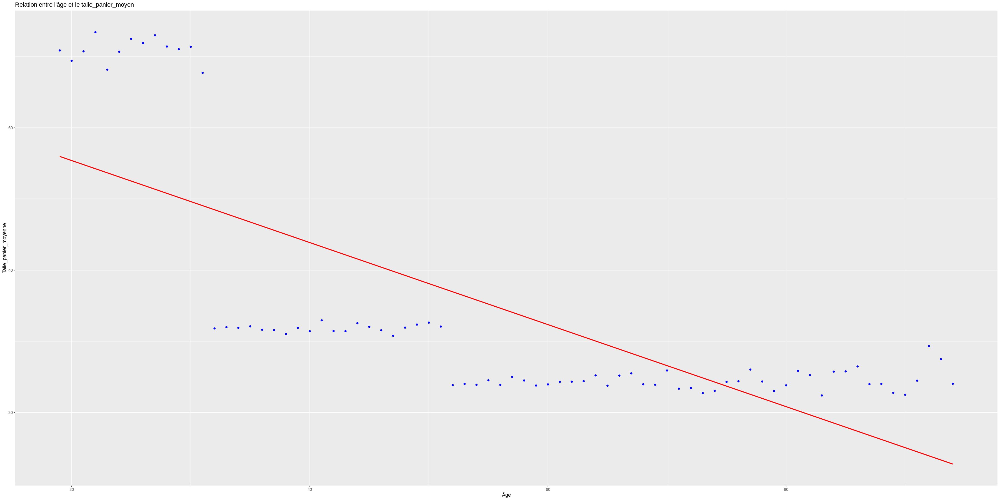

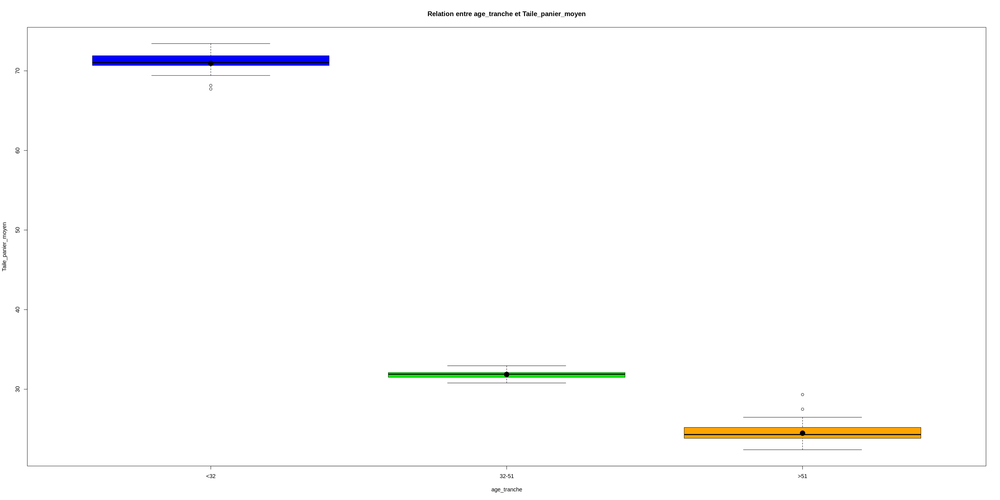

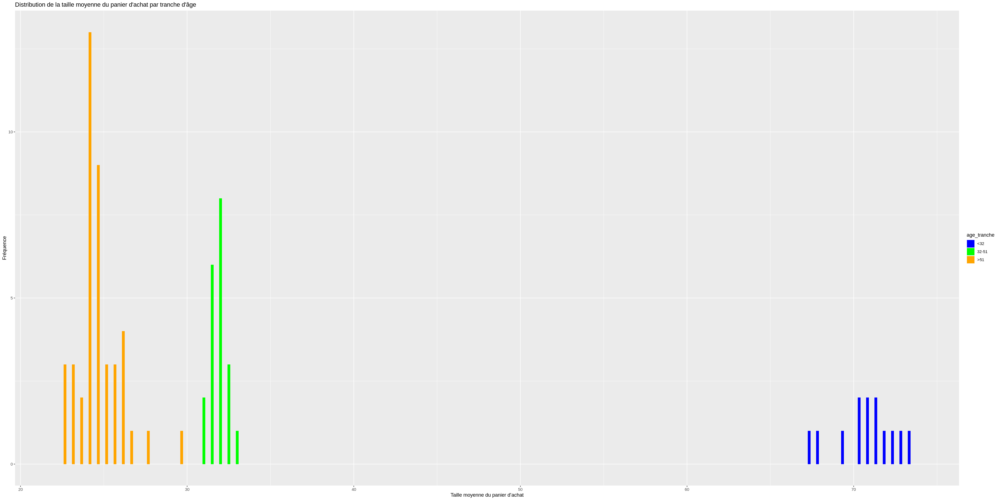

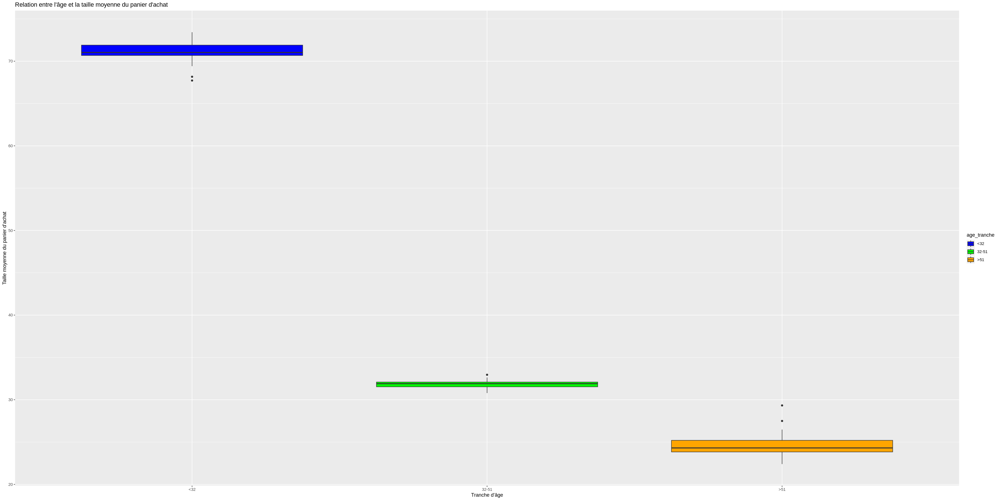

Warning message:
“Computation failed in `stat_summary()`
Caused by error in `fun.data()`:
! The package "Hmisc" is required.”


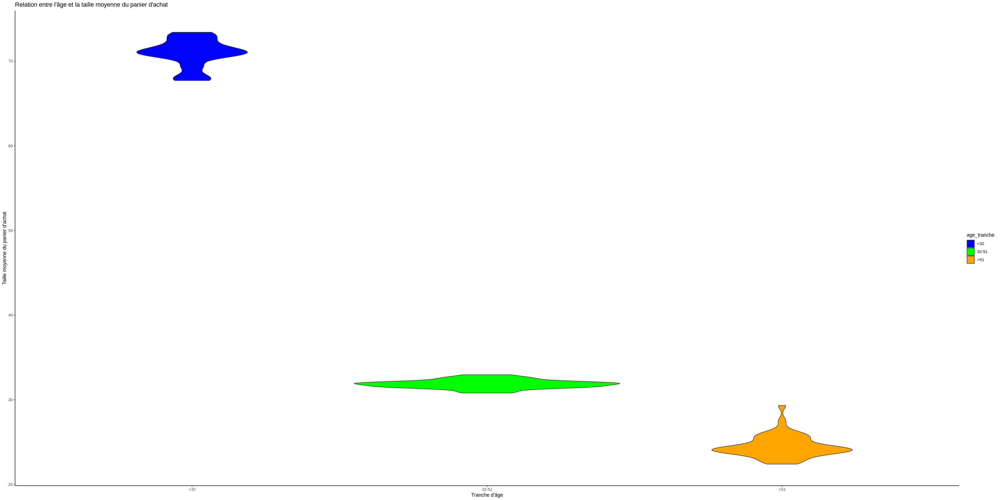

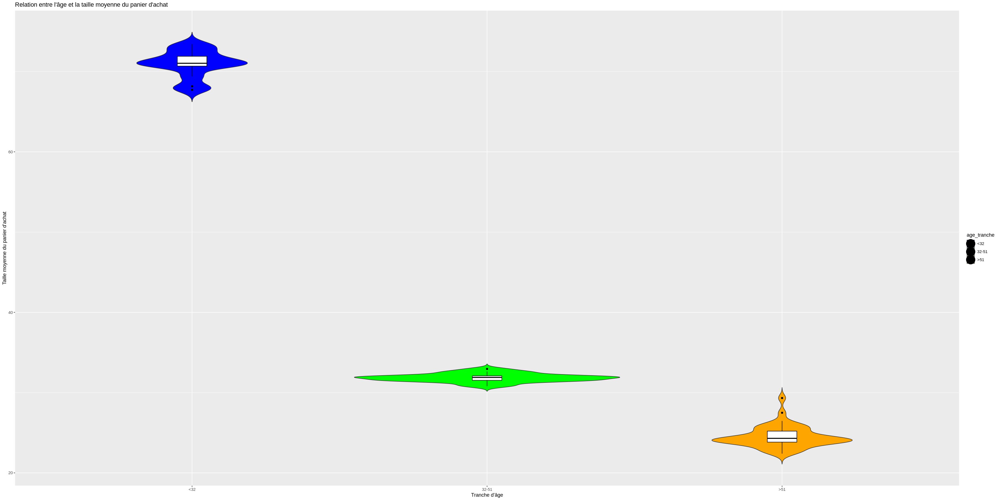

In [84]:
# Taile_panier_moyenne
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age, y = Taile_panier_moyenne)) +
  geom_point(color = "blue") +
  geom_smooth(method = "lm", se = FALSE,color = "red") +
  labs(title = "Relation entre l'âge et le taile_panier_moyen",
       x = "Âge",
       y = "Taile_panier_moyenne")

boxplot(frequence_achat_Taile_panier_B2C_age$Taile_panier_moyenne ~ frequence_achat_Taile_panier_B2C_age$age_tranche,
        col = colors_for_age_tranche,
        main = paste("Relation entre age_tranche et Taile_panier_moyen"),
        ylab = "Taile_panier_moyen",
        xlab = "age_tranche")
#calculate mean value by group
means_age <- tapply(frequence_achat_Taile_panier_B2C_age$Taile_panier_moyenne, frequence_achat_Taile_panier_B2C_age$age_tranche, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

library(ggplot2)
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = Taile_panier_moyenne, fill = age_tranche)) +
  geom_histogram(binwidth = 0.5, position = "dodge") +
  labs(title = "Distribution de la taille moyenne du panier d'achat par tranche d'âge",
       x = "Taille moyenne du panier d'achat",
       y = "Fréquence") +
  scale_fill_manual(values = colors_for_age_tranche)


library(ggplot2)
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age_tranche, y = Taile_panier_moyenne, fill = age_tranche)) +
  geom_boxplot() +
  labs(title = "Relation entre l'âge et la taille moyenne du panier d'achat",
       x = "Tranche d'âge",
       y = "Taille moyenne du panier d'achat") +
  scale_fill_manual(values = colors_for_age_tranche)

library(ggplot2)
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age_tranche, y = Taile_panier_moyenne, fill = age_tranche)) +
  geom_violin() +
  labs(title = "Relation entre l'âge et la taille moyenne du panier d'achat",
       x = "Tranche d'âge",
       y = "Taille moyenne du panier d'achat") +
  scale_fill_manual(values = colors_for_age_tranche) +
  theme_classic()

library(ggplot2)
ggplot(frequence_achat_Taile_panier_B2C_age, aes(x = age_tranche, y = Taile_panier_moyenne, fill = age_tranche)) +
  geom_violin(trim = FALSE) +
  geom_boxplot(width = 0.1, fill = "white", color = "black") +
  stat_summary(fun.data = "mean_sdl", fun.args = list(mult = 1), geom = "pointrange", color = "black", size = 2) +
  labs(title = "Relation entre l'âge et la taille moyenne du panier d'achat",
       x = "Tranche d'âge",
       y = "Taille moyenne du panier d'achat") +
  scale_fill_manual(values = colors_for_age_tranche) 


[1] "Le chiffre d'affaire totale pour  est : 10974953"
[1] "La proportion de chiffre d'affaires pour les clients  par rapport de chiffre d'affaires est : 100 %."


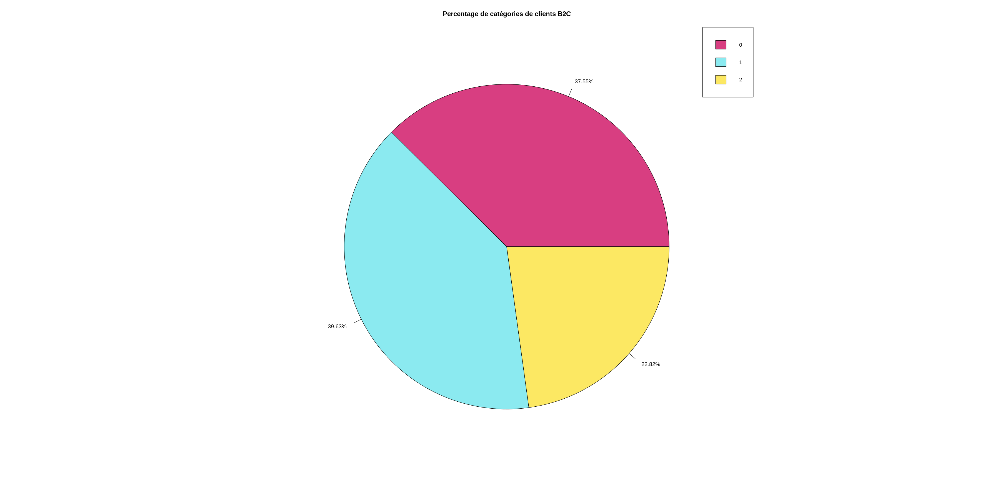

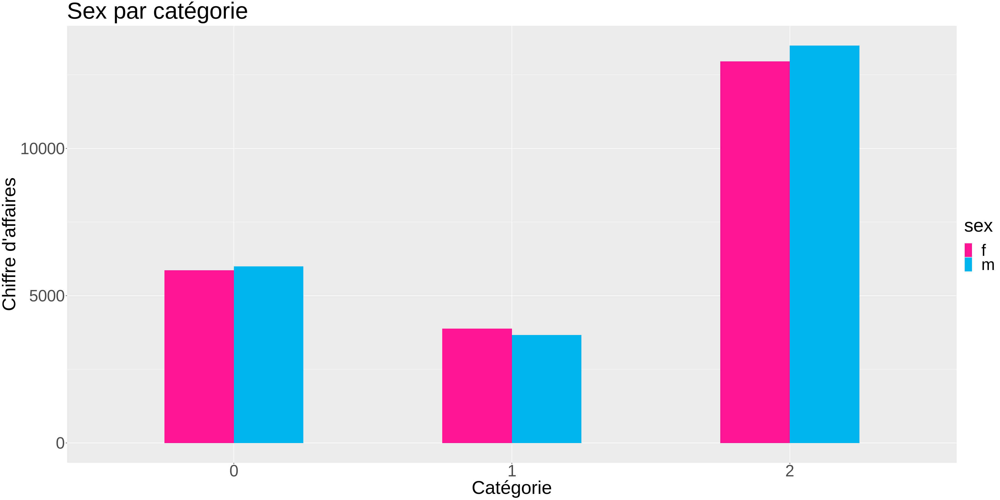

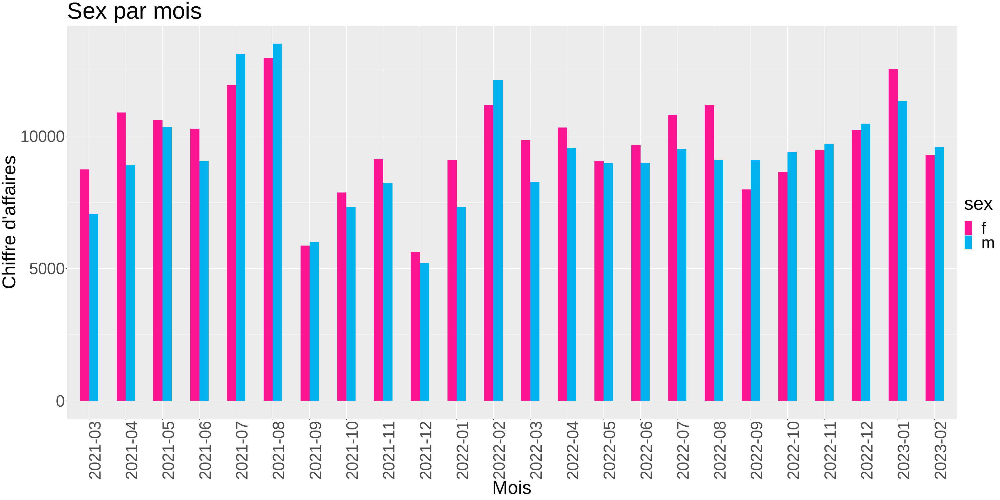

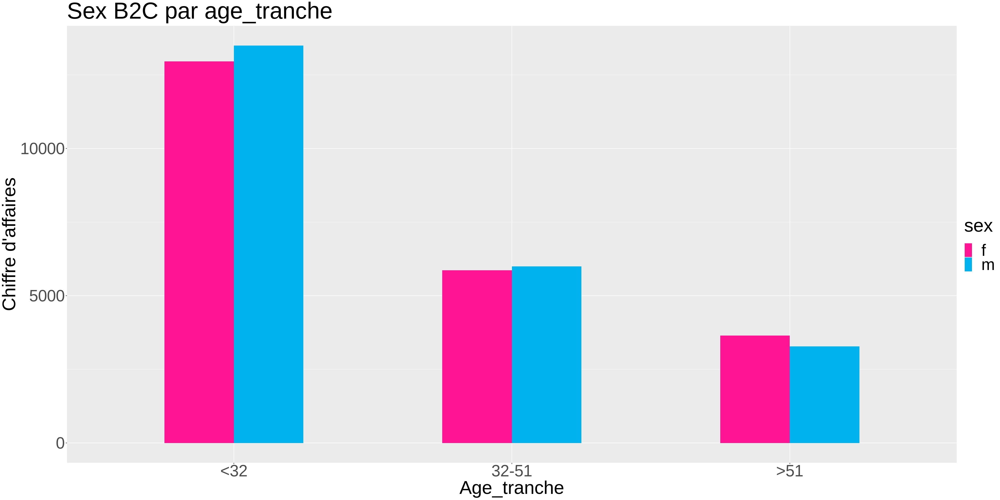

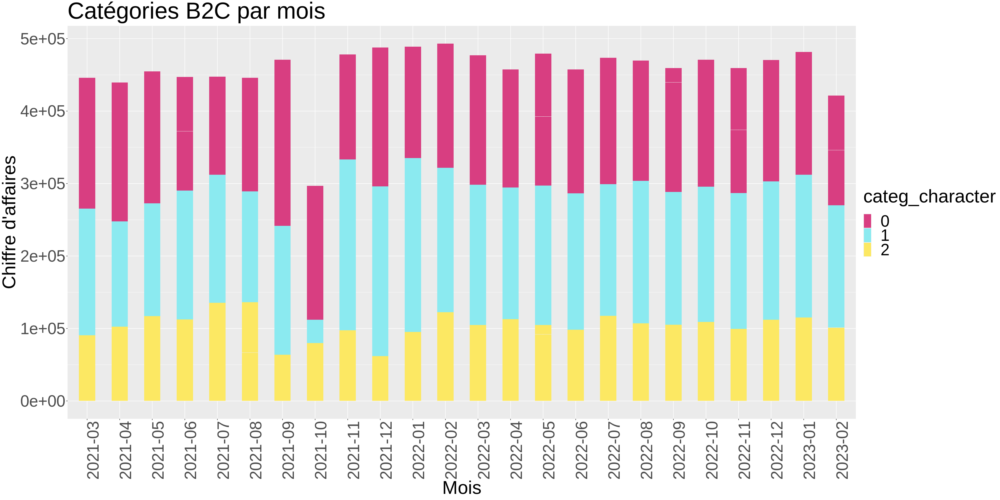

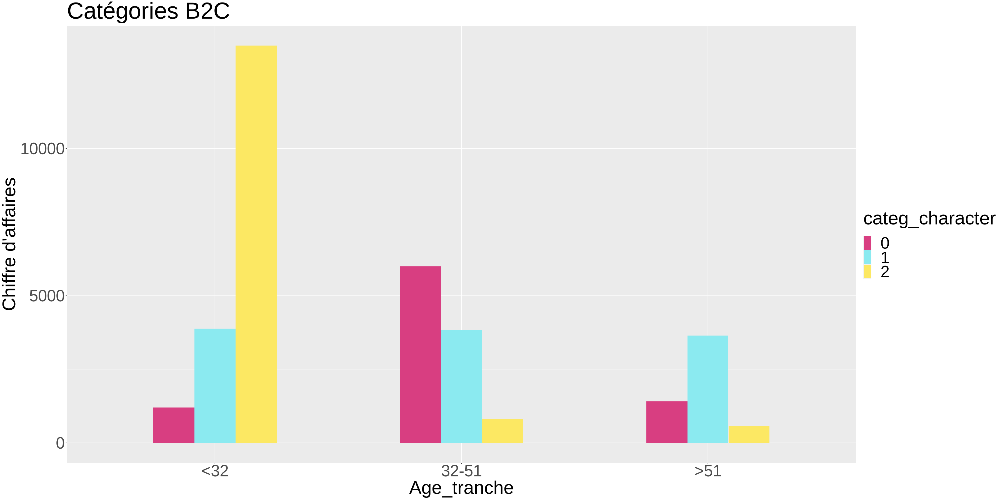

In [85]:

categ <- Transactions_Produits_Clients_B2C %>% group_by(categ_character) %>% summarise(CA=sum(price))
Total_chiffre_affaire <-fun_ca_prop1(Transactions_Produits_Clients_B2C)
categ <- categ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire))

fun_ca_prop("", Transactions_Produits_Clients_B2C, Total_chiffre_affaire_B2C)

x <- categ$Per_CA
labels <- categ$categ_character
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
        fill = colors_for_categ)

fun_graph2(B2C,
           aes(x=categ_character, y=CA, fill=sex),
           "Catégorie", "Chiffre d'affaires","Sex par catégorie",
           colors_for_sex)
# lprop(table(B2C_age_19_31$categ, B2C_age_19_31$sex))


fun_graph3(B2C,
           aes(x=mois, y=CA, fill=sex),
           "Mois", "Chiffre d'affaires","Sex par mois",
           colors_for_sex)
# lprop(table(B2C_age_19_31$mois, B2C_age_19_31$sex))

fun_graph2(B2C,
         aes(x=age_tranche, y=CA, fill=sex),
         "Age_tranche", "Chiffre d'affaires","Sex B2C par age_tranche",
         colors_for_sex)
# lprop(table(B2C_age_19_31$age, B2C_age_19_31$sex))

fun_graph1(B2C,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégories B2C par mois",
           colors_for_categ)
# lprop(table(B2C_age_19_31$mois, B2C_age_19_31$categ))

fun_graph2(B2C,
           aes(x=age_tranche, y=CA, fill=categ_character),
           "Age_tranche", "Chiffre d'affaires","Catégories B2C",
           colors_for_categ)
# lprop(table(B2C_age_19_31$age, B2C_age_19_31$categ))

# fun_graph1(B2C,
#            aes(x=jour, y=CA, fill=categ_character),
#            "Jour", "Chiffre d'affaires","Catégories B2C par jour",
#            colors_for_categ)


# jour_19_31 <- B2C_age_19_31 %>% group_by(jour) %>% summarise(CA=sum(price))
# jour_19_31 <- jour_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# jour_19_31 <- jour_19_31[order(jour_19_31$Per_CA, decreasing = TRUE),]
# # dim(jour_19_31)
# # head(jour_19_31,10)

# heure_19_31 <- B2C_age_19_31 %>% group_by(heure) %>% summarise(CA=sum(price))
# heure_19_31 <- heure_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# heure_19_31 <- heure_19_31[order(heure_19_31$Per_CA, decreasing = TRUE),]
# # dim(heure_19_31)
# # head(heure_19_31,10)

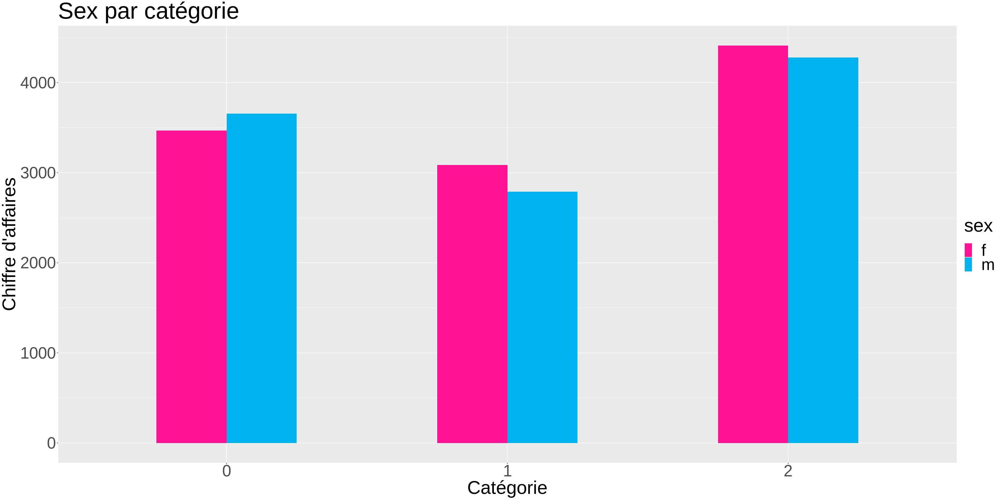

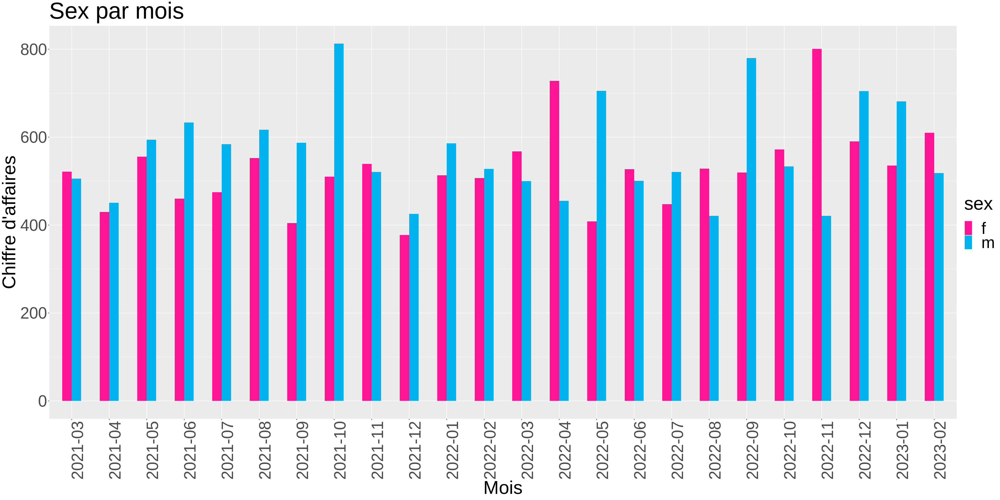

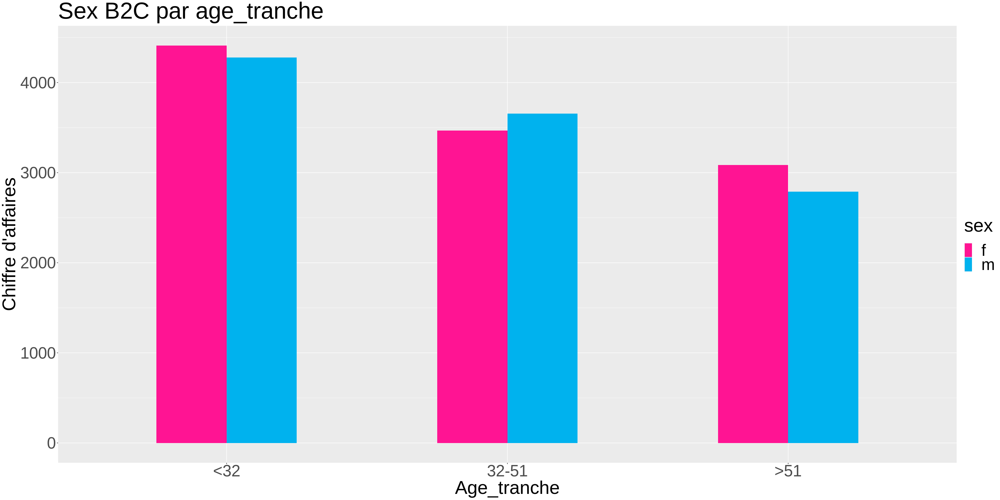

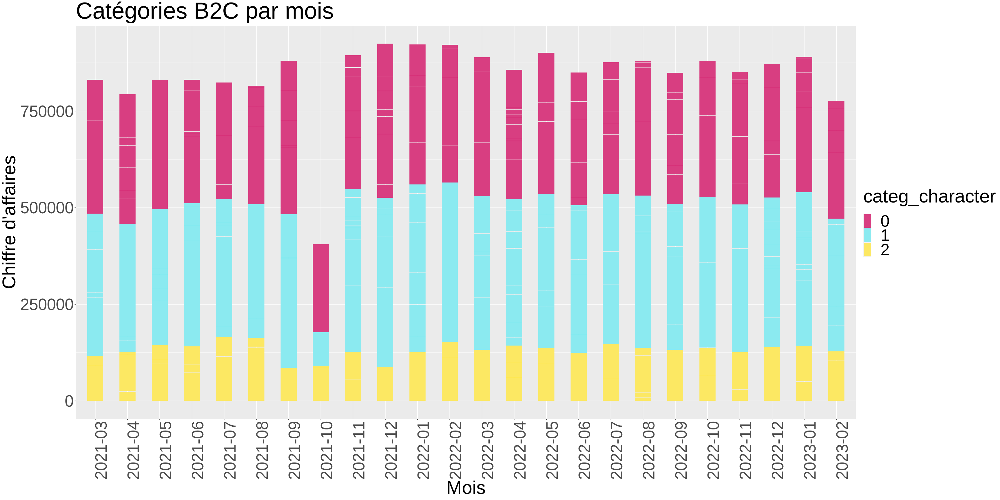

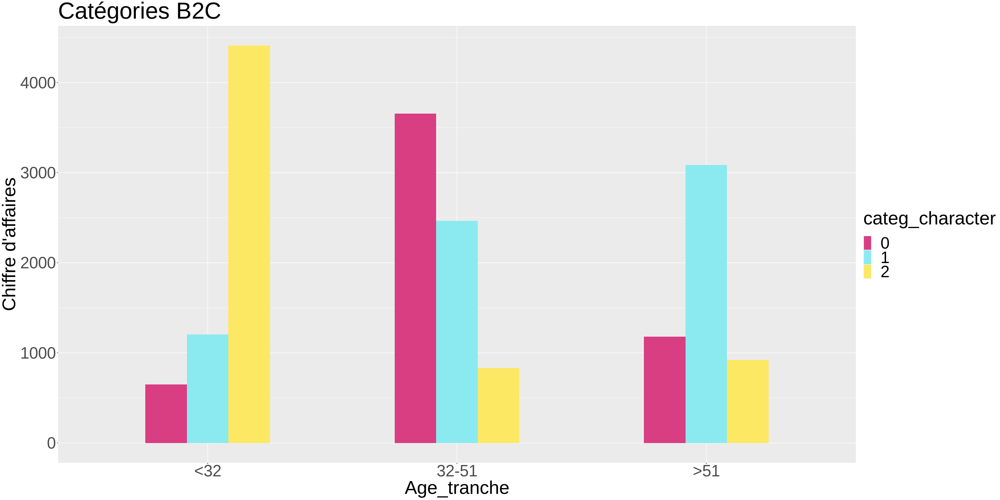

In [86]:
# frequence_achat_Taile_panier_B2C_categ

# categ <- Transactions_Produits_Clients_B2C %>% group_by(categ_character) %>% summarise(CA=sum(price))
# Total_chiffre_affaire <-fun_ca_prop1(Transactions_Produits_Clients_B2C)
# categ <- categ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire))

# fun_ca_prop("", Transactions_Produits_Clients_B2C, Total_chiffre_affaire_B2C)

# x <- categ$Per_CA
# labels <- categ$categ_character
# piepercent<- paste0(round(x, 2), "%")
# pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C", col = colors_for_categ)
# legend( "topright",c("0","1","2"), cex = 0.96,
#         fill = colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
           aes(x=categ_character, y=CA_client, fill=sex),
           "Catégorie", "Chiffre d'affaires","Sex par catégorie",
           colors_for_sex)


fun_graph3(frequence_achat_Taile_panier_B2C_mois,
           aes(x=mois, y=CA_client, fill=sex),
           "Mois", "Chiffre d'affaires","Sex par mois",
           colors_for_sex)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
         aes(x=age_tranche, y=CA_client, fill=sex),
         "Age_tranche", "Chiffre d'affaires","Sex B2C par age_tranche",
         colors_for_sex)

fun_graph1(frequence_achat_Taile_panier_B2C_mois,
           aes(x=mois, y=CA_client, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégories B2C par mois",
           colors_for_categ)

fun_graph2(frequence_achat_Taile_panier_B2C_categ,
           aes(x=age_tranche, y=CA_client, fill=categ_character),
           "Age_tranche", "Chiffre d'affaires","Catégories B2C",
           colors_for_categ)

# fun_graph1(B2C,
#            aes(x=jour, y=CA, fill=categ_character),
#            "Jour", "Chiffre d'affaires","Catégories B2C par jour",
#            colors_for_categ)


# jour_19_31 <- B2C_age_19_31 %>% group_by(jour) %>% summarise(CA=sum(price))
# jour_19_31 <- jour_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# jour_19_31 <- jour_19_31[order(jour_19_31$Per_CA, decreasing = TRUE),]
# # dim(jour_19_31)
# # head(jour_19_31,10)

# heure_19_31 <- B2C_age_19_31 %>% group_by(heure) %>% summarise(CA=sum(price))
# heure_19_31 <- heure_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# heure_19_31 <- heure_19_31[order(heure_19_31$Per_CA, decreasing = TRUE),]
# # dim(heure_19_31)
# # head(heure_19_31,10)

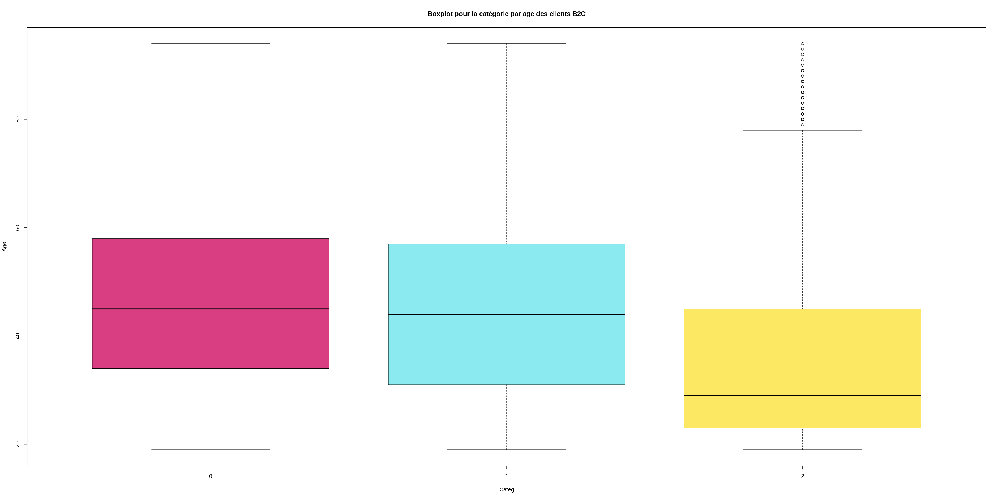

In [87]:
#Une seule variable, par groupe
boxplot(frequence_achat_Taile_panier_B2C_categ$age ~ frequence_achat_Taile_panier_B2C_categ$categ,
        col = colors_for_categ,
        main = paste("Boxplot pour la catégorie par age des clients B2C"),
        ylab = "Age",
        xlab = "Categ")
#calculate mean value by group
means_categ <- tapply(frequence_achat_Taile_panier_B2C_categ$age, frequence_achat_Taile_panier_B2C_categ$categ)
#add means as circles to each boxplot
points(means_categ, pch=20, cex=5)

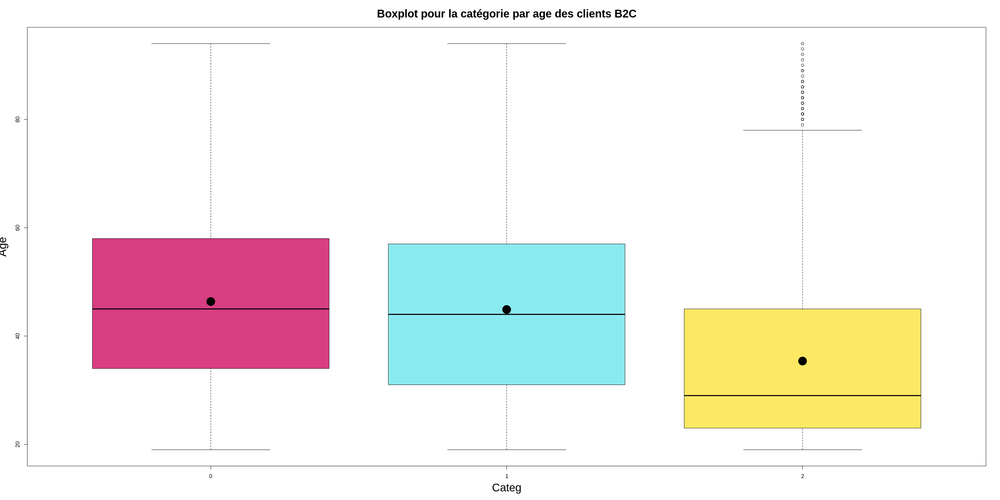

In [88]:
# Charger les données
data <- frequence_achat_Taile_panier_B2C_categ

# Créer le boxplot
boxplot(age ~ categ, data = data,
        col = colors_for_categ,
        main = list("Boxplot pour la catégorie par age des clients B2C", cex = 2),
        ylab = list("Age", cex = 2
                   ),
        xlab = list("Categ", cex = 2))

# Calculer la valeur moyenne par groupe
means_categ <- tapply(data$age, data$categ, mean)

# Ajouter les moyennes sous forme de cercles à chaque boxplot
points(means_categ, pch = 20, cex = 5)


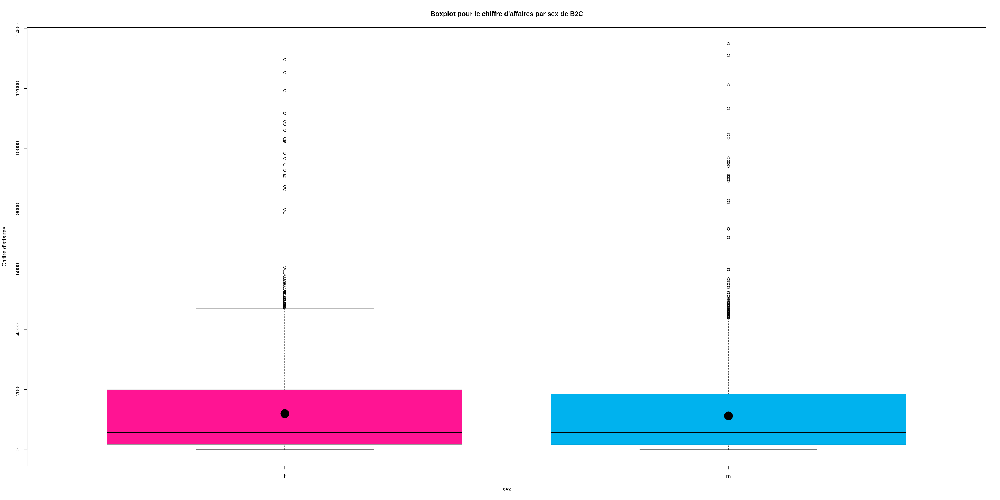

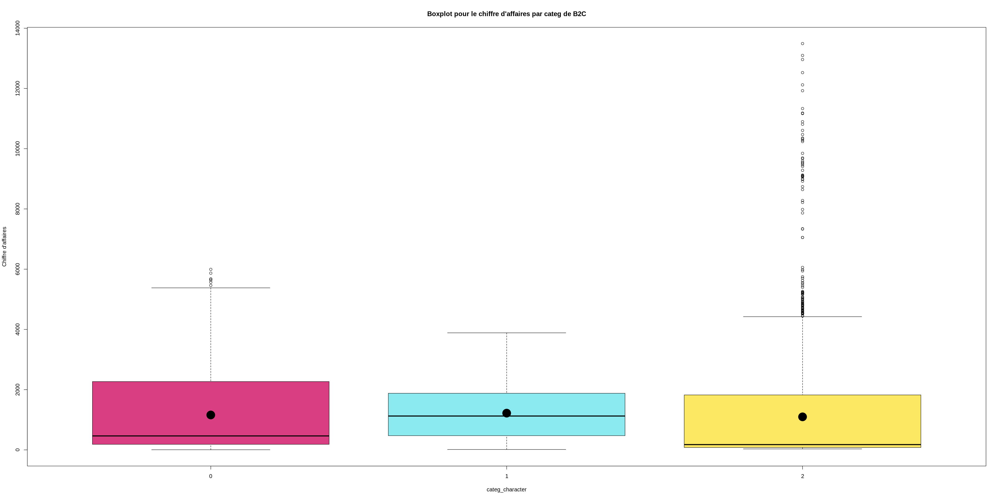

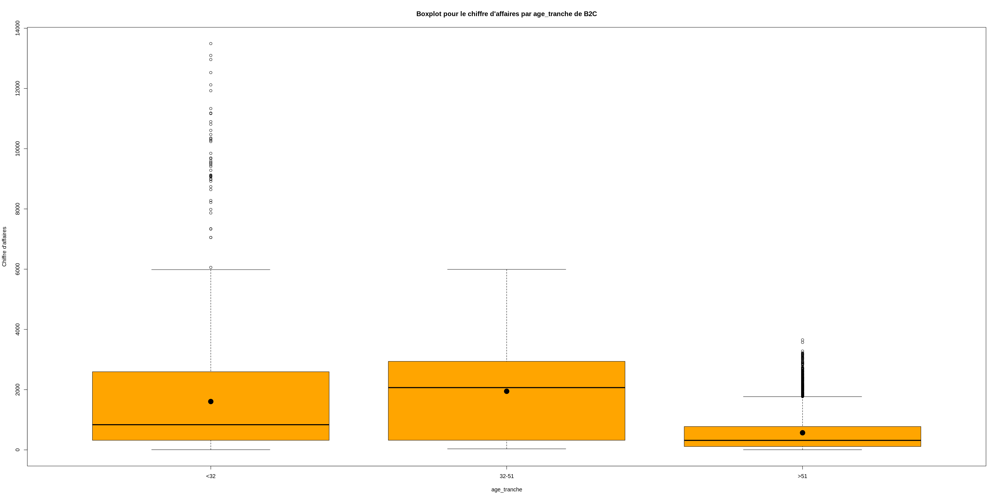

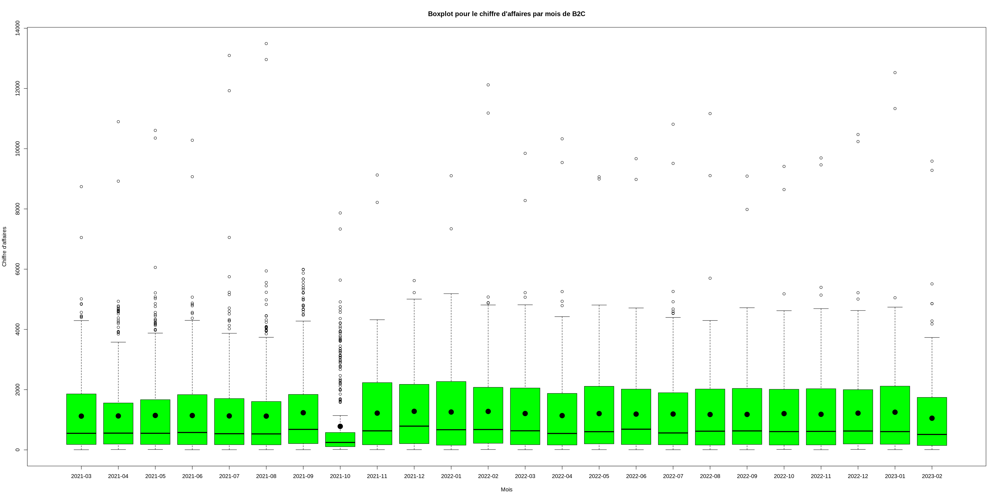

Warning message:
“The `fun.y` argument of `stat_summary()` is deprecated as of ggplot2 3.3.0.
ℹ Please use the `fun` argument instead.”
Warning message:
“Removed 3564 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 3564 rows containing non-finite values (`stat_summary()`).”


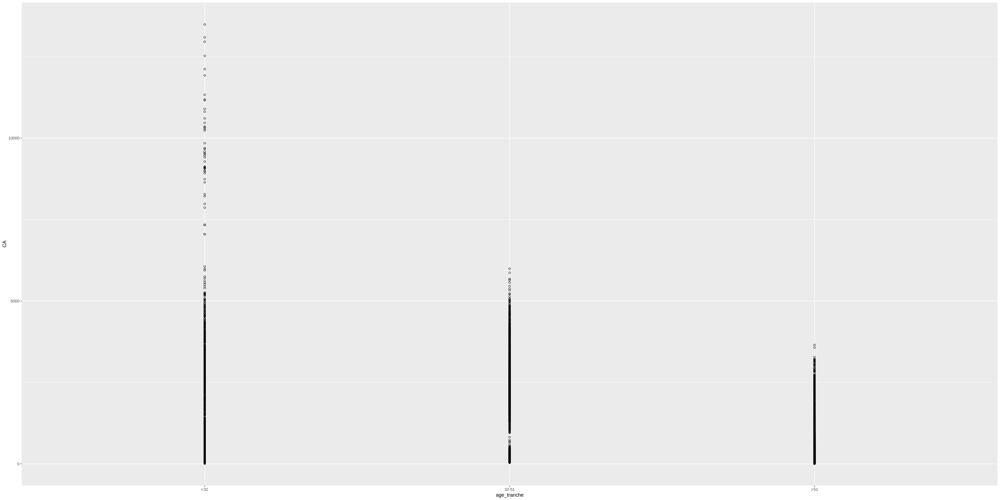

Warning message:
“Removed 3564 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 3564 rows containing non-finite values (`stat_summary()`).”


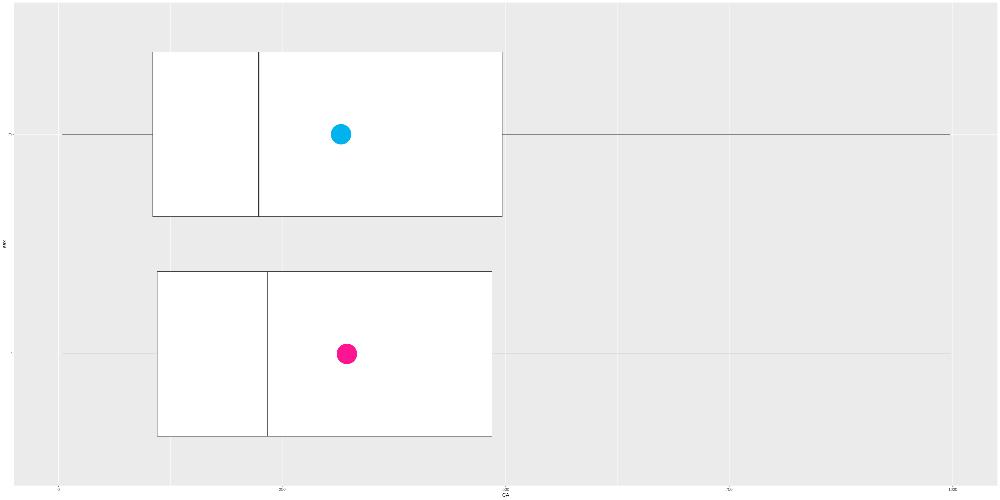

Warning message:
“Removed 3564 rows containing non-finite values (`stat_boxplot()`).”
Warning message:
“Removed 3564 rows containing non-finite values (`stat_summary()`).”


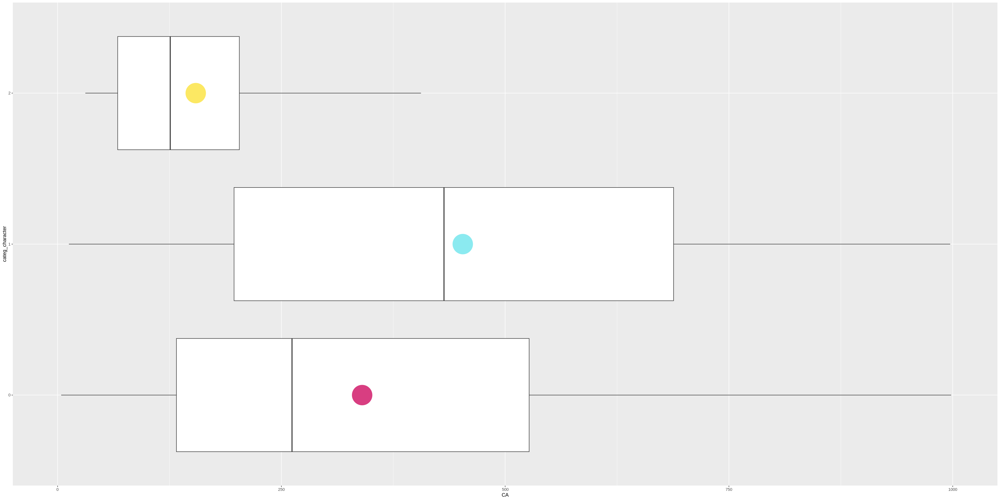

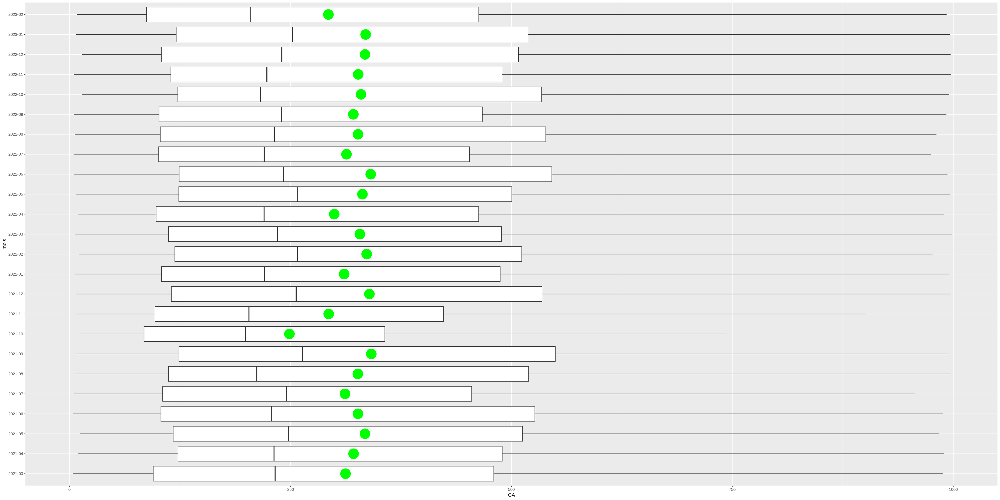

In [89]:
#Une seule variable, par groupe
boxplot(B2C$CA ~ B2C$sex,
        col = colors_for_sex,
        main = paste("Boxplot pour le chiffre d'affaires par sex de B2C"),
        ylab = "Chiffre d'affaires",
        xlab = "sex")
#calculate mean value by group
means_sex <- tapply(B2C$CA, B2C$sex, mean)
#add means as circles to each boxplot
points(means_sex, pch=20, cex=5)

boxplot(B2C$CA ~ B2C$categ_character,
        col = colors_for_categ,
        main = paste("Boxplot pour le chiffre d'affaires par categ de B2C"),
        ylab = "Chiffre d'affaires",
        xlab = "categ_character")
#calculate mean value by group
means_categ_character <- tapply(B2C$CA, B2C$categ_character, mean)
#add means as circles to each boxplot
points(means_categ_character, pch=20, cex=5)

boxplot(B2C$CA ~ B2C$age_tranche,
        col = c("orange"),
        main = paste("Boxplot pour le chiffre d'affaires par age_tranche de B2C"),
        ylab = "Chiffre d'affaires",
        xlab = "age_tranche")
#calculate mean value by group
means_age_tranche <- tapply(B2C$CA, B2C$age_tranche, mean)
#add means as circles to each boxplot
points(means_age_tranche, pch=20, cex=3)

boxplot(B2C$CA ~ B2C$mois,
        col = c("green"),
        main = paste("Boxplot pour le chiffre d'affaires par mois de B2C"),
        ylab = "Chiffre d'affaires",
        xlab = "Mois")
#calculate mean value by group
means_mois <- tapply(B2C$CA, B2C$mois, mean)
#add means as circles to each boxplot
points(means_mois, pch=20, cex=3)

ggplot(B2C, aes(age_tranche,CA)) + geom_point(shape=1) + 
  labs(x="age_tranche", y="CA")

#X = "sex" # qualitative
#Y = "CA" # quantitative

ggplot(B2C, aes(x=sex, y=CA)) + 
  geom_boxplot(outlier.shape = NA) + coord_flip() + 
  stat_summary(fun.y=mean, colour=colors_for_sex, geom="point", shape=19, size=20) +
  scale_y_continuous(limits = c(0,1000))

#X = "categ_character" # qualitative
#Y = "CA" # quantitative

ggplot(B2C, aes(x=categ_character, y=CA)) + 
  geom_boxplot(outlier.shape = NA) + coord_flip() + 
  stat_summary(fun.y=mean, colour=colors_for_categ, geom="point", shape=19, size=20) +
  scale_y_continuous(limits = c(0,1000))

#X = "mois" # qualitative
#Y = "CA" # quantitative

ggplot(B2C, aes(x=mois, y=CA)) + 
  geom_boxplot(outlier.shape = NA) + coord_flip() + 
  stat_summary(fun.y=mean, colour="green", geom="point", shape=19, size=10) +
  scale_y_continuous(limits = c(0,1000))

# AUTRES

## Analyse démographique de l'activité Variable '*age*'

### Distribution des âges clients

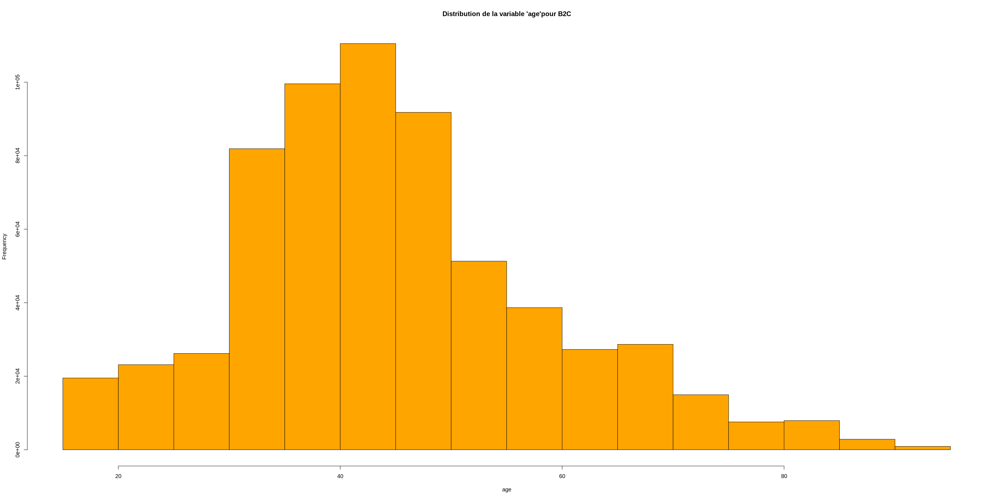

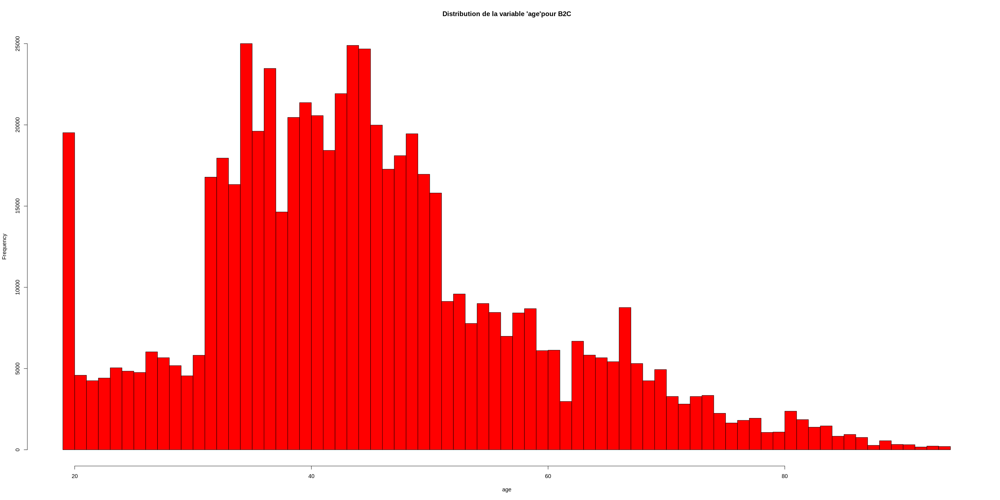

In [231]:
h = hist(Transactions_Produits_Clients_B2C$age, main="Distribution de la variable 'age'pour B2C", col="orange", xlab="age")
n_breaks <- 0.1*sqrt(nrow(Transactions_Produits_Clients_B2C))
h = hist(Transactions_Produits_Clients_B2C$age, main="Distribution de la variable 'age'pour B2C", col="red", xlab="age",breaks = n_breaks)

*La majeure partie des clients se concentrent entre 31 et 52 ans.*

### Courbe de Lorenz des âges clients

In [ ]:
ages <- Transactions_Produits_Clients_B2C$age

lorenz_ages <- cumsum(sort(ages)) / sum(ages)

plot(seq(0, 1, length.out = length(lorenz_ages)), lorenz_ages, type = "s", col = "rosybrown", xlab = "Distribution des âges (%)", ylab = "Cumul des âges clients (%)", main = "Courbe de Lorenz des âges clients")
polygon(c(seq(0, 1, length.out = length(lorenz_ages)), 1), c(lorenz_ages, 1), col = "lightblue")
lines(c(0, 1), c(0, 1), col = "red", lwd = 2, lty = 1)
abline(v = 0.61, col = "blue", lty = 2, lwd = 1)
abline(h = 0.5, col = "blue", lty = 2, lwd = 1)
legend("bottomright", legend = c("Lorenz", "Distribution égalitaire", "Medial"), col = c("rosybrown", "red", "blue"), lty = c(1, 1, 2), lwd = c(1, 2, 1))

*On constate qu'environ 61% des âges clients représentent 50% du montant total des âges. C'est une égalité quasi parfaite, et nous pouvons le confirmer avec l'indice de Gini.*

In [ ]:
aire_ss_courbe_age <- sum(lorenz_ages[-length(lorenz_ages)]) / length(lorenz_ages)
S <- 0.5 - aire_ss_courbe_age
gini_age <- round(2*S, 2)
cat(paste("L'indice de Gini est égal à", gini_age))

Confirmation avec l'indice de Gini très proche de 0, les âges clients sont bien répartis, quasiment égalitaire dans notre contexte.

- #### CA_age

In [154]:
#CA_age_B2C
age_Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C %>% group_by(age,categ) %>%
                                        summarise(CA_age = sum(price)) %>%
                                        distinct(age, .keep_all = T)
age_Transactions_Produits_Clients_B2C <- age_Transactions_Produits_Clients_B2C %>% mutate(Per_CA_age = as.numeric(CA_age) * 100/ as.numeric(Total_chiffre_affaire_B2C))
age_Transactions_Produits_Clients_B2C <- age_Transactions_Produits_Clients_B2C[order(age_Transactions_Produits_Clients_B2C$Per_CA_age, decreasing = TRUE),]
summary(age_Transactions_Produits_Clients_B2C$CA_age)
dim(age_Transactions_Produits_Clients_B2C)
head(age_Transactions_Produits_Clients_B2C)

`summarise()` has grouped output by 'age'. You can override using the `.groups`
argument.


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
   716.8   9846.6  21456.7  54229.7 118359.7 203458.5 

[1] 76  4

age,categ,CA_age,Per_CA_age
<int>,<int>,<dbl>,<dbl>
35,0,203458.5,1.853843
45,0,200911.2,1.830634
44,0,199135.3,1.814453
37,0,191157.5,1.741761
43,0,178092.3,1.622716
40,0,173360.2,1.579599


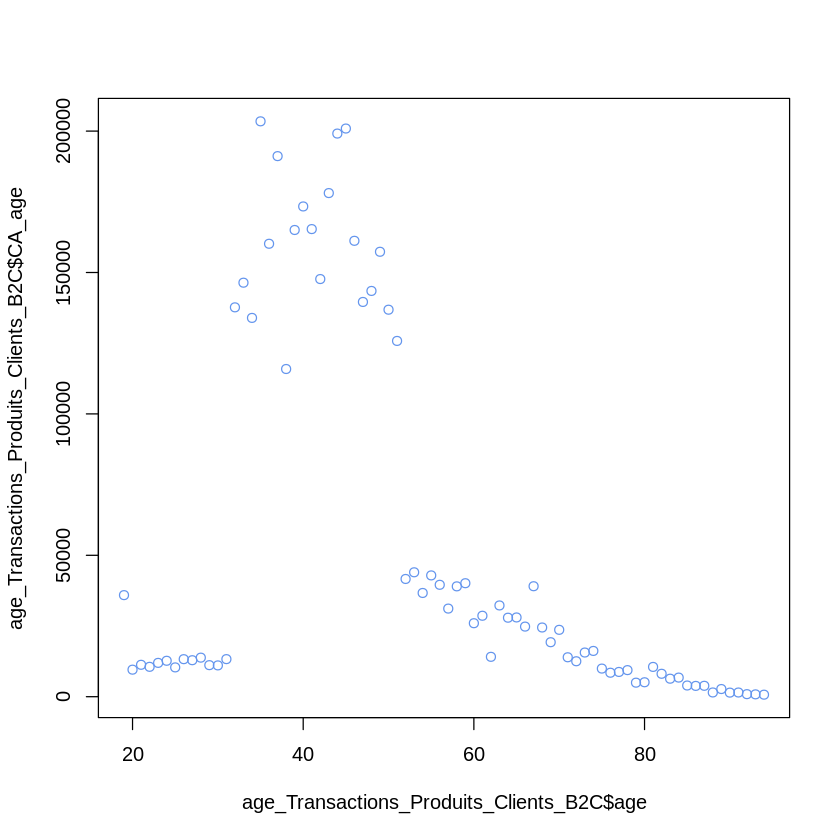

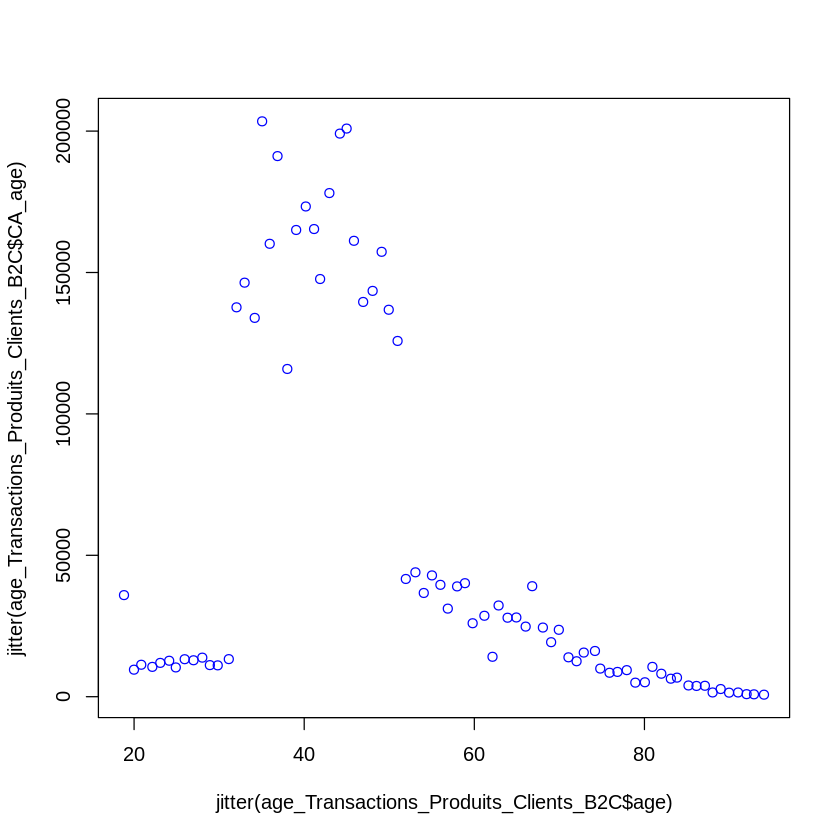

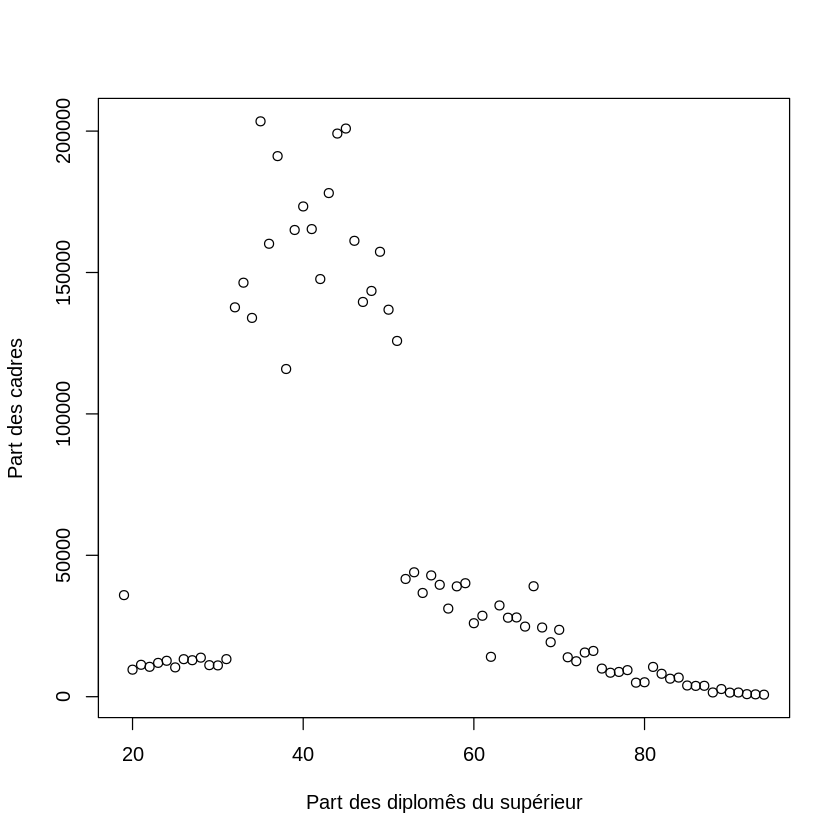

In [155]:
#_B2C
plot(age_Transactions_Produits_Clients_B2C$age,age_Transactions_Produits_Clients_B2C$CA_age, col="cornflowerblue")

plot(jitter(age_Transactions_Produits_Clients_B2C$age),jitter(age_Transactions_Produits_Clients_B2C$CA_age), col="blue")

plot(age_Transactions_Produits_Clients_B2C$age, age_Transactions_Produits_Clients_B2C$CA_age, ylab = "Part des cadres", xlab = "Part des diplomês du supérieur")

In [ ]:
library(ggplot2)
ggplot(age_Transactions_Produits_Clients_B2C, aes(x = age, y = chiffre_affaires, color = categ)) + geom_point()

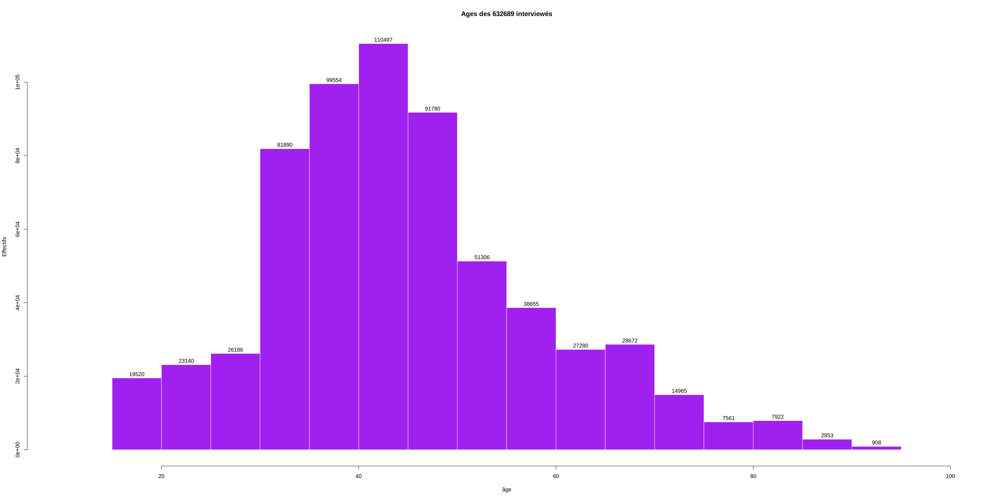

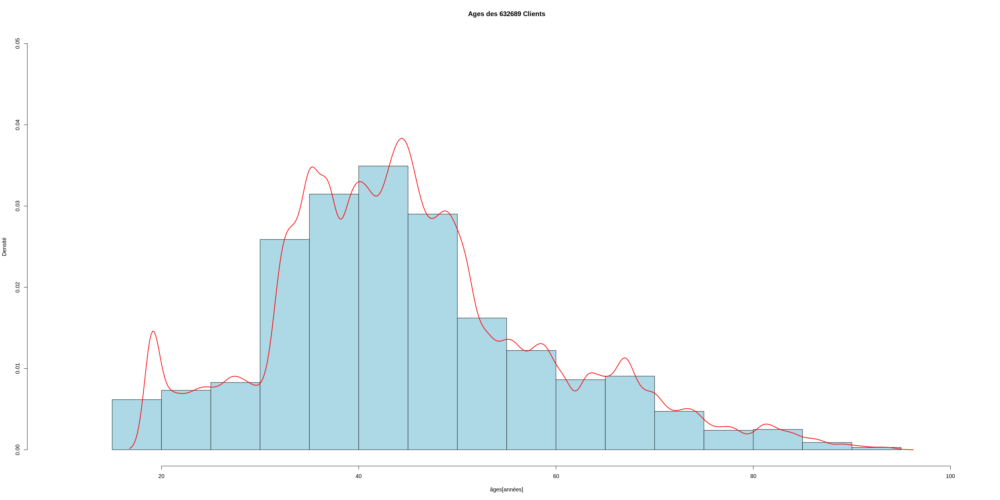

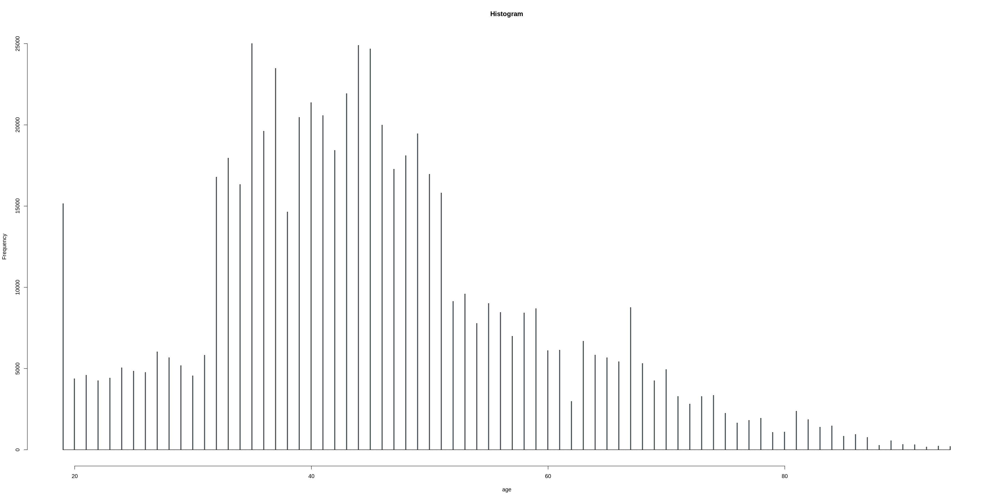

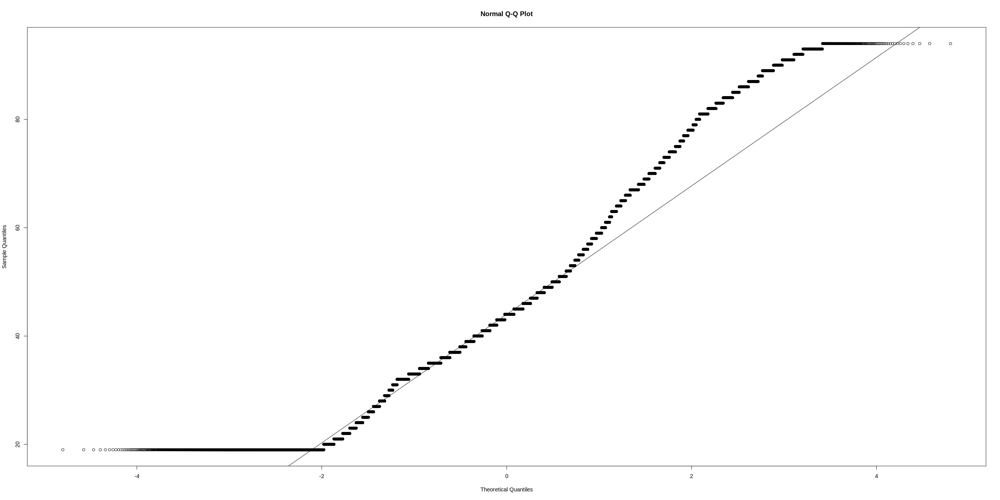

In [232]:
hist(Transactions_Produits_Clients_B2C$age, col = "purple", border = "white",
         main = paste("Ages des", nrow(Transactions_Produits_Clients_B2C), "interviewés"),
         xlab = "âge", ylab = "Effectifs", 
         #ylim = c(0, ),
         xlim = c(10,100),
         labels = TRUE)

hist(Transactions_Produits_Clients_B2C$age,
         col = "lightblue",
         main = paste("Ages des", nrow(Transactions_Produits_Clients_B2C), "Clients") ,
         xlab = "âges[années]", ylab = "Densité",
         ylim = c(0,0.05),
         xlim = c(10,100),
         proba = TRUE)
    lines(density(Transactions_Produits_Clients_B2C$age, na.rm = TRUE), lwd = 2, col = "red" )

n_breaks <- 2*sqrt(nrow(Transactions_Produits_Clients_B2C))
h = hist(Transactions_Produits_Clients_B2C$age, main="Histogram", col="lightblue", xlab="age",breaks = n_breaks)

qqnorm(Transactions_Produits_Clients_B2C$age) ; qqline(Transactions_Produits_Clients_B2C$age)

In [ ]:
boxplot(Transactions_Produits_Clients_B2C$age ~ Transactions_Produits_Clients_B2C$categ,
col = "purple", border = "black",
main = "Clients_B2C en fonction de l'âge",
ylab = "âges[années]"
)

In [ ]:
boxplot(Transactions_Produits_Clients_B2C$age ~ Transactions_Produits_Clients_B2C$categ,
col = "purple", border = "black", colors_for_categ,
main = "Clients_B2C en fonction de l'âge",
ylab = "âges[années]")

In [ ]:
names(B2C)

In [ ]:
fun_graph1(B2C_19_31,
           aes(x=mois, y=CA, fill=categ),
           "Mois", "Chiffre d'affaires","Catégories B2C par mois age_19_31",
           colors_for_categ)

## Analyse sectorielle de l'activité : variable '*categ*'
### Pie Chart pour représenter la part de chacune des catégories de vente

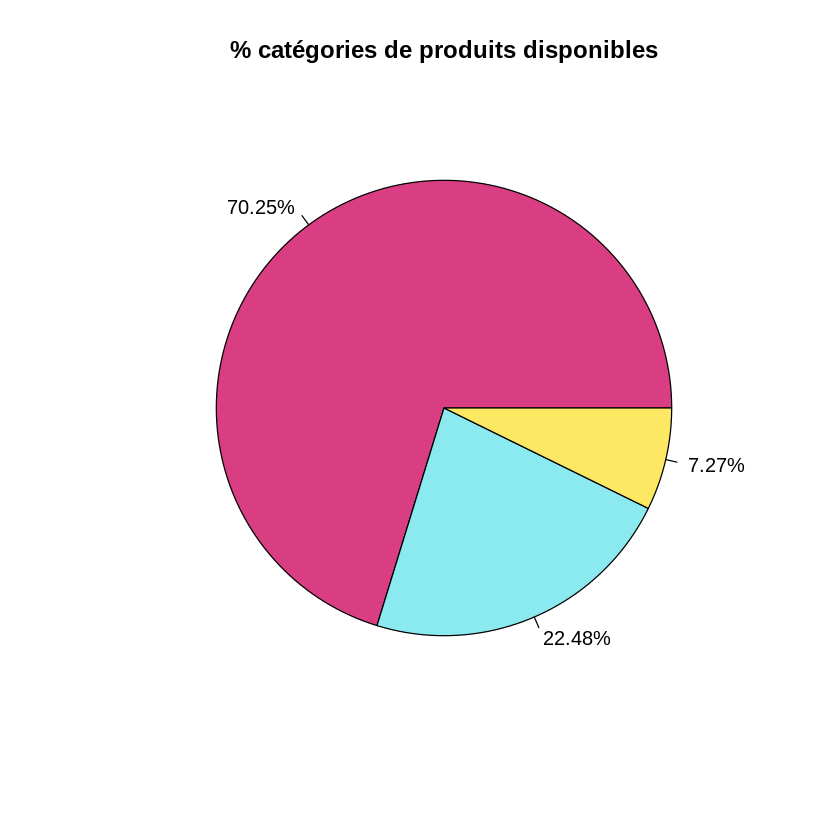

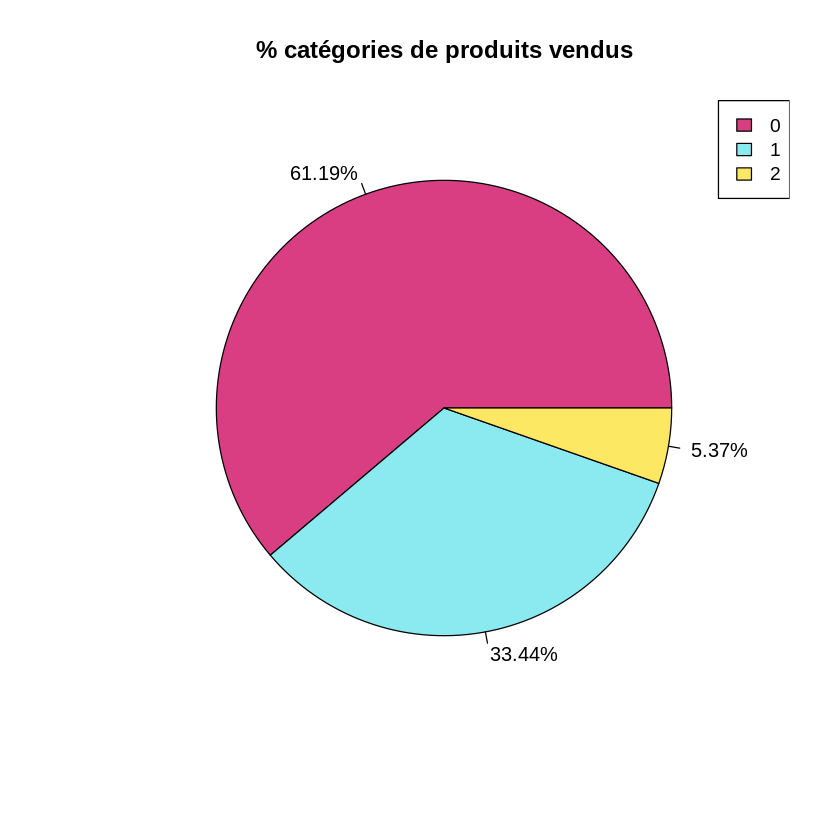

In [22]:
# Calculer le nombre total de Produits
total_Produits <- nrow(Produits)

# Calculer le nombre de Produits de chaque categ
categ_counts <- Produits[, .N, categ]
# categ_counts
# Calculer le pourcentage de chaque categ
categ_percentages <- categ_counts[, .(Percentage = N / total_Produits * 100), by = categ]
# categ_percentages
x <- categ_percentages$Percentage
labels <- categ_percentages$Percentage
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% catégories de produits disponibles", col = colors_for_categ)
# legend( "topright",c("0","1","2"), cex = 0.96,
#    fill = colors_for_categ)

# Calculer le nombre total de Produits
total_Produits <- nrow(Transactions_Produits_Clients)

# Calculer le nombre de Produits de chaque categ
categ_counts <- Transactions_Produits_Clients[, .N, categ]
# categ_counts
# Calculer le pourcentage de chaque categ
categ_percentages <- categ_counts[, .(Percentage = N / total_Produits * 100), by = categ]
# categ_percentages
x <- categ_percentages$Percentage
labels <- categ_percentages$Percentage
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "% catégories de produits vendus", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
   fill = colors_for_categ)

### Analyse des produits disponibles par catégorie

### Comparaison de distribution des prix produits par catégorie avec un boxplot
#### Le prix de produites par Catégorie

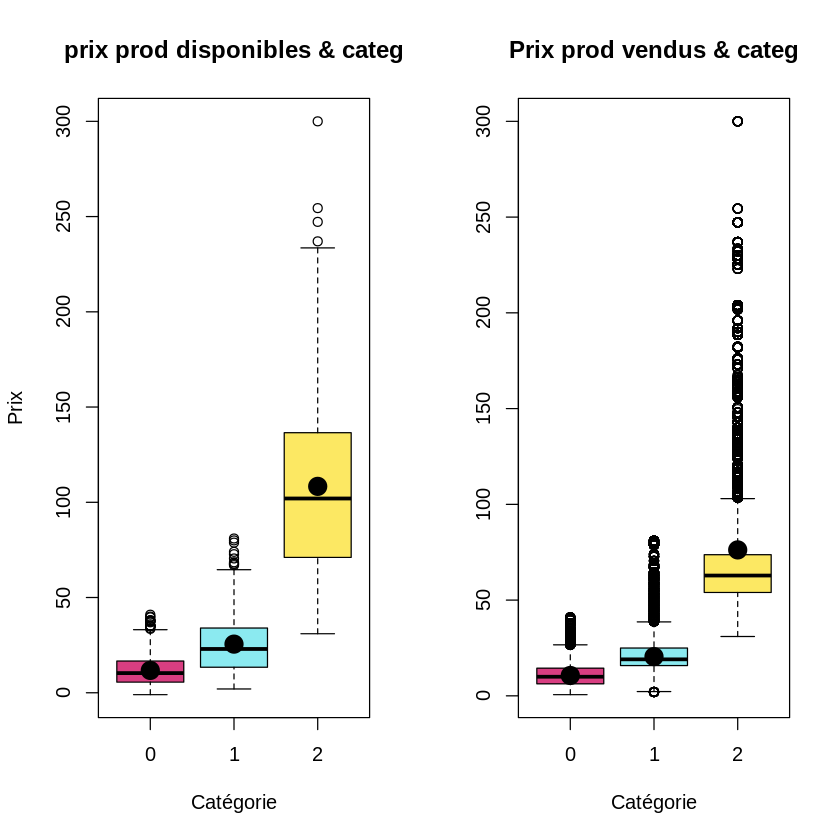

In [23]:
# Créer une fenêtre graphique
par(mfrow = c(1, 2))

# Boxplot 1
boxplot(Produits$price ~ Produits$categ,
        col = colors_for_categ,
        main = "prix prod disponibles & categ",
        ylab = "Prix",
        xlab = "Catégorie")
# Calculer la valeur moyenne par groupe
means_price <- tapply(Produits$price, Produits$categ, mean)
# Ajouter les moyennes sous forme de cercles à chaque boxplot
points(means_price, pch = 20, cex = 3)

# Boxplot 2
boxplot(Transactions_Produits_Clients$price ~ Transactions_Produits_Clients$categ,
        col = colors_for_categ,
        main = "Prix prod vendus & categ",
        ylab = "",
        xlab = "Catégorie") 
# Calculer la valeur moyenne par groupe
means_price <- tapply(Transactions_Produits_Clients$price, Transactions_Produits_Clients$categ, mean)
# Ajouter les moyennes sous forme de cercles à chaque boxplot
points(means_price, pch = 20, cex = 3)



*La distribution des prix au sein de chacune des catégories n'est pas symétrique puisqu'elle ne présente pas la même forme de part et d’autre du centre de la distribution. Nous avons presque une égalité entre la Moyenne et la Médiane, mais le Mode est à chaque fois plus éloigné.*

*Les 3 catégories n'ont pas les mêmes types (ou gamme)de produits. La catégorie 2 par exemple a un prix moyen proche des 60€ avec des outliers en queue de distribution jusqu'à 300€.*

## Analyse des prix pratiqués : variable '*price*'
###  Mesures de tendance centrale et dispersion des prix produits *(toutes catégories confondues)*

In [132]:
# #Calcul de la Moyenne des prix produits vendus
# Mean_Prix <- (round((mean(Transactions_Produits_Clients$price)),2)) 
# print(paste("Le prix moyen des produits vendus :", 
#             Mean_Prix,"€")) # 17.45 €
# #Calcul de la Mediane des prix produits vendus
# Med_Prix <- (median(Transactions_Produits_Clients$price)) 
# print(paste("Le prix median des produits vendus :", 
#             Med_Prix,"€")) # 13.99 €
# #Calcul de l'écart type des prix produits vendus 
# Ecart_Prix <- (round((sd(Transactions_Produits_Clients$price)),2)) 
# print(paste("L'écart type de prix des produits vendus :", 
#             Ecart_Prix,"€")) # 1890.94 €
categ_0 <- Produits[categ == 0 ,]
categ_1 <- Produits[categ == 1 ,]
categ_2 <- Produits[categ == 2 ,]
print(paste("Le nombre total des produits présents en catégorie 0 est :", 
            nrow(categ_0), ""))
print(paste("Le nombre total des produits présents en catégorie 1 est :", 
            nrow(categ_1), ""))
print(paste("Le nombre total des produits présents en catégorie 2 est :", 
            nrow(categ_2), ""))
#Calcul de la Mean des prix produits vendus
Mean_Prix_0 <- (round((mean(categ_0$price)),2)) 
print(paste("Le prix moyen des produits de la catégorie 0 :", 
            Mean_Prix_0,"€")) # 17.45 €
Mean_Prix_1 <- (round((mean(categ_1$price)),2)) 
print(paste("Le prix moyen des produits de la catégorie 1 :", 
            Mean_Prix_1,"€")) # 17.45 €
Mean_Prix_2 <- (round((mean(categ_2$price)),2)) 
print(paste("Le prix moyen des produits de la catégorie 2 :", 
            Mean_Prix_2,"€")) # 27.45 €

#Calcul de la Mediane des prix produits vendus
Med_Prix_0 <- (median(categ_0$price)) 
print(paste("Le prix median des produits vendus de la catégorie 0:", 
            Med_Prix_0,"€")) # 13.99 €
Med_Prix_1 <- (median(categ_1$price)) 
print(paste("Le prix median des produits vendus de la catégorie 1:", 
            Med_Prix_1,"€")) # 13.99 €
Med_Prix_2 <- (median(categ_2$price)) 
print(paste("Le prix median des produits vendus de la catégorie 2:", 
            Med_Prix_2,"€")) # 23.99 €

#Calcul de l'écart type des prix produits vendus 
Ecart_Prix_0 <- (round((sd(categ_0$price)),2)) 
print(paste("L'écart type de prix des produits vendus de la catégorie 0:", 
            Ecart_Prix_0,"€")) # 1890.94  
Ecart_Prix_1 <- (round((sd(categ_1$price)),2)) 
print(paste("L'écart type de prix des produits vendus de la catégorie 1:", 
            Ecart_Prix_1,"€")) # 1891.94 € 
Ecart_Prix_2 <- (round((sd(categ_2$price)),2)) 
print(paste("L'écart type de prix des produits vendus de la catégorie 2:", 
            Ecart_Prix_2,"€")) # 2892.94 €

[1] "Le nombre total des produits présents en catégorie 0 est : 2309 "
[1] "Le nombre total des produits présents en catégorie 1 est : 739 "
[1] "Le nombre total des produits présents en catégorie 2 est : 239 "
[1] "Le prix moyen des produits de la catégorie 0 : 11.73 €"
[1] "Le prix moyen des produits de la catégorie 1 : 25.53 €"
[1] "Le prix moyen des produits de la catégorie 2 : 108.35 €"
[1] "Le prix median des produits vendus de la catégorie 0: 10.32 €"
[1] "Le prix median des produits vendus de la catégorie 1: 22.99 €"
[1] "Le prix median des produits vendus de la catégorie 2: 101.99 €"
[1] "L'écart type de prix des produits vendus de la catégorie 0: 7.57 €"
[1] "L'écart type de prix des produits vendus de la catégorie 1: 15.43 €"
[1] "L'écart type de prix des produits vendus de la catégorie 2: 49.56 €"


## Distribution des prix produits

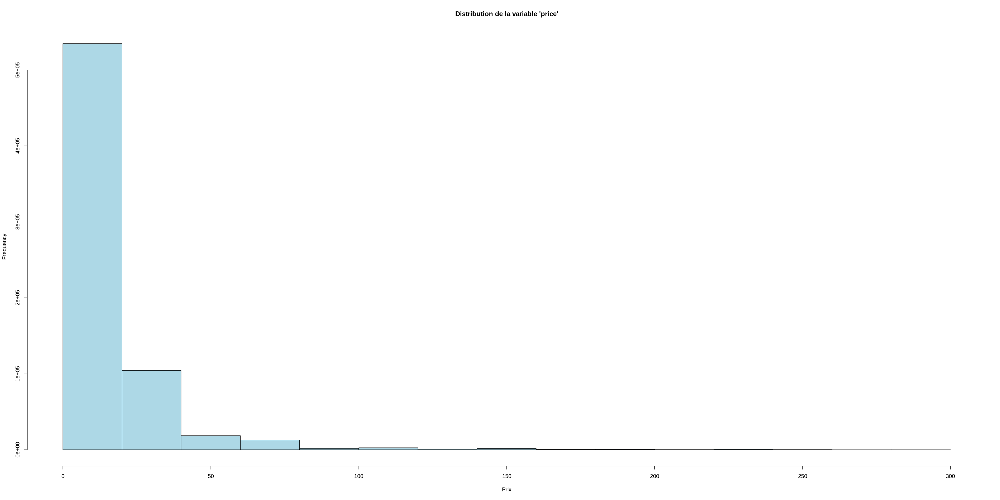

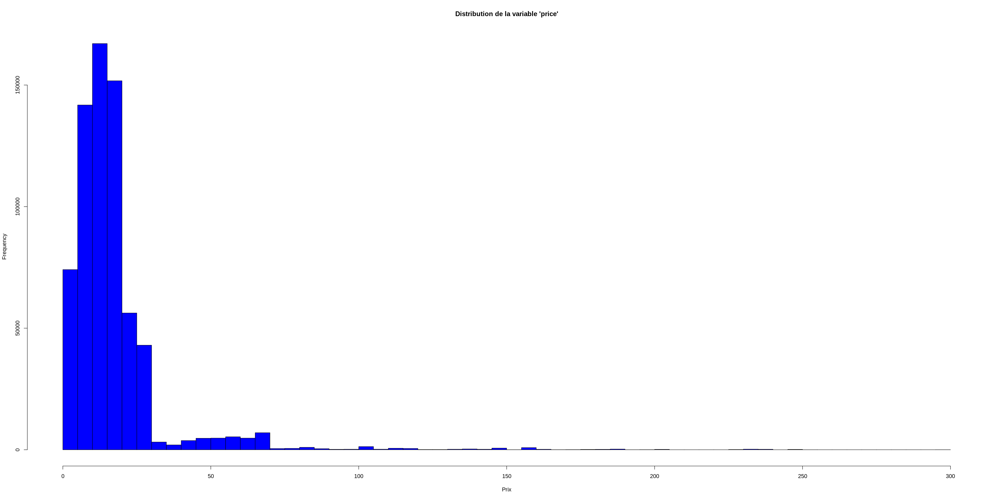

In [133]:
h = hist(Transactions_Produits_Clients$price, main="Distribution de la variable 'price'", col="lightblue", xlab="Prix")
n_breaks <- 0.1*sqrt(nrow(Transactions_Produits_Clients))
h = hist(Transactions_Produits_Clients$price, main="Distribution de la variable 'price'", col="blue", xlab="Prix",breaks = n_breaks)

#### L'âge de Clients B2C en fonction des Catégorie

#### Top 10 produit par client

In [49]:
# CA_Client, frequence_achat & Taile_panier
# CA_Client
tot_achats <- Transactions_Produits_Clients %>%
  group_by(id_prod,categ) %>%
  summarise(CA_prod = sum(price))
head(tot_achats)

#Calcul du frequence_achat
nombre_sessions_par_prod <- Transactions_Produits_Clients %>%
  group_by(id_prod) %>%
  summarise(nbr_vente_tot = n_distinct(session_id))
head(nombre_sessions_par_prod,3)

# Taile_panier_moyenne : Jointure pour Calcul de la frequence_achat_Taile_panier
frequence_achat_Taile_panier <- merge(tot_achats,nombre_sessions_par_prod,by="id_prod",all = T)
# frequence_achat_Taile_panier <- frequence_achat_Taile_panier %>% mutate(Per_CA_prod = as.numeric(CA_prod) * 100/ as.numeric(Total_chiffre_affaire))
# frequence_achat_Taile_panier <- frequence_achat_Taile_panier %>% mutate(Taile_panier_moyenne =CA_prod/nbr_vente_tot)

top_prod_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$nbr_vente_tot, 
                                                                   decreasing = TRUE),]
top_prod_frequence_achat_Taile_panier <- setDT(top_prod_frequence_achat_Taile_panier)
dim(top_prod_frequence_achat_Taile_panier) #679553 X  6
head(top_prod_frequence_achat_Taile_panier,10)

Down_prod_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$nbr_vente_tot),]
Down_prod_frequence_achat_Taile_panier <- setDT(Down_prod_frequence_achat_Taile_panier)
dim(Down_prod_frequence_achat_Taile_panier) #679553 X  6
head(Down_prod_frequence_achat_Taile_panier,10)

top_CA_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_prod, 
                                                                   decreasing = TRUE),]
top_CA_frequence_achat_Taile_panier <- setDT(top_CA_frequence_achat_Taile_panier)
dim(top_CA_frequence_achat_Taile_panier) #679553 X  6
head(top_CA_frequence_achat_Taile_panier,10)

Down_CA_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_prod),]
Down_CA_frequence_achat_Taile_panier <- setDT(Down_CA_frequence_achat_Taile_panier)
dim(Down_CA_frequence_achat_Taile_panier) #679553 X  6
head(Down_CA_frequence_achat_Taile_panier,10)

# #B2B
# frequence_achat_Taile_panier_B2B <- frequence_achat_Taile_panier[client_id == "c_1609"| 
#                                                                  client_id == "c_4958"|
#                                                                  client_id == "c_6714"|
#                                                                  client_id == "c_3454",]
# frequence_achat_Taile_panier_B2B <- frequence_achat_Taile_panier_B2B[,-c("sex","age","sex_numeric")]
# frequence_achat_Taile_panier_B2B <- setDT(frequence_achat_Taile_panier_B2B)
# dim(frequence_achat_Taile_panier_B2B)
# frequence_achat_Taile_panier_B2B

# # B2C
# frequence_achat_Taile_panier_B2C <- frequence_achat_Taile_panier[client_id != "c_1609" 
#                                                                   & client_id !="c_4958" 
#                                                                   & client_id !="c_6714" 
#                                                                   & client_id !="c_3454",]
# frequence_achat_Taile_panier_B2C <- setDT(frequence_achat_Taile_panier_B2C)

# dim(frequence_achat_Taile_panier)
# dim(frequence_achat_Taile_panier_B2B)
# dim(frequence_achat_Taile_panier_B2C)
# head(frequence_achat_Taile_panier_B2C)

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


id_prod,categ,CA_prod
<chr>,<int>,<dbl>
0_0,0,4657.50
0_1,0,5352.13
0_10,0,394.90
0_100,0,61.80
0_1000,0,2954.88
0_1001,0,2020.95


id_prod,nbr_vente_tot
<chr>,<int>
0_0,1238
0_1,487
0_10,22


[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
1_369,1,54025.48,2245
1_417,1,45947.11,2183
1_414,1,51949.40,2178
1_498,1,49731.36,2122
1_425,1,35611.04,2095
1_403,1,35260.40,1956
1_412,1,32484.15,1950
1_413,1,34990.55,1942
1_407,1,30940.65,1933


[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
0_1151,0,2.99,1
0_1284,0,1.38,1
0_1379,0,2.99,1
0_1498,0,2.48,1
0_1539,0,0.99,1
0_1601,0,1.99,1
0_1633,0,24.99,1
0_1683,0,2.99,1
0_1728,0,2.27,1


[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
2_159,2,94893.50,649
2_135,2,69334.95,994
2_112,2,65407.76,960
2_102,2,60736.78,1025
2_209,2,56971.86,814
1_395,1,54356.25,1873
1_369,1,54025.48,2245
2_110,2,53846.25,865
2_39,2,53060.85,915


[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
0_1539,0,0.99,1
0_1284,0,1.38,1
0_1653,0,1.98,2
0_1601,0,1.99,1
0_541,0,1.99,1
0_807,0,1.99,1
0_1728,0,2.27,1
0_1498,0,2.48,1
0_898,0,2.54,2


In [50]:
top_prod_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$nbr_vente_tot, 
                                                                   decreasing = TRUE),]
top_prod_frequence_achat_Taile_panier <- setDT(top_prod_frequence_achat_Taile_panier)
dim(top_prod_frequence_achat_Taile_panier) #679553 X  6
head(top_prod_frequence_achat_Taile_panier,10)

[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
1_369,1,54025.48,2245
1_417,1,45947.11,2183
1_414,1,51949.40,2178
1_498,1,49731.36,2122
1_425,1,35611.04,2095
1_403,1,35260.40,1956
1_412,1,32484.15,1950
1_413,1,34990.55,1942
1_407,1,30940.65,1933


In [51]:
Down_prod_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$nbr_vente_tot),]


Down_prod_frequence_achat_Taile_panier <- setDT(Down_prod_frequence_achat_Taile_panier)
dim(Down_prod_frequence_achat_Taile_panier) #679553 X  6
head(Down_prod_frequence_achat_Taile_panier,10)

[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
0_1151,0,2.99,1
0_1284,0,1.38,1
0_1379,0,2.99,1
0_1498,0,2.48,1
0_1539,0,0.99,1
0_1601,0,1.99,1
0_1633,0,24.99,1
0_1683,0,2.99,1
0_1728,0,2.27,1


In [52]:
top_CA_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_prod, 
                                                                   decreasing = TRUE),]
top_CA_frequence_achat_Taile_panier <- setDT(top_CA_frequence_achat_Taile_panier)
dim(top_CA_frequence_achat_Taile_panier) #679553 X  6
head(top_CA_frequence_achat_Taile_panier,10)

[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
2_159,2,94893.50,649
2_135,2,69334.95,994
2_112,2,65407.76,960
2_102,2,60736.78,1025
2_209,2,56971.86,814
1_395,1,54356.25,1873
1_369,1,54025.48,2245
2_110,2,53846.25,865
2_39,2,53060.85,915


In [53]:
Down_CA_frequence_achat_Taile_panier <- frequence_achat_Taile_panier[order(frequence_achat_Taile_panier$CA_prod),]
Down_CA_frequence_achat_Taile_panier <- setDT(Down_CA_frequence_achat_Taile_panier)
dim(Down_CA_frequence_achat_Taile_panier) #679553 X  6
head(Down_CA_frequence_achat_Taile_panier,10)

[1] 3266    4

id_prod,categ,CA_prod,nbr_vente_tot
<chr>,<int>,<dbl>,<int>
0_1539,0,0.99,1
0_1284,0,1.38,1
0_1653,0,1.98,2
0_1601,0,1.99,1
0_541,0,1.99,1
0_807,0,1.99,1
0_1728,0,2.27,1
0_1498,0,2.48,1
0_898,0,2.54,2


In [54]:
B2B_prod_top_10 <- Transactions_Produits_Clients_B2B %>% group_by(id_prod,categ) %>%
  summarise(CA = sum(price))
B2B_prod_top_10 <- B2B_prod_top_10 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2B))
B2B_prod_top_10 <- B2B_prod_top_10[order(B2B_prod_top_10$Per_CA, decreasing = TRUE),]
dim(B2B_prod_top_10)
head(B2B_prod_top_10,10)

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 2354    4

id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
2_112,2,6621.86,0.7515222
2_209,2,6229.11,0.7069486
2_110,2,5976.00,0.6782229
2_135,2,5864.15,0.6655289
2_39,2,5567.04,0.6318095
2_37,2,5339.91,0.6060323
2_102,2,5086.04,0.5772203
2_208,2,4883.43,0.5542259
2_109,2,4859.10,0.5514647


In [55]:
fun_top_10 <- function(str_client_id, float_total_ca_client){
    c_top_10 <- Transactions_Produits_Clients_B2B[client_id == str_client_id,] %>% group_by(id_prod,categ) %>%
                                            summarise(CA = sum(price)) 
    c_top_10 <- c_top_10 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(float_total_ca_client))
    c_top_10 <- c_top_10[order(c_top_10$Per_CA, decreasing = TRUE),]
    print(dim(c_top_10))
    head(c_top_10,10)
}

In [56]:
# c_1609
fun_top_10("c_1609", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_1609))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1920    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
1_383,1,1710.41,0.5278500
2_159,2,1459.90,0.4505400
1_395,1,1420.51,0.4383839
1_369,1,1415.41,0.4368100
0_1334,0,1383.72,0.4270301
0_1470,0,1367.10,0.4219010
1_498,1,1191.87,0.3678233
1_406,1,1166.07,0.3598611
1_277,1,1143.56,0.3529143


In [57]:
#c_4958
fun_top_10("c_4958", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_4958))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 467   4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
2_209,2,5879.16,2.028973
2_112,2,5608.31,1.935500
2_110,2,5540.25,1.912011
2_39,2,5451.06,1.881231
2_135,2,5450.21,1.880937
2_167,2,4739.80,1.635766
2_109,2,4589.15,1.583774
2_37,2,4556.07,1.572358
2_102,2,4553.78,1.571568


In [58]:
#c_6714
fun_top_10("c_6714", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_6714))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1381    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
2_159,2,1605.89,1.0450744
2_0,2,1296.24,0.8435616
1_383,1,1130.61,0.7357736
1_498,1,1121.76,0.7300143
1_389,1,924.63,0.6017268
1_406,1,917.97,0.5973927
1_414,1,881.71,0.5737955
2_208,2,877.92,0.5713291
1_432,1,847.00,0.5512071


In [59]:
# c_3454
fun_top_10("c_3454", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_3454))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1094    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
1_395,1,1478.49,1.3006880
1_403,1,1097.39,0.9654188
1_414,1,1096.18,0.9643543
1_267,1,1091.61,0.9603339
1_369,1,1079.55,0.9497242
1_385,1,1065.59,0.9374430
1_498,1,888.06,0.7812626
1_366,1,799.12,0.7030185
1_417,1,755.64,0.6647673


#### Down 10 produit par client

In [60]:
B2B_prod_down_10 <- B2B_prod_top_10[order(B2B_prod_top_10$Per_CA),]
dim(B2B_prod_down_10)
head(B2B_prod_down_10,10)

[1] 2354    4

id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
0_528,0,0.62,7.036449e-05
0_1935,0,0.99,1.123562e-04
0_1010,0,1.96,2.224426e-04
0_118,0,1.98,2.247124e-04
0_1191,0,1.98,2.247124e-04
0_1871,0,1.99,2.258473e-04
0_587,0,1.99,2.258473e-04
0_2288,0,2.06,2.337917e-04
0_32,0,2.14,2.428710e-04


In [61]:
fun_down_10 <- function(str_client_id, float_total_ca_client){
    c_down_10 <- Transactions_Produits_Clients_B2B[client_id == str_client_id,] %>% group_by(id_prod,categ) %>%
                                            summarise(CA = sum(price)) 
                                           # %>% distinct(id_prod, .keep_all = T)
    c_down_10 <- c_down_10 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(float_total_ca_client))
    c_down_10 <- c_down_10[order(c_down_10$Per_CA),]
    print(dim(c_down_10))
    head(c_down_10,10)
}

In [62]:
# c_1609
fun_down_10("c_1609", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_1609))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1920    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
0_528,0,0.62,0.0001913383
0_1935,0,0.99,0.0003055241
0_1010,0,1.96,0.0006048760
0_118,0,1.98,0.0006110482
0_1191,0,1.98,0.0006110482
0_2275,0,1.98,0.0006110482
0_1871,0,1.99,0.0006141343
0_2288,0,2.06,0.0006357370
0_32,0,2.14,0.0006604258


In [63]:
# c_4958
fun_down_10("c_4958", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_4958))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 467   4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
0_525,0,2.99,0.001031887
1_518,1,6.52,0.002250135
0_2039,0,6.99,0.002412338
1_575,1,6.99,0.002412338
1_460,1,7.53,0.002598699
1_658,1,7.72,0.002664271
1_78,1,7.88,0.002719489
1_726,1,10.79,0.003723767
1_662,1,12.08,0.004168963


In [64]:
# c_6714
fun_down_10("c_6714", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_6714))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1381    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
0_276,0,1.81,0.001177904
0_587,0,1.99,0.001295044
0_1496,0,2.42,0.001574877
0_1327,0,2.99,0.001945820
0_477,0,2.99,0.001945820
0_2218,0,3.27,0.002128037
0_1294,0,3.28,0.002134545
0_1504,0,3.36,0.002186607
0_562,0,3.64,0.002368824


In [65]:
# c_3454
fun_down_10("c_3454", fun_ca_prop1(Transactions_Produits_Clients_B2B_c_3454))

`summarise()` has grouped output by 'id_prod'. You can override using the
`.groups` argument.


[1] 1094    4


id_prod,categ,CA,Per_CA
<chr>,<int>,<dbl>,<dbl>
0_2275,0,0.99,0.0008709434
0_186,0,2.00,0.0017594816
1_58,1,2.95,0.0025952354
0_1726,0,3.14,0.0027623861
0_282,0,3.14,0.0027623861
0_1218,0,3.32,0.0029207394
0_1174,0,3.52,0.0030966876
0_1228,0,3.55,0.0031230798
0_1052,0,3.79,0.0033342176


- #### CA_categ

In [135]:
#CA_categ_B2B
categ_Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients_B2B %>% group_by(categ_character) %>%
                                        summarise(CA_categ = sum(price)) %>%
                                        distinct(categ_character, .keep_all = T)
categ_Transactions_Produits_Clients_B2B <- categ_Transactions_Produits_Clients_B2B %>% mutate(Per_CA_categ = as.numeric(CA_categ) * 100/ as.numeric(Total_chiffre_affaire_B2B))
categ_Transactions_Produits_Clients_B2B <- categ_Transactions_Produits_Clients_B2B[order(categ_Transactions_Produits_Clients_B2B$Per_CA_categ, decreasing = TRUE),]
summary(categ_Transactions_Produits_Clients_B2B$CA_categ)
dim(categ_Transactions_Produits_Clients_B2B)
categ_Transactions_Produits_Clients_B2B

ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `Per_CA_categ = as.numeric(CA_categ) *
  100/as.numeric(Total_chiffre_affaire_B2B)`.
[1mCaused by error:[22m
[33m![39m object 'Total_chiffre_affaire_B2B' not found


- #### CA_panier

In [66]:
#CA_panier_B2B
panier_Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients_B2B %>% group_by(session_id) %>%
                                        summarise(CA_panier = sum(price)) %>%
                                        distinct(session_id, .keep_all = T)
panier_Transactions_Produits_Clients_B2B <- panier_Transactions_Produits_Clients_B2B %>% mutate(Per_CA_panier = as.numeric(CA_panier) * 100/ as.numeric(Total_chiffre_affaire_B2B))
panier_Transactions_Produits_Clients_B2B <- panier_Transactions_Produits_Clients_B2B[order(panier_Transactions_Produits_Clients_B2B$Per_CA_panier, decreasing = TRUE),]
summary(panier_Transactions_Produits_Clients_B2B$CA_panier)
dim(panier_Transactions_Produits_Clients_B2B)
head(panier_Transactions_Produits_Clients_B2B)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.99   16.60   27.47   38.24   46.99  473.98 

[1] 23041     3

session_id,CA_panier,Per_CA_panier
<chr>,<dbl>,<dbl>
s_165683,473.98,0.05379252
s_209005,473.98,0.05379252
s_268563,473.98,0.05379252
s_59203,458.42,0.05202659
s_306462,432.27,0.04905880
s_336295,432.27,0.04905880


- #### CA_Produits

In [67]:
#CA_Produits_B2B
prod_Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients_B2B %>% group_by(id_prod) %>%
                                        summarise(CA_prod = sum(price)) %>%
                                        distinct(id_prod, .keep_all = T)
prod_Transactions_Produits_Clients_B2B <- prod_Transactions_Produits_Clients_B2B %>% mutate(Per_CA_prod = as.numeric(CA_prod) * 100/ as.numeric(Total_chiffre_affaire_B2B))
prod_Transactions_Produits_Clients_B2B <- prod_Transactions_Produits_Clients_B2B[order(prod_Transactions_Produits_Clients_B2B$Per_CA_prod, decreasing = TRUE),]
summary(prod_Transactions_Produits_Clients_B2B$CA_prod)
dim(prod_Transactions_Produits_Clients_B2B)
head(prod_Transactions_Produits_Clients_B2B,10)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.62   39.95  118.88  374.31  370.29 6621.86 

[1] 2354    3

id_prod,CA_prod,Per_CA_prod
<chr>,<dbl>,<dbl>
2_112,6621.86,0.7515222
2_209,6229.11,0.7069486
2_110,5976.00,0.6782229
2_135,5864.15,0.6655289
2_39,5567.04,0.6318095
2_37,5339.91,0.6060323
2_102,5086.04,0.5772203
2_208,4883.43,0.5542259
2_109,4859.10,0.5514647


- #### CA_date

In [68]:
#_B2B
date_Transactions_Produits_Clients_B2B <- Transactions_Produits_Clients_B2B %>% group_by(date) %>%
                                        summarise(CA_date = sum(price)) %>%
                                        distinct(date, .keep_all = T)
date_Transactions_Produits_Clients_B2B <- date_Transactions_Produits_Clients_B2B %>% mutate(Per_CA_date = as.numeric(CA_date) * 100/ as.numeric(Total_chiffre_affaire_B2B))
date_Transactions_Produits_Clients_B2B <- date_Transactions_Produits_Clients_B2B[order(date_Transactions_Produits_Clients_B2B$Per_CA_date, decreasing = TRUE),]
summary(date_Transactions_Produits_Clients_B2B$CA_date)
dim(date_Transactions_Produits_Clients_B2B)
head(date_Transactions_Produits_Clients_B2B)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.62    8.99   13.99   18.89   19.53  300.00 

[1] 46643     3

date,CA_date,Per_CA_date
<dttm>,<dbl>,<dbl>
2021-03-26 04:33:19,300,0.03404733
2021-12-04 15:45:14,300,0.03404733
2021-12-07 06:52:26,300,0.03404733
2022-06-07 06:52:26,300,0.03404733
2022-08-07 06:52:26,300,0.03404733
2022-12-07 06:52:26,300,0.03404733


# B2C

- #### CA_Client

In [71]:
#CA_Client_B2C
client_Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C %>% group_by(client_id) %>%
                                        summarise(CA_client = sum(price)) %>%
                                        distinct(client_id, .keep_all = T)
client_Transactions_Produits_Clients_B2C <- client_Transactions_Produits_Clients_B2C %>% mutate(Per_CA_client = as.numeric(CA_client) * 100/ as.numeric(Total_chiffre_affaire_B2C))
client_Transactions_Produits_Clients_B2C <- client_Transactions_Produits_Clients_B2C[order(client_Transactions_Produits_Clients_B2C$Per_CA_client, decreasing = TRUE),]
summary(client_Transactions_Produits_Clients_B2C$CA_client)
dim(client_Transactions_Produits_Clients_B2C)
head(client_Transactions_Produits_Clients_B2C)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   6.31  547.63 1026.93 1276.75 1779.08 5276.87 

[1] 8596    3

client_id,CA_client,Per_CA_client
<chr>,<dbl>,<dbl>
c_3263,5276.870,0.04808102
c_1570,5271.620,0.04803319
c_2899,5214.050,0.04750863
c_2140,5208.820,0.04746098
c_7319,5155.770,0.04697760
c_8026,5093.218,0.04640765


- #### CA_sex

In [72]:
#CA_Sex
sex_Transactions_Produits_Clients <- Transactions_Produits_Clients %>% group_by(sex) %>%
                                        summarise(CA_sex = sum(price)) %>%
                                        distinct(sex, .keep_all = T)
sex_Transactions_Produits_Clients <- sex_Transactions_Produits_Clients %>% mutate(Per_CA_sex = as.numeric(CA_sex) * 100/ as.numeric(Total_chiffre_affaire))
sex_Transactions_Produits_Clients <- sex_Transactions_Produits_Clients[order(sex_Transactions_Produits_Clients$Per_CA_sex, decreasing = TRUE),]
summary(sex_Transactions_Produits_Clients$CA_sex)
dim(sex_Transactions_Produits_Clients)
head(sex_Transactions_Produits_Clients)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
5860928 5894484 5928040 5928040 5961596 5995152 

[1] 2 3

sex,CA_sex,Per_CA_sex
<chr>,<dbl>,<dbl>
m,5995152,50.56606
f,5860928,49.43394


- #### CA_birth

In [73]:
#CA_birth_B2C
birth_Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C %>% group_by(birth) %>%
                                        summarise(CA_birth = sum(price)) %>%
                                        distinct(birth, .keep_all = T)
birth_Transactions_Produits_Clients_B2C <- birth_Transactions_Produits_Clients_B2C %>% mutate(Per_CA_birth = as.numeric(CA_birth) * 100/ as.numeric(Total_chiffre_affaire_B2C))
birth_Transactions_Produits_Clients_B2C <- birth_Transactions_Produits_Clients_B2C[order(birth_Transactions_Produits_Clients_B2C$Per_CA_birth, decreasing = TRUE),]
summary(birth_Transactions_Produits_Clients_B2C$CA_birth)
dim(birth_Transactions_Produits_Clients_B2C)
head(birth_Transactions_Produits_Clients_B2C)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   2815   39057  143517  144407  224769  609014 

[1] 76  3

birth,CA_birth,Per_CA_birth
<int>,<dbl>,<dbl>
2004,609013.7,5.549123
1979,334427.3,3.047186
1988,330813.9,3.014263
1978,324682.3,2.958393
1986,309231.7,2.817613
1980,289623.8,2.638952


- #### CA_year

In [74]:
#CA_year_B2C
year_Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C %>% group_by(year) %>%
                                        summarise(CA_year = sum(price)) %>%
                                        distinct(year, .keep_all = T)
year_Transactions_Produits_Clients_B2C <- year_Transactions_Produits_Clients_B2C %>% mutate(Per_CA_year = as.numeric(CA_year) * 100/ as.numeric(Total_chiffre_affaire_B2C))
year_Transactions_Produits_Clients_B2C <- year_Transactions_Produits_Clients_B2C[order(year_Transactions_Produits_Clients_B2C$Per_CA_year, decreasing = TRUE),]
summary(year_Transactions_Produits_Clients_B2C$CA_year)
dim(year_Transactions_Produits_Clients_B2C)
year_Transactions_Produits_Clients_B2C

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 903119 2659155 4415190 3658318 5035917 5656644 

[1] 3 3

year,CA_year,Per_CA_year
<int>,<dbl>,<dbl>
2022,5656644.3,51.541397
2021,4415190.3,40.229695
2023,903118.9,8.228908


- #### CA_panier

In [78]:
#CA_panier_B2C
panier_Transactions_Produits_Clients <- Transactions_Produits_Clients %>% group_by(session_id) %>%
                                        summarise(CA_panier = sum(price)) %>%
                                        distinct(session_id, .keep_all = T)
panier_Transactions_Produits_Clients <- panier_Transactions_Produits_Clients %>% mutate(Per_CA_panier = as.numeric(CA_panier) * 100/ as.numeric(Total_chiffre_affaire))
panier_Transactions_Produits_Clients <- panier_Transactions_Produits_Clients[order(panier_Transactions_Produits_Clients$Per_CA_panier, decreasing = TRUE),]
summary(panier_Transactions_Produits_Clients$CA_panier)
dim(panier_Transactions_Produits_Clients)
head(panier_Transactions_Produits_Clients)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.62   15.56   25.79   34.63   43.17  568.88 

[1] 342315      3

session_id,CA_panier,Per_CA_panier
<chr>,<dbl>,<dbl>
s_95844,568.88,0.004798213
s_123227,539.23,0.004548131
s_335005,535.17,0.004513887
s_83158,535.17,0.004513887
s_150439,496.22,0.004185363
s_170478,476.19,0.004016420


- #### CA_Produits

In [79]:
#CA_Produits_B2C
prod_Transactions_Produits_Clients_B2C <- Transactions_Produits_Clients_B2C %>% group_by(id_prod) %>%
                                        summarise(CA_prod = sum(price)) %>%
                                        distinct(id_prod, .keep_all = T)
prod_Transactions_Produits_Clients_B2C <- prod_Transactions_Produits_Clients_B2C %>% mutate(Per_CA_prod = as.numeric(CA_prod) * 100/ as.numeric(Total_chiffre_affaire_B2C))
prod_Transactions_Produits_Clients_B2C <- prod_Transactions_Produits_Clients_B2C[order(prod_Transactions_Produits_Clients_B2C$Per_CA_prod, decreasing = TRUE),]
summary(prod_Transactions_Produits_Clients_B2C$CA_prod)
dim(prod_Transactions_Produits_Clients_B2C)
head(prod_Transactions_Produits_Clients_B2C)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
    0.99   215.79   748.25  3363.45  3189.28 91097.76 

[1] 3263    3

id_prod,CA_prod,Per_CA_prod
<chr>,<dbl>,<dbl>
2_159,91097.76,0.8300514
2_135,63470.80,0.5783241
2_112,58785.90,0.5356369
2_102,55650.74,0.5070704
1_369,50834.81,0.4631893
2_209,50742.75,0.4623505


### Age_19_31

In [ ]:
B2C_age_19_31 <-Transactions_Produits_Clients_B2C[age>="19" & age<="31",]
B2C_19_31 <- B2C_age_19_31 %>% group_by(categ_character,mois,sex,age,heure,jour) %>% summarise(CA=sum(price))

categ_19_31 <- B2C_age_19_31 %>% group_by(categ_character) %>% summarise(CA=sum(price))
Total_chiffre_affaire_19_31 <-fun_ca_prop1(B2C_age_19_31)
categ_19_31 <- categ_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))

fun_ca_prop("age_19_31", B2C_age_19_31, Total_chiffre_affaire_B2C)

x <- categ_19_31$Per_CA
labels <- categ_19_31$categ_character
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C age_19_31", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
        fill = colors_for_categ)

fun_graph2(B2C_19_31,
           aes(x=categ_character, y=CA, fill=sex),
           "Catégorie", "Chiffre d'affaires","Sex par catégorie age_19_31",
           colors_for_sex)
# lprop(table(B2C_age_19_31$categ, B2C_age_19_31$sex))


fun_graph3(B2C_19_31,
           aes(x=mois, y=CA, fill=sex),
           "Mois", "Chiffre d'affaires","Sex par mois age_19_31",
           colors_for_sex)
# lprop(table(B2C_age_19_31$mois, B2C_age_19_31$sex))

fun_graph3(B2C_19_31,
         aes(x=age, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Sex B2C par age_19_31",
         colors_for_sex)
# lprop(table(B2C_age_19_31$age, B2C_age_19_31$sex))

fun_graph1(B2C_19_31,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégories B2C par mois age_19_31",
           colors_for_categ)
# lprop(table(B2C_age_19_31$mois, B2C_age_19_31$categ))

fun_graph1(B2C_19_31,
           aes(x=age, y=CA, fill=categ_character),
           "Age", "Chiffre d'affaires","Catégories B2C par age_19_31",
           colors_for_categ)
# lprop(table(B2C_age_19_31$age, B2C_age_19_31$categ))

fun_graph1(B2C_19_31,
           aes(x=jour, y=CA, fill=categ_character),
           "Jour", "Chiffre d'affaires","Catégories B2C par jour age_19_31",
           colors_for_categ)


# jour_19_31 <- B2C_age_19_31 %>% group_by(jour) %>% summarise(CA=sum(price))
# jour_19_31 <- jour_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# jour_19_31 <- jour_19_31[order(jour_19_31$Per_CA, decreasing = TRUE),]
# # dim(jour_19_31)
# # head(jour_19_31,10)

# heure_19_31 <- B2C_age_19_31 %>% group_by(heure) %>% summarise(CA=sum(price))
# heure_19_31 <- heure_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# heure_19_31 <- heure_19_31[order(heure_19_31$Per_CA, decreasing = TRUE),]
# # dim(heure_19_31)
# # head(heure_19_31,10)

In [ ]:
B2C_age_19_31 <-Transactions_Produits_Clients_B2C[age>="19" & age<="31",]
B2C_19_31 <- B2C_age_19_31 %>% group_by(categ_character,mois,sex,age,heure,jour) %>% summarise(CA=sum(price))

categ_character_19_31 <- B2C_age_19_31 %>% group_by(categ_character) %>% summarise(CA=sum(price))
Total_chiffre_affaire_19_31 <-fun_ca_prop1(B2C_age_19_31)
categ_character_19_31 <- categ_character_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))

fun_ca_prop("age_19_31", B2C_age_19_31, Total_chiffre_affaire_B2C)

x <- categ_character_19_31$Per_CA
labels <- categ_character_19_31$categ_character
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C age_19_31", col = colors_for_categ_character)
legend( "topright",c("0","1","2"), cex = 0.96,
        fill = colors_for_categ_character)

fun_graph2(B2C_19_31,
           aes(x=categ_character, y=CA, fill=sex),
           "Catégorie", "Chiffre d'affaires","Sex par catégorie age_19_31",
           colors_for_sex)
lprop(table(B2C_age_19_31$categ_character, B2C_age_19_31$sex))


fun_graph3(B2C_19_31,
           aes(x=mois, y=CA, fill=sex),
           "Mois", "Chiffre d'affaires","Sex par mois age_19_31",
           colors_for_sex)
lprop(table(B2C_age_19_31$mois, B2C_age_19_31$sex))

fun_graph3(B2C_19_31,
           aes(x=age, y=CA, fill=sex),
           "Age", "Chiffre d'affaires","Sex B2C par age_19_31",
           colors_for_sex)
lprop(table(B2C_age_19_31$age, B2C_age_19_31$sex))

fun_graph1(B2C_19_31,
           aes(x=mois, y=CA, fill=categ_character),
           "Mois", "Chiffre d'affaires","Catégories B2C par mois age_19_31",
           colors_for_categ_character)
lprop(table(B2C_age_19_31$mois, B2C_age_19_31$categ_character))

fun_graph1(B2C_19_31,
           aes(x=age, y=CA, fill=categ_character),
           "Age", "Chiffre d'affaires","Catégories B2C par age_19_31",
           colors_for_categ_character)
lprop(table(B2C_age_19_31$age, B2C_age_19_31$categ_character))

fun_graph1(B2C_19_31,
           aes(x=jour, y=CA, fill=categ_character),
           "Jour", "Chiffre d'affaires","Catégories B2C par jour age_19_31",
           colors_for_categ_character)


# jour_19_31 <- B2C_age_19_31 %>% group_by(jour) %>% summarise(CA=sum(price))
# jour_19_31 <- jour_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# jour_19_31 <- jour_19_31[order(jour_19_31$Per_CA, decreasing = TRUE),]
# dim(jour_19_31)
# head(jour_19_31,10)

# heure_19_31 <- B2C_age_19_31 %>% group_by(heure) %>% summarise(CA=sum(price))
# heure_19_31 <- heure_19_31 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_19_31))
# heure_19_31 <- heure_19_31[order(heure_19_31$Per_CA, decreasing = TRUE),]
# dim(heure_19_31)
# head(heure_19_31,10)

In [ ]:
#Une seule variable, par groupe
boxplot(B2C_19_31$CA ~ B2C_19_31$sex,
        col = colors_for_sex,
        main = paste("Boxplot pour le chiffre d'affaires par sex de B2C_19_31"),
        ylab = "Chiffre d'affaires",
        xlab = "sex")
#calculate mean value by group
means_sex <- tapply(B2C_19_31$CA, B2C_19_31$sex, mean)
#add means as circles to each boxplot
points(means_sex, pch=20, cex=5)

boxplot(B2C_19_31$CA ~ B2C_19_31$categ,
        col = colors_for_categ,
        main = paste("Boxplot pour le chiffre d'affaires par categ de B2C_19_31"),
        ylab = "Chiffre d'affaires",
        xlab = "categ")
#calculate mean value by group
means_categ <- tapply(B2C_19_31$CA, B2C_19_31$categ, mean)
#add means as circles to each boxplot
points(means_categ, pch=20, cex=5)

boxplot(B2C_19_31$CA ~ B2C_19_31$age,
        col = c("orange"),
        main = paste("Boxplot pour le chiffre d'affaires par age de B2C_19_31"),
        ylab = "Chiffre d'affaires",
        xlab = "Age")
#calculate mean value by group
means_age <- tapply(B2C_19_31$CA, B2C_19_31$age, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

boxplot(B2C_19_31$CA ~ B2C_19_31$mois,
        col = c("green"),
        main = paste("Boxplot pour le chiffre d'affaires par mois de B2C_19_31"),
        ylab = "Chiffre d'affaires",
        xlab = "Mois")
#calculate mean value by group
means_mois <- tapply(B2C_19_31$CA, B2C_19_31$mois, mean)
#add means as circles to each boxplot
points(means_mois, pch=20, cex=3)

ggplot(B2C_19_31, aes(age,CA)) + geom_point(shape=1) + 
    labs(x="Age", y="CA")

#X = "sex" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_19_31, aes(x=sex, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_sex, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "categ" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_19_31, aes(x=categ, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_categ, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "mois" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_19_31, aes(x=mois, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour="green", geom="point", shape=19, size=10) +
    scale_y_continuous(limits = c(0,1000))

### Age_32_51

In [ ]:
B2C_age_32_51 <-Transactions_Produits_Clients_B2C[age>="32" & age<="51",]
B2C_32_51 <- B2C_age_32_51 %>% group_by(categ,mois,sex,age,heure,jour) %>% summarise(CA=sum(price))

categ_32_51 <- B2C_age_32_51 %>% group_by(categ) %>% summarise(CA=sum(price))
Total_chiffre_affaire_32_51 <-fun_ca_prop1(B2C_age_32_51)
categ_32_51 <- categ_32_51 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_32_51))

fun_ca_prop("age_32_51", B2C_age_32_51, Total_chiffre_affaire_B2C)

x <- categ_32_51$Per_CA
labels <- categ_32_51$categ
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C age_32_51", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
        fill = colors_for_categ)

fun_graph2(B2C_32_51,
         aes(x=categ, y=CA, fill=sex),
         "Catégorie", "Chiffre d'affaires","Sex par catégorie age_32_51",
         colors_for_sex)

fun_graph3(B2C_32_51,
         aes(x=mois, y=CA, fill=sex),
         "Mois", "Chiffre d'affaires","Sex par mois age_32_51",
         colors_for_sex)

fun_graph3(B2C_32_51,
         aes(x=age, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Sex B2C par age_32_51",
         colors_for_sex)

fun_graph1(B2C_32_51,
         aes(x=mois, y=CA, fill=categ),
         "Mois", "Chiffre d'affaires","Catégories B2C par mois age_32_51",
         colors_for_categ)

fun_graph1(B2C_32_51,
         aes(x=age, y=CA, fill=categ),
         "Age", "Chiffre d'affaires","Catégories B2C par age_32_51",
         colors_for_categ)


fun_graph1(B2C_32_51,
           aes(x=jour, y=CA, fill=categ),
           "Jour", "Chiffre d'affaires","Catégories B2C par jour age_32_51",
           colors_for_categ)




jour_32_51 <- B2C_age_32_51 %>% group_by(jour) %>% summarise(CA=sum(price))
jour_32_51 <- jour_32_51 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_32_51))
jour_32_51 <- jour_32_51[order(jour_32_51$Per_CA, decreasing = TRUE),]
dim(jour_32_51)
head(jour_32_51,10)

heure_32_51 <- B2C_age_32_51 %>% group_by(heure) %>% summarise(CA=sum(price))
heure_32_51 <- heure_32_51 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_32_51))
heure_32_51 <- heure_32_51[order(heure_32_51$Per_CA, decreasing = TRUE),]
dim(heure_32_51)
head(heure_32_51,10)

In [ ]:
#Une seule variable, par groupe
boxplot(B2C_32_51$CA ~ B2C_32_51$sex,
        col = colors_for_sex,
        main = paste("Boxplot pour le chiffre d'affaires par sex de B2C_32_51"),
        ylab = "Chiffre d'affaires",
        xlab = "sex")
#calculate mean value by group
means_sex <- tapply(B2C_32_51$CA, B2C_32_51$sex, mean)
#add means as circles to each boxplot
points(means_sex, pch=20, cex=5)

boxplot(B2C_32_51$CA ~ B2C_32_51$categ,
        col = colors_for_categ,
        main = paste("Boxplot pour le chiffre d'affaires par categ de B2C_32_51"),
        ylab = "Chiffre d'affaires",
        xlab = "categ")
#calculate mean value by group
means_categ <- tapply(B2C_32_51$CA, B2C_32_51$categ, mean)
#add means as circles to each boxplot
points(means_categ, pch=20, cex=5)

boxplot(B2C_32_51$CA ~ B2C_32_51$age,
        col = c("orange"),
        main = paste("Boxplot pour le chiffre d'affaires par age de B2C_32_51"),
        ylab = "Chiffre d'affaires",
        xlab = "Age")
#calculate mean value by group
means_age <- tapply(B2C_32_51$CA, B2C_32_51$age, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

boxplot(B2C_32_51$CA ~ B2C_32_51$mois,
        col = c("green"),
        main = paste("Boxplot pour le chiffre d'affaires par mois de B2C_32_51"),
        ylab = "Chiffre d'affaires",
        xlab = "Mois")
#calculate mean value by group
means_mois <- tapply(B2C_32_51$CA, B2C_32_51$mois, mean)
#add means as circles to each boxplot
points(means_mois, pch=20, cex=3)

ggplot(B2C_32_51, aes(age,CA)) + geom_point(shape=1) + 
    labs(x="Age", y="CA")

#X = "sex" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_32_51, aes(x=sex, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_sex, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "categ" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_32_51, aes(x=categ, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_categ, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "mois" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_32_51, aes(x=mois, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour="green", geom="point", shape=19, size=10) +
    scale_y_continuous(limits = c(0,1000))

### Age_52_

In [ ]:
B2C_age_52_ <-Transactions_Produits_Clients_B2C[age>="52",]
B2C_52_ <- B2C_age_52_ %>% group_by(categ,mois,sex,age,heure,jour) %>% summarise(CA=sum(price))

categ_52_ <- B2C_age_52_ %>% group_by(categ) %>% summarise(CA=sum(price))
Total_chiffre_affaire_52_ <-fun_ca_prop1(B2C_age_52_)
categ_52_ <- categ_52_ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_52_))

fun_ca_prop("age_52_", B2C_age_52_, Total_chiffre_affaire_B2C)

x <- categ_52_$Per_CA
labels <- categ_52_$categ
piepercent<- paste0(round(x, 2), "%")
pie(x, labels = piepercent, main = "Percentage de catégories de clients B2C age_52_", col = colors_for_categ)
legend( "topright",c("0","1","2"), cex = 0.96,
        fill = colors_for_categ)

fun_graph2(B2C_52_,
         aes(x=categ, y=CA, fill=sex),
         "Catégorie", "Chiffre d'affaires","Sex par catégorie age_52_",
         colors_for_sex)

fun_graph3(B2C_52_,
         aes(x=mois, y=CA, fill=sex),
         "Mois", "Chiffre d'affaires","Sex par mois age_52_",
         colors_for_sex)

fun_graph3(B2C_52_,
         aes(x=age, y=CA, fill=sex),
         "Age", "Chiffre d'affaires","Sex B2C par age_52_",
         colors_for_sex)


fun_graph1(B2C_52_,
         aes(x=mois, y=CA, fill=categ),
         "Mois", "Chiffre d'affaires","Catégories B2C par mois age_52_",
         colors_for_categ)

fun_graph3(B2C_52_,
         aes(x=age, y=CA, fill=categ),
         "Age", "Chiffre d'affaires","Catégories B2C par age_52_",
         colors_for_categ)

fun_graph1(B2C_52_,
           aes(x=jour, y=CA, fill=categ),
           "Jour", "Chiffre d'affaires","Catégories B2C par jour age_52_",
           colors_for_categ)




jour_52_ <- B2C_age_52_ %>% group_by(jour) %>% summarise(CA=sum(price))
jour_52_ <- jour_52_ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_52_))
jour_52_ <- jour_52_[order(jour_52_$Per_CA, decreasing = TRUE),]
dim(jour_52_)
head(jour_52_,10)

heure_52_ <- B2C_age_52_ %>% group_by(heure) %>% summarise(CA=sum(price))
heure_52_ <- heure_52_ %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_52_))
heure_52_ <- heure_52_[order(heure_52_$Per_CA, decreasing = TRUE),]
dim(heure_52_)
head(heure_52_,10)

In [ ]:
# Tranche_age
Transactions_Produits_Clients_B2C[age<"32",age_tranche:="<32"]
Transactions_Produits_Clients_B2C[age>="32" & age<="51",age_tranche:="32-51"]
Transactions_Produits_Clients_B2C[age>"51",age_tranche:=">51"]
dim(Transactions_Produits_Clients_B2C)
Transactions_Produits_Clients_B2C[,.N,age_tranche]
head(Transactions_Produits_Clients_B2C)

In [ ]:
#Une seule variable, par groupe
boxplot(B2C_52_$CA ~ B2C_52_$sex,
        col = colors_for_sex,
        main = paste("Boxplot pour le chiffre d'affaires par sex de B2C_52_"),
        ylab = "Chiffre d'affaires",
        xlab = "sex")
#calculate mean value by group
means_sex <- tapply(B2C_52_$CA, B2C_52_$sex, mean)
#add means as circles to each boxplot
points(means_sex, pch=20, cex=5)

boxplot(B2C_52_$CA ~ B2C_52_$categ,
        col = colors_for_categ,
        main = paste("Boxplot pour le chiffre d'affaires par categ de B2C_52_"),
        ylab = "Chiffre d'affaires",
        xlab = "categ")
#calculate mean value by group
means_categ <- tapply(B2C_52_$CA, B2C_52_$categ, mean)
#add means as circles to each boxplot
points(means_categ, pch=20, cex=5)

boxplot(B2C_52_$CA ~ B2C_52_$age,
        col = c("orange"),
        main = paste("Boxplot pour le chiffre d'affaires par age de B2C_52_"),
        ylab = "Chiffre d'affaires",
        xlab = "Age")
#calculate mean value by group
means_age <- tapply(B2C_52_$CA, B2C_52_$age, mean)
#add means as circles to each boxplot
points(means_age, pch=20, cex=3)

boxplot(B2C_52_$CA ~ B2C_52_$mois,
        col = c("green"),
        main = paste("Boxplot pour le chiffre d'affaires par mois de B2C_52_"),
        ylab = "Chiffre d'affaires",
        xlab = "Mois")
#calculate mean value by group
means_mois <- tapply(B2C_52_$CA, B2C_52_$mois, mean)
#add means as circles to each boxplot
points(means_mois, pch=20, cex=3)

ggplot(B2C_52_, aes(age,CA)) + geom_point(shape=1) + 
    labs(x="Age", y="CA")

#X = "sex" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_52_, aes(x=sex, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_sex, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "categ" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_52_, aes(x=categ, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour=colors_for_categ, geom="point", shape=19, size=20) +
    scale_y_continuous(limits = c(0,1000))

#X = "mois" # qualitative
#Y = "CA" # quantitative

ggplot(B2C_52_, aes(x=mois, y=CA)) + 
    geom_boxplot(outlier.shape = NA) + coord_flip() + 
    stat_summary(fun.y=mean, colour="green", geom="point", shape=19, size=10) +
    scale_y_continuous(limits = c(0,1000))

In [ ]:
dim(Transactions_Produits_Clients_B2C)[1] #632689
74663+393710+164316

74663/6326.89  #19_31 = 11.80%
393710/6326.89 #32_51 = 62.23%
164316/6326.89 #  52_= 25.97%

In [ ]:
dim(B2C_age_19_31)

In [ ]:
# categ 2 == 20 à 31
# categ 0 == 32 à 51 big
# categ 0 == 76 à 94 small
# categ 1

#### Sex par age"

In [ ]:
# Utiliser position = position_dodge()
plot1 <- ggplot(B2C, aes(x=age, y=CA, fill=sex)) + 
geom_bar(stat="identity", position=position_dodge(),width = 0.5) + 
labs(x = "age", y = "Chiffre d'affaires",title = "Sex par age")+
scale_fill_manual(values = c("deeppink", "deepskyblue2"))+
theme(axis.text.x = element_text(angle=90, hjust=1)) + 
theme(plot.title = element_text(color = "red",size=50, face="bold.italic"),
      axis.title = element_text(color = "blue",size=30, face="bold"),
      axis.text = element_text(size = 30, face="bold")) +
theme(legend.text = element_text(size = 30, face="bold"),legend.title = element_text(color = "blue",size = 30, face="bold"))


options(repr.plot1.width=30, repr.plot1.height=15)
plot1

In [ ]:
Transactions_Produits_Clients_B2C_2 <-Transactions_Produits_Clients_B2C[categ == "2",]

age_B2C_2 <- Transactions_Produits_Clients_B2C_2 %>% group_by(age) %>%
                                        summarise(CA = sum(price)) %>%
                                        distinct(age, .keep_all = T)

age_B2C_2 <- age_B2C_2[order(age_B2C_2$CA, decreasing = TRUE),]
dim(age_B2C_2)
age_B2C_2

#### Top 10 prod

In [ ]:
B2C_prod_top_10 <- Transactions_Produits_Clients_B2C %>% group_by(id_prod,categ) %>%
  summarise(CA = sum(price))
# %>% distinct(id_prod, .keep_all = T)
B2C_prod_top_10 <- B2C_prod_top_10 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
B2C_prod_top_10 <- B2C_prod_top_10[order(B2C_prod_top_10$Per_CA, decreasing = TRUE),]
dim(B2C_prod_top_10)
head(B2C_prod_top_10,10)

#### Top 10 client B2C

In [ ]:
B2C_client_top_10 <- Transactions_Produits_Clients_B2C %>% group_by(client_id) %>%
  summarise(CA = sum(price)) %>% distinct(client_id, .keep_all = T)
B2C_client_top_10 <- B2C_client_top_10 %>% mutate(Per_CA = as.numeric(CA) * 100/ as.numeric(Total_chiffre_affaire_B2C))
B2C_client_top_10 <- B2C_client_top_10[order(B2C_client_top_10$Per_CA, decreasing = TRUE),]
dim(B2C_client_top_10)
head(B2C_client_top_10,10)